# Bibliothèques

In [1]:
import sys
import os
import warnings

import numpy as np
import pandas as pd 
from tqdm import tqdm
from datetime import datetime, timedelta
from dateutil.relativedelta import relativedelta

from math import sqrt
from scipy import stats
from scipy.stats import entropy

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.tree import DecisionTreeClassifier, _tree
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, silhouette_score
from sklearn.cluster import KMeans
from sklearn.preprocessing import OneHotEncoder

import prince

# Import du fichier de typage des données
sys.path.append(os.path.abspath("C:/Users/prince.mezuirotimi/OneDrive - Gedeon - SIPAOF/Documents/INTRASIPA/PROJETS/ADDITI - SCORING APPETENCE PRODUIT/01_data_importation"))
from data_preprocessing import typage_columns

# Import du fichier environnement.py
sys.path.append(os.path.abspath("C:/Users/prince.mezuirotimi/OneDrive - Gedeon - SIPAOF/Documents/INTRASIPA/PROJETS/_setup"))
import environnement as env

In [2]:
# date de l'étude - date à laquelle on extrait les données
date = datetime.strptime('2024-06-01', "%Y-%m-%d")
date_etude = date.strftime("%Y-%m-%d")
date_heure_etude = date.strftime("%Y-%m-%d %H:%M:%S")

# délai de prédiction du comportement (en mois) 
lag_prediction = 6
date_prediction = (date + relativedelta(months=lag_prediction)).strftime("%Y-%m-%d")

# délai d'obersation (en mois)
lag_12mois = 12
date_past_12mois = (date - relativedelta(months=lag_12mois)).strftime("%Y-%m-%d")
date_futur_12mois = (date + relativedelta(months=lag_12mois)).strftime("%Y-%m-%d")

lag_24mois = 24
date_past_24mois = (date - relativedelta(months=lag_24mois)).strftime("%Y-%m-%d")

lag_3mois = 3
date_past_3mois = (date - relativedelta(months=lag_3mois)).strftime("%Y-%m-%d")

lag_6mois = 6
date_past_6mois = (date - relativedelta(months=lag_6mois)).strftime("%Y-%m-%d")

lag_9mois = 9
date_past_9mois = (date - relativedelta(months=lag_9mois)).strftime("%Y-%m-%d")


In [3]:
# On travaille sur les données de 2021 à 2024 pour observer les comportements d'achat
# Date de début de l'observation
date = datetime.strptime('2022-01-01', "%Y-%m-%d")
date_obs_start = date.strftime("%Y-%m-%d")
date_heure_obs_start = date.strftime("%Y-%m-%d %H:%M:%S")

# Date de fin de l'observation
date = datetime.strptime('2024-12-31', "%Y-%m-%d")
date_obs_end = date.strftime("%Y-%m-%d")
date_heure_obs_end = date.strftime("%Y-%m-%d %H:%M:%S")

date_obs_end_past_12mois = (date - relativedelta(months=lag_12mois)).strftime("%Y-%m-%d")


# Données

## Database

In [4]:
# Charger les données
# data = pd.read_csv('C:/Users/prince.mezuirotimi/OneDrive - Gedeon - SIPAOF/Documents/INTRASIPA/PROJETS/ADDITI - SCORING APPETENCE PRODUIT/00_archives/database.csv', sep=';')
data = pd.read_csv(r'C:/Users/prince.mezuirotimi/OneDrive - Gedeon - SIPAOF/Documents/INTRASIPA/PROJETS/ADDITI - SCORING APPETENCE PRODUIT/00_archives/database20250630_11h22.csv', sep=';', encoding='utf-8-sig')


C:\Users\prince.mezuirotimi\AppData\Local\Temp\ipykernel_24532\3573817323.py:3: DtypeWarning: Columns (11,12,152) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv(r'C:/Users/prince.mezuirotimi/OneDrive - Gedeon - SIPAOF/Documents/INTRASIPA/PROJETS/ADDITI - SCORING APPETENCE PRODUIT/00_archives/database20250630_11h22.csv', sep=';', encoding='utf-8-sig')


In [5]:
data.head(5)

,_ID_,_DATE_ETUDE_,ID_COMPTE,FL_ACHAT_PRODUIT,DT_COMMANDE,DT_PARUTION,DT_FACTURATION,LIB_DAF2,LIB_DAF3,REG_DAF4,...,RECENCE_DERNIERE_GP_AUTRE,RECENCE_DERNIERE_GP_PROG_BU,RECENCE_DERNIERE_GP_DIVERTO,RECENCE_DERNIERE_GP_REF_PAYANT,RECENCE_DERNIERE_RELATION_CLIENT,CD_DEPARTEMENT,REGION,ANNEE_ETUDE,MOIS_SAISON,SAISON
0,2022-01-01 | 100942,2022-01-01,100942,False,1900-01-01,1900-01-01,1900-01-01,Aucun achat,Aucun achat,Aucun achat,...,32,0,0,0,101,57,Grand Est,2022,1,HAUTE
1,2022-01-01 | 101085,2022-01-01,101085,False,1900-01-01,1900-01-01,1900-01-01,Aucun achat,Aucun achat,Aucun achat,...,0,0,166,0,166,89,Bourgogne-Franche-Comté,2022,1,HAUTE
2,2022-01-01 | 109133,2022-01-01,109133,False,1900-01-01,1900-01-01,1900-01-01,Aucun achat,Aucun achat,Aucun achat,...,93,0,0,0,93,75,Île-de-France,2022,1,HAUTE
3,2022-01-01 | 118932,2022-01-01,118932,False,1900-01-01,1900-01-01,1900-01-01,Aucun achat,Aucun achat,Aucun achat,...,0,0,0,0,365,75,Île-de-France,2022,1,HAUTE
4,2022-01-01 | 123105,2022-01-01,123105,False,1900-01-01,1900-01-01,1900-01-01,Aucun achat,Aucun achat,Aucun achat,...,578,0,0,0,365,75,Île-de-France,2022,1,HAUTE


## Base complète de facturation

> Analyse des comportements de consommations
> Extraction des cohortes à creer

In [6]:
# query = f"""
# SELECT TOP 10
#     COALESCE( CA.Montant_hors_taxe, 0) AS MONTANT_HT
# FROM FAIT_APUB_PRESTATION_ANALYTIQUE AS CA
# """
# pd.DataFrame(env.sispub(query))

In [8]:
query = f"""

WITH STATUT_FILTERED AS (
    SELECT
        SC.ID_UNIQUE_RCP,
        SC.STATUT_PERE,
        SC.DT_MOIS,
        ROW_NUMBER() OVER (
            PARTITION BY SC.ID_UNIQUE_RCP, YEAR(CA.Date_commande_jour) * 100 + MONTH(CA.Date_commande_jour)
            ORDER BY SC.DT_MOIS DESC
        ) AS rn,
        YEAR(CA.Date_commande_jour) * 100 + MONTH(CA.Date_commande_jour) AS DT_COMMANDE_MOIS
    FROM DIM_APUB_RCP_STATUT_COMPTE SC
    JOIN FAI_APUB_RCP_COMPTE C ON C.ID = SC.ID_UNIQUE_RCP
    JOIN FAI_APUB_RCP_SOUS_COMPTE SSC ON SSC.ID = C.ID
    JOIN FAIT_APUB_PRESTATION_ANALYTIQUE CA 
        ON CA.Id_tiers_facture = SSC.ID_PCMO AND CA.Id_societe = SSC.CD_FILIALE
    WHERE SC.STATUT_PERE NOT IN ('Prospect', 'Inactif')
      AND SC.DT_MOIS <= (YEAR(CA.Date_commande_jour) * 100 + MONTH(CA.Date_commande_jour))
)

SELECT DISTINCT
    C.ID AS ID_COMPTE,
    CA.Date_commande_jour AS DT_COMMANDE,
    CA.reference AS NUM_ORDRE,
    SA.STATUT_PERE AS STATUT,
    COALESCE( CA.Montant_hors_taxe, 0) AS MONTANT_HT,
    -- 0 AS MONTANT_HT,
    DAF.reg_daf1 AS REG_DAF1,
    DAF.lib_daf1 AS LIB_DAF1,
    DAF.reg_daf2 AS REG_DAF2,
    DAF.lib_daf2 AS LIB_DAF2,
    DAF.reg_daf3 AS REG_DAF3,
    DAF.lib_daf3 AS LIB_DAF3,
    DAF.reg_daf4 AS REG_DAF4,
    DAF.lib_daf4 AS LIB_DAF4,

    CASE 
        WHEN DAF.reg_daf3 IN ('DDIEDT','DDIMVI','DFTFTW','DDICLF','DDIEXTE','DDIPRT','DDISIP','DSVVIT','DMTDAT') THEN 'DISPLAY'
        WHEN DAF.reg_daf3 IN ('PPCTVM','PNRTVM') THEN 'DIVERTO'
        WHEN DAF.reg_daf3 IN ('DMDEMD') THEN 'EMAILING'
        WHEN DAF.reg_daf3 IN ('DPGEXT','DPGEDT','DPGTEC','DPGMVI','DPGPRT','DPGCLF','DPGSIP') THEN 'PROG BU'
        WHEN DAF.reg_daf3 IN ('DSVCOM') THEN 'CM'
        WHEN DAF.reg_daf3 IN ('DWMAD4') THEN 'AD4'
        WHEN DAF.reg_daf3 IN ('PPCPUB','PNRPUB','PPCSIP') THEN 'PUB CO'
        WHEN DAF.reg_daf3 IN ('DWMREF') THEN 'REF PAYANT'
        WHEN DAF.reg_daf3 IN ('DWMSOC','DDISOC','DSVSOC') THEN 'SOCIAL'
        WHEN DAF.reg_daf3 IN ('PPCESP','PPCDOF','PPCGRT','PPCPSP','PPCDFS','PPCJDN','PNRESP') THEN 'SUPPLEMENT PUB CO'
        ELSE 'AUTRE'
    END AS GAMME_PRODUIT

FROM FAI_APUB_RCP_COMPTE AS C

INNER JOIN FAI_APUB_RCP_SOUS_COMPTE AS SSC
    ON SSC.ID = C.ID

INNER JOIN FAIT_APUB_PRESTATION_ANALYTIQUE AS CA
    ON CA.Id_tiers_facture = SSC.ID_PCMO 
   AND CA.Id_societe = SSC.CD_FILIALE

INNER JOIN DIM_REGROUPEMENT_EXPLOITATION_LIGNE_PUB AS LIGNEDAF
    ON LIGNEDAF.Id_exploitation = CA.Id_exploitation 
   AND LIGNEDAF.Id_societe = CA.Id_societe

INNER JOIN V_REGROUPEMENT_EXPLOITATION_DAF4 AS DAF
    ON LIGNEDAF.Regroupement22 = DAF.reg_daf4

LEFT JOIN STATUT_FILTERED AS SA 
    ON SA.ID_UNIQUE_RCP = C.ID 
   AND SA.DT_COMMANDE_MOIS = (YEAR(CA.Date_commande_jour) * 100 + MONTH(CA.Date_commande_jour))
   AND SA.rn = 1

WHERE
    DAF.reg_daf2 NOT IN ('DCL','PAN') -- Produits à exclure
    AND CA.Date_commande_jour BETWEEN '{date_heure_obs_start}' AND '{date_heure_obs_end}'
    AND (
        CA.Id_etat_prestation IN ('APF', 'VLD')
        OR (CA.Id_etat_prestation = 'ATT' AND CA.Flag_motif_attente = 2048)
    )
    AND CA.flag_regularisation <> 1
    AND C.LB_SOURCE = 'SFDC'
    AND C.CD_BU <> 'UAUT'

"""

# data_cmd = pd.DataFrame(env.sispub(query))
# data_cmd.to_csv('./00_archives/database_facturation_all.csv', sep=';', index=False, header=True, encoding='utf-8-sig')
data_cmd = pd.read_csv(r'C:/Users/prince.mezuirotimi/OneDrive - Gedeon - SIPAOF/Documents/INTRASIPA/PROJETS/ADDITI - SCORING APPETENCE PRODUIT/00_archives/database_facturation_all.csv', sep=';', encoding='utf-8-sig')

C:\Users\prince.mezuirotimi\AppData\Local\Temp\ipykernel_24532\2254264936.py:88: DtypeWarning: Columns (2) have mixed types. Specify dtype option on import or set low_memory=False.
  data_cmd = pd.read_csv(r'C:/Users/prince.mezuirotimi/OneDrive - Gedeon - SIPAOF/Documents/INTRASIPA/PROJETS/ADDITI - SCORING APPETENCE PRODUIT/00_archives/database_facturation_all.csv', sep=';', encoding='utf-8-sig')


In [9]:
data_cmd.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 910976 entries, 0 to 910975
Data columns (total 14 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   ID_COMPTE      910976 non-null  int64  
 1   DT_COMMANDE    910976 non-null  object 
 2   NUM_ORDRE      910976 non-null  object 
 3   STATUT         886775 non-null  object 
 4   MONTANT_HT     910976 non-null  float64
 5   REG_DAF1       910976 non-null  object 
 6   LIB_DAF1       910976 non-null  object 
 7   REG_DAF2       910976 non-null  object 
 8   LIB_DAF2       910976 non-null  object 
 9   REG_DAF3       910976 non-null  object 
 10  LIB_DAF3       910976 non-null  object 
 11  REG_DAF4       910976 non-null  object 
 12  LIB_DAF4       910976 non-null  object 
 13  GAMME_PRODUIT  910976 non-null  object 
dtypes: float64(1), int64(1), object(12)
memory usage: 97.3+ MB


In [10]:
data_cmd

,ID_COMPTE,DT_COMMANDE,NUM_ORDRE,STATUT,MONTANT_HT,REG_DAF1,LIB_DAF1,REG_DAF2,LIB_DAF2,REG_DAF3,LIB_DAF3,REG_DAF4,LIB_DAF4,GAMME_PRODUIT
0,10,2024-01-31,2575182400,Actif,0.00,D,Digital,DSV,Diversification BU,DSVCOM,Community Management,DDIOFERSOC,Classified,CM
1,100002,2024-10-10,2596574900,Actif,41.72,P,Print,PPC,Pub Co PDLO,PPCPUB,Pub Co,PPCPUBRUBR,Produits rubriqués,PUB CO
2,100002,2024-10-11,2596569700,Actif,0.00,P,Print,PPC,Pub Co PDLO,PPCPUB,Pub Co,PPCPUBHIST,Historique,PUB CO
3,100002,2024-10-11,2596575500,Actif,0.00,P,Print,PPC,Pub Co PDLO,PPCPUB,Pub Co,PPCPUBMOLC,Module - locales,PUB CO
4,100007,2022-05-10,2517678300,Actif,122.37,D,Digital,DDI,Display BU,DDIEDT,Editeurs PDLO,DDIEDTDCLS,Display classic Sites,DISPLAY
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
910971,99996,2024-03-06,2579194200,Actif,0.00,P,Print,PPC,Pub Co PDLO,PPCPUB,Pub Co,PPCPUBMOLC,Module - locales,PUB CO
910972,99996,2024-03-06,2579194500,Actif,58.73,P,Print,PPC,Pub Co PDLO,PPCPUB,Pub Co,PPCPUBMOLC,Module - locales,PUB CO
910973,99996,2024-03-06,2579194600,Actif,28.66,P,Print,PPC,Pub Co PDLO,PPCPUB,Pub Co,PPCPUBMOLC,Module - locales,PUB CO
910974,99996,2024-03-06,2579194700,Actif,10.34,P,Print,PPC,Pub Co PDLO,PPCPUB,Pub Co,PPCPUBMOLC,Module - locales,PUB CO


# Analyse ciblée cohorte

In [11]:
data_cmd_saved = data_cmd.copy()

In [14]:
# Titre : "Volume de commandes par mois"
# Description : Nombre et Part de commandes par mois par année

# Conversion en datetime si nécessaire
data_cmd['DT_COMMANDE'] = pd.to_datetime(data_cmd['DT_COMMANDE'], errors='coerce')

data_cmd['MOIS'] = data_cmd['DT_COMMANDE'].dt.month  
data_cmd['ANNEE'] = data_cmd['DT_COMMANDE'].dt.year
annual_total = data_cmd.groupby(data_cmd['DT_COMMANDE'].dt.year)['NUM_ORDRE'].transform('count')  
data_cmd['NB_COMMANDES'] = data_cmd.groupby(['ANNEE', 'MOIS'])['NUM_ORDRE'].transform('count') # Nombre de commandes par mois
data_cmd['COMMANDES_NORM'] = (data_cmd.groupby(['ANNEE', 'MOIS'])['NUM_ORDRE'].transform('count')) / annual_total * 100 # Prct de commandes par mois à l'année


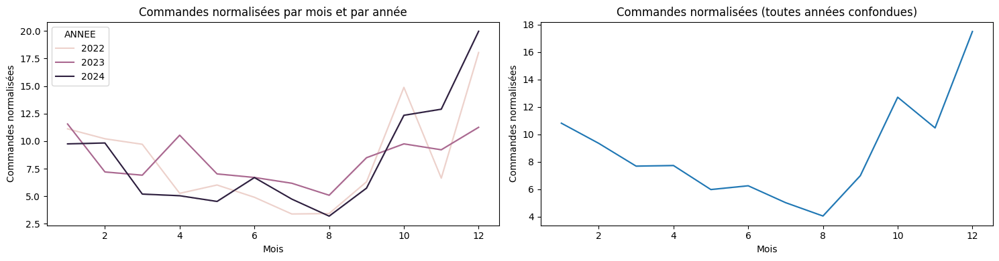

In [15]:
# Titre : "Evolution du volume d'achats par mois entre années"
# Description : Superposition des courbes mensuelles pour chaque année 
#               + Moyenne des commandes par mois sur toutes les années

plt.figure(figsize=(15, 4))

plt.subplot(1, 2, 1)
sns.lineplot(data=data_cmd, x='MOIS', y='COMMANDES_NORM', hue='ANNEE')
plt.title("Commandes normalisées par mois et par année")
plt.xlabel("Mois")
plt.ylabel("Commandes normalisées")

plt.subplot(1, 2, 2)
sns.lineplot(data=data_cmd, x='MOIS', y='COMMANDES_NORM')
plt.title("Commandes normalisées (toutes années confondues)")
plt.xlabel("Mois")
plt.ylabel("Commandes normalisées")

# Ajuster l'affichage
plt.tight_layout()
plt.show()

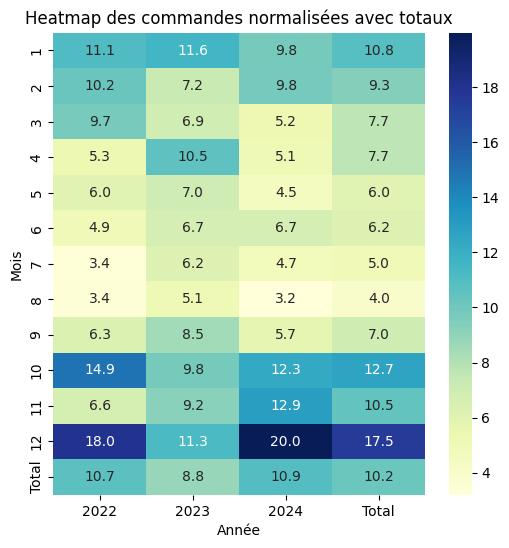

In [16]:
# Titre : "Intensité des achats par période (mois × année)"
# Description : Carte thermique montrant les périodes fortes/faibles

# pivot_norm = data_cmd.pivot_table(index='MOIS', columns='ANNEE', values='COMMANDES_NORM', aggfunc='mean')  
# sns.heatmap(pivot_norm, annot=True, fmt=".1f", cmap="YlGnBu") 

# Créer le pivot avec les marges
pivot_norm = data_cmd.pivot_table(
    index='MOIS',
    columns='ANNEE',
    values='COMMANDES_NORM',
    aggfunc='mean',
    margins=True,
    margins_name='Total'
)

# Tracer la heatmap
plt.figure(figsize=(6, 6))
sns.heatmap(pivot_norm, annot=True, fmt=".1f", cmap="YlGnBu")

plt.title("Heatmap des commandes normalisées avec totaux")
plt.xlabel("Année")
plt.ylabel("Mois")
plt.show()



Calcul des clusters KMeans: 100%|██████████| 4/4 [00:00<00:00, 10.36it/s]


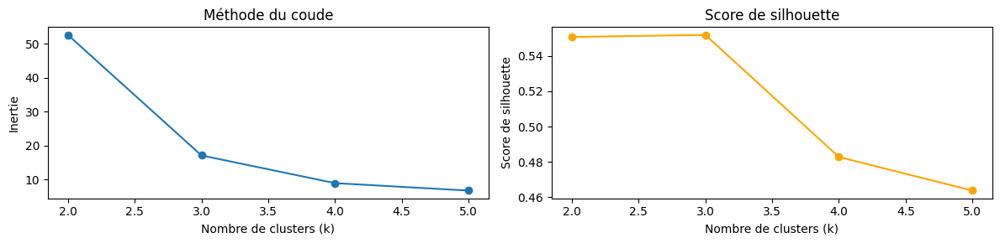

,MOIS,MOYENNE_COMMANDE,CLUSTER,SAISON
0,1,10.807342,1,HAUTE
1,2,9.338113,1,HAUTE
2,3,7.676062,3,MOYENNE
3,4,7.720721,3,MOYENNE
4,5,5.968533,3,MOYENNE
5,6,6.242696,3,MOYENNE
6,7,5.012567,0,BASSE
7,8,4.038721,0,BASSE
8,9,6.979598,3,MOYENNE
9,10,12.701166,1,HAUTE


In [17]:
# Moyenne des commandes normalisées par mois
commande_mois = data_cmd.groupby('MOIS')['COMMANDES_NORM'].mean().reset_index()
commande_mois.columns = ['MOIS', 'MOYENNE_COMMANDE']


inertias = []
silhouette_scores = []
k_range = range(2, 6)

for k in tqdm(k_range, desc="Calcul des clusters KMeans"):
    # Entrainement du modèle KMeans
    kmeans = KMeans(n_clusters=k, random_state=241)
    kmeans.fit(commande_mois[['MOYENNE_COMMANDE']])

    # Calcul de l'inertie
    inertias.append(kmeans.inertia_)
    
    # Calcul du score de silhouette
    score = silhouette_score(commande_mois[['MOYENNE_COMMANDE']], kmeans.labels_)
    silhouette_scores.append(score)


# Tracer la méthode du coude
plt.figure(figsize=(12, 3))
plt.subplot(1, 2, 1)
plt.plot(k_range, inertias, marker='o')
plt.xlabel('Nombre de clusters (k)')
plt.ylabel('Inertie')
plt.title("Méthode du coude")

# Tracer le score de silhouette
plt.subplot(1, 2, 2)
plt.plot(k_range, silhouette_scores, marker='o', color='orange')
plt.xlabel('Nombre de clusters (k)')
plt.ylabel('Score de silhouette')
plt.title("Score de silhouette")
plt.tight_layout()
plt.show()


# KMeans sur les moyennes mensuelles
kmeans = KMeans(n_clusters=4, random_state=241)
commande_mois['CLUSTER'] = kmeans.fit_predict(commande_mois[['MOYENNE_COMMANDE']])

# On trie les clusters par intensité de commande
cluster_order = commande_mois.groupby('CLUSTER')['MOYENNE_COMMANDE'].mean().sort_values().index

# Attribution des labels saisonniers
season_labels = ['BASSE', 'MOYENNE', 'HAUTE', 'TRES HAUTE']
cluster_map = dict(zip(cluster_order, season_labels))
commande_mois['SAISON'] = commande_mois['CLUSTER'].map(cluster_map)

# Resultats
commande_mois

# Analyse ciblée comportement d'achats

> Il faudrait observer les délais d'achat moyens par classe PMG pour affiner les new_indicators de co_appetence

In [ ]:
# je veux que tu me sorte la dataframe df avec pour chaque id_compte les colonnes suivantes issue de de data_cmd :
# 	1 - NB_COMMANDE - le nombre de DT_COMMANDE distinct de data_cmd associe à l'id,
#   2 - NB_GP - le nombre de GAMME_PRODUIT distinct de data_cmd associe à l'id,
# 	si le nombre de commande > 1 alors 
# 	3 - MOY_DELAI - le difference moyenne entre toutes les dates de commande de data_cmd associe à l'id,
#   4 - VAR_DELAI - la variance entre toutes les dates de commande de data_cmd associe à l'id,
# 	5 - CA_ANNUEL_ADDITI - la somme des MONTANT_HT des lignes des différents NUM_ORDRE dont DT_COMMANDE est entre date_obs_end et date_obs_end_past_12mois
# 	6 - CLASSE_PMG - tel que 
# 		CASE 
# 			WHEN COALESCE(CA_ANNUEL_ADDITI, 0) >= 50000 THEN 'Très gros'
# 			WHEN COALESCE(CA_ANNUEL_ADDITI, 0) >= 20000 THEN 'Gros'
# 			WHEN COALESCE(CA_ANNUEL_ADDITI, 0) >= 5000 THEN 'Moyen'
# 			WHEN COALESCE(CA_ANNUEL_ADDITI, 0) >= 1500 THEN 'Petit'
# 			WHEN COALESCE(CA_ANNUEL_ADDITI, 0) > 0 THEN 'Très petit'
# 			WHEN COALESCE(CA_ANNUEL_ADDITI, 0) = 0 THEN 'Hors catégorie'
# 			ELSE 'X'
# 		END,
# 	7 - exclure les ID_COMPTE avec CLASSE_PMG = 'X' et = 'Hors catégorie'
# 	8 - exclure les ID_COMPTE avec NB_COMMANDE <= 1



In [18]:
data_cmd.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 910976 entries, 0 to 910975
Data columns (total 18 columns):
 #   Column          Non-Null Count   Dtype         
---  ------          --------------   -----         
 0   ID_COMPTE       910976 non-null  int64         
 1   DT_COMMANDE     910976 non-null  datetime64[ns]
 2   NUM_ORDRE       910976 non-null  object        
 3   STATUT          886775 non-null  object        
 4   MONTANT_HT      910976 non-null  float64       
 5   REG_DAF1        910976 non-null  object        
 6   LIB_DAF1        910976 non-null  object        
 7   REG_DAF2        910976 non-null  object        
 8   LIB_DAF2        910976 non-null  object        
 9   REG_DAF3        910976 non-null  object        
 10  LIB_DAF3        910976 non-null  object        
 11  REG_DAF4        910976 non-null  object        
 12  LIB_DAF4        910976 non-null  object        
 13  GAMME_PRODUIT   910976 non-null  object        
 14  MOIS            910976 non-null  int

In [19]:
data_cmd

,ID_COMPTE,DT_COMMANDE,NUM_ORDRE,STATUT,MONTANT_HT,REG_DAF1,LIB_DAF1,REG_DAF2,LIB_DAF2,REG_DAF3,LIB_DAF3,REG_DAF4,LIB_DAF4,GAMME_PRODUIT,MOIS,ANNEE,NB_COMMANDES,COMMANDES_NORM
0,10,2024-01-31,2575182400,Actif,0.00,D,Digital,DSV,Diversification BU,DSVCOM,Community Management,DDIOFERSOC,Classified,CM,1,2024,32965,9.755643
1,100002,2024-10-10,2596574900,Actif,41.72,P,Print,PPC,Pub Co PDLO,PPCPUB,Pub Co,PPCPUBRUBR,Produits rubriqués,PUB CO,10,2024,41727,12.348664
2,100002,2024-10-11,2596569700,Actif,0.00,P,Print,PPC,Pub Co PDLO,PPCPUB,Pub Co,PPCPUBHIST,Historique,PUB CO,10,2024,41727,12.348664
3,100002,2024-10-11,2596575500,Actif,0.00,P,Print,PPC,Pub Co PDLO,PPCPUB,Pub Co,PPCPUBMOLC,Module - locales,PUB CO,10,2024,41727,12.348664
4,100007,2022-05-10,2517678300,Actif,122.37,D,Digital,DDI,Display BU,DDIEDT,Editeurs PDLO,DDIEDTDCLS,Display classic Sites,DISPLAY,5,2022,17651,6.026515
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
910971,99996,2024-03-06,2579194200,Actif,0.00,P,Print,PPC,Pub Co PDLO,PPCPUB,Pub Co,PPCPUBMOLC,Module - locales,PUB CO,3,2024,17579,5.202319
910972,99996,2024-03-06,2579194500,Actif,58.73,P,Print,PPC,Pub Co PDLO,PPCPUB,Pub Co,PPCPUBMOLC,Module - locales,PUB CO,3,2024,17579,5.202319
910973,99996,2024-03-06,2579194600,Actif,28.66,P,Print,PPC,Pub Co PDLO,PPCPUB,Pub Co,PPCPUBMOLC,Module - locales,PUB CO,3,2024,17579,5.202319
910974,99996,2024-03-06,2579194700,Actif,10.34,P,Print,PPC,Pub Co PDLO,PPCPUB,Pub Co,PPCPUBMOLC,Module - locales,PUB CO,3,2024,17579,5.202319


In [20]:
# Étape 1 : ajouter la colonne YEAR_SUMMARY
data_cmd['YEAR_SUMMARY'] = data_cmd['DT_COMMANDE'].dt.year

# Étape 2 : grouper par ID_COMPTE et YEAR_SUMMARY
grouped = data_cmd.groupby(['ID_COMPTE', 'YEAR_SUMMARY'])

# Étape 3 : calculer les métriques demandées
df_summary = grouped.agg(
    NB_COMMANDE=('DT_COMMANDE', 'nunique'),
    NB_GP=('GAMME_PRODUIT', 'nunique'),
    CA_ANNUEL_ADDITI=('MONTANT_HT', 'sum')
).reset_index()

# Étape 4 : calcul des délais moyens et variances
def calculate_delai_stats(dates):
    if len(dates) > 1:
        deltas = (dates - dates.shift()).dropna().dt.days
        return deltas.mean(), deltas.var()
    return None, None

# Appliquer par ID_COMPTE et YEAR_SUMMARY
delai_stats = data_cmd.sort_values('DT_COMMANDE').groupby(['ID_COMPTE', 'YEAR_SUMMARY'])['DT_COMMANDE'] \
    .apply(lambda x: pd.Series(calculate_delai_stats(x))).unstack()
delai_stats.columns = ['MOY_DELAI', 'VAR_DELAI']
delai_stats = delai_stats.reset_index()

# Fusionner avec df_summary
df_summary = df_summary.merge(delai_stats, on=['ID_COMPTE', 'YEAR_SUMMARY'], how='left')

# Sécurité finale : regrouper à nouveau pour éviter les doublons potentiels
df_summary = df_summary.groupby(['ID_COMPTE', 'YEAR_SUMMARY'], as_index=False).agg({
    'NB_COMMANDE': 'max',  
    'NB_GP': 'max',
    'CA_ANNUEL_ADDITI': 'max',
    'MOY_DELAI': 'max',
    'VAR_DELAI': 'max'})

# Étape 5 : classification PMG
def classify_pmg(ca):
    if ca >= 50000:
        return 'Très gros'
    elif ca >= 20000:
        return 'Gros'
    elif ca >= 5000:
        return 'Moyen'
    elif ca >= 1500:
        return 'Petit'
    elif ca > 0:
        return 'Très petit'
    elif ca == 0:
        return 'Hors catégorie'
    else:
        return 'X'

df_summary['CLASSE_PMG'] = df_summary['CA_ANNUEL_ADDITI'].apply(classify_pmg)

# Étape 6 : filtrer les lignes à supprimer
df_summary = df_summary[~(
    ((df_summary['CLASSE_PMG'].isin(['X', 'Hors catégorie'])) | (df_summary['NB_COMMANDE'] <= 1))
)].reset_index(drop=True)


df_summary

,ID_COMPTE,YEAR_SUMMARY,NB_COMMANDE,NB_GP,CA_ANNUEL_ADDITI,MOY_DELAI,VAR_DELAI,CLASSE_PMG
0,10,2024,2,5,1974.95,0.416667,2.083333,Petit
1,18,2022,4,6,7361.54,5.638889,842.180159,Moyen
2,22,2022,2,1,401.77,3.781818,786.618182,Très petit
3,22,2023,3,4,4862.83,1.744565,519.480845,Petit
4,22,2024,3,1,1236.71,13.428571,2329.648352,Très petit
...,...,...,...,...,...,...,...,...
11500,947186,2024,2,1,11038.66,0.037975,0.113924,Moyen
11501,947227,2024,3,1,1474.16,0.428571,1.802198,Très petit
11502,947229,2024,2,1,16330.69,0.25,0.75,Moyen
11503,948246,2024,2,2,3350.00,12.0,NaN,Petit


In [21]:
df_summary['CLASSE_PMG'].value_counts(normalize=True)*100

CLASSE_PMG
Petit         34.219904
Très petit    28.448501
Moyen         28.431117
Gros           6.466754
Très gros      2.433724
Name: proportion, dtype: float64

In [22]:
# Calcul des statistiques par CLASSE_PMG
df_stats = df_summary.groupby('CLASSE_PMG').agg(
    MEAN_NB_COMM=('NB_COMMANDE', 'mean'),
    MEAN_NB_GP=('NB_GP', 'mean'),
    MEDIAN_MOY_DELAI=('MOY_DELAI', 'median'),
    MEAN_MOY_DELAI=('MOY_DELAI', 'mean'),
    VAR_MOY_DELAI=('MOY_DELAI', 'var'),
    STD_MOY_DELAI=('MOY_DELAI', 'std')
).reset_index()

# Affichage du tableau avec arrondi sans décimales
display(df_stats.round(0))

,CLASSE_PMG,MEAN_NB_COMM,MEAN_NB_GP,MEDIAN_MOY_DELAI,MEAN_MOY_DELAI,VAR_MOY_DELAI,STD_MOY_DELAI
0,Gros,9.0,4.0,2.423535,5.206465,147.539646,12.0
1,Moyen,6.0,3.0,4.016129,7.112334,146.082862,12.0
2,Petit,4.0,2.0,5.833333,10.945631,310.144126,18.0
3,Très gros,15.0,4.0,1.413194,3.088813,48.750179,7.0
4,Très petit,3.0,2.0,9.48,21.360555,1372.923355,37.0


In [23]:
# Confirmation/vérification des valeurs extrêmes dans la distribution des délais
# Calcul de l'écart absolu entre la moyenne et la médiane
for index, row in df_stats.iterrows():
    ecart_abs = abs(row['MEAN_MOY_DELAI'] - row['MEDIAN_MOY_DELAI']) / row['MEDIAN_MOY_DELAI']
    if ecart_abs > 0.15:
        print(f"{row['CLASSE_PMG']} - Écart absolu: {ecart_abs:.2f} (> 15%) - Outliers")
    else:
        print(f"{row['CLASSE_PMG']} - Écart absolu: {ecart_abs:.2f} (<= 15%) - Pas d outliers")
        

Gros - Écart absolu: 1.15 (> 15%) - Outliers
Moyen - Écart absolu: 0.77 (> 15%) - Outliers
Petit - Écart absolu: 0.88 (> 15%) - Outliers
Très gros - Écart absolu: 1.19 (> 15%) - Outliers
Très petit - Écart absolu: 1.25 (> 15%) - Outliers


In [24]:
# Définir les valeurs de alpha pour chaque CLASSE_PMG
alpha_values = {
    'Très gros': 0.5,
    'Gros': 1,
    'Moyen': 1,
    'Petit': 2,
    'Très petit': 2
}

# Calculer la colonne SEUIL
df_stats['SEUIL'] = df_stats.apply(
    lambda row: row['MEDIAN_MOY_DELAI'] + alpha_values[row['CLASSE_PMG']] * row['STD_MOY_DELAI'], axis=1 # On n'utilise que la médiane car on a des outliers partout
)

df_stats[['CLASSE_PMG','SEUIL']].round(0)



,CLASSE_PMG,SEUIL
0,Gros,15.0
1,Moyen,16.0
2,Petit,41.0
3,Très gros,5.0
4,Très petit,84.0


# Statistiques exploratoires
## Statistiques bivariées

- RAPPEL DE MATHEMATIQUES ET DE STATISTIQUE : Loi de distribution des variables

| Test                                                     | Utilité                                                          | Interprétation                                                          |
| -------------------------------------------------------- | ---------------------------------------------------------------- | ----------------------------------------------------------------------- |
| Kolmogorov-Smirnov / Cramér-von Mises / Anderson-Darling | Tester si une variable suit une loi normale, exponentielle, etc. | Permet de guider la transformation des variables ou le choix de modèle. |


### Variables quantitatives

| **N°** | **Test**                            | **Objectif**                                                                 | **Conditions d’application**                                          | **Hypothèse nulle (H₀)**        | **Interprétation si rejet de H₀ / seuils**                                                                     |
| ------ | ----------------------------------- | ---------------------------------------------------------------------------- | --------------------------------------------------------------------- | ------------------------------- | -------------------------------------------------------------------------------------------------------------- |
| **1**  | Shapiro-Wilk                        | Tester la **normalité** des variables (dans chaque groupe cible)             | Aucune                                                                | La distribution est **normale** | Si rejetée : utiliser des tests **non paramétriques**                                                          |
| **2A** | Bartlett                            | Tester l’**homogénéité des variances** entre groupes                         | **Normalité des données**                                             | Variances égales                | Si rejetée : le **T-test** classique n’est **pas fiable**                                                      |
| **2B** | Levene                              | Tester l’**homogénéité des variances** entre groupes                         | Données **non normales** OU présence **d’outliers** (non présent ici) | Variances égales                | Si rejetée : le **T-test** classique n’est **pas fiable**                                                      |
| **3A** | Test de Student (T-test)            | Comparer les **moyennes** entre G1 (`True`) et G2 (`False`)                  | **Normalité** + **homogénéité des variances**                         | Moyennes égales                 | Si p < 0.05 : la variable **discrimine** les groupes (ex : `CA_ANNUEL_ADDITI_N` plus élevé chez les acheteurs) |
| **3B** | Test de Welch                       | Comparer les **moyennes** (variances inégales)                               | **Normalité**, mais **non homogénéité des variances**                 | Moyennes égales                 | Idem T-test, mais **plus robuste**                                                                             |
| **3C** | Mann-Whitney-Wilcoxon (U)           | Comparer les **distributions** entre les 2 groupes (non paramétrique)        | Données **non normales**                                              | Distributions identiques        | Si p < 0.05 : la variable **discrimine** les groupes                                                           |
| **4**  | Corrélation point bisériale         | Estimer l’**association** entre une variable **quantitative** et **binaire** | —                                         | ρ = 0 (pas de corrélation)      | Donne la **force et direction** de l'association                                                               |
| **5**  | Distance de Kolmogorov-Smirnov (KS) | Mesurer la **distance entre deux distributions** (G1 vs G2)                  |  —                                                                | —        | KS < 0.1 : **Quasi-identiques** / 0.1–0.3 : **Modérées** / >0.3 : **Différences significatives**               |
| **6**  | Rapport de corrélation (Eta²)       | Mesurer la **force de relation** entre binaire et quantitative               |  —                                                                | —                               | Eta² < 0.01 : négligeable / 0.01–0.06 : faible / 0.06–0.14 : modérée / >0.14 : **forte**                       |


In [7]:
dt = data.copy()
dt.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 68476 entries, 0 to 68475
Columns: 157 entries, _ID_ to SAISON
dtypes: bool(26), float64(20), int64(40), object(71)
memory usage: 70.1+ MB


> Version initiale sans tri

------------------------------------------------------------------------------------------
Analyse de la variable 'NB_CONTACT_AVEC_EMAIL'



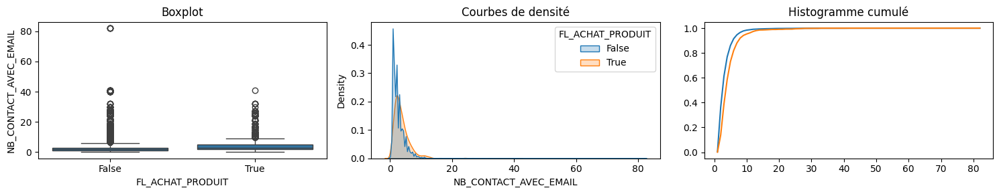


                    count      mean       std  min  25%  50%  75%   max
FL_ACHAT_PRODUIT                                                       
False             64094.0  2.682466  2.510377  0.0  1.0  2.0  3.0  82.0
True               4387.0  3.864372  3.307617  0.0  2.0  3.0  5.0  41.0

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(2.66), np.float64(2.7))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(3.77), np.float64(3.96))

Test de Shapiro-Wilk - Stat: 0.6204, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 208.2512, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 97384152.0000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: 0.1120, p-value: 0.0000 → Test significatif à 5%
Test de Kolmogorov-Smirnov - Stat: 0.2247, p-value: 0.0000 → Test significatif à 5%

Statistique KS : 0.22471541381881205
     Distributions modérément différentes
Eta2 : 7.374082561200157e-07
    Rela

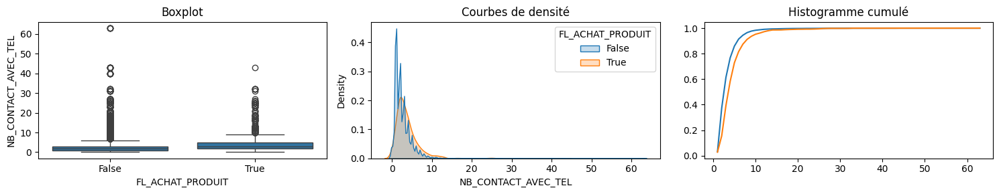


                    count      mean       std  min  25%  50%  75%   max
FL_ACHAT_PRODUIT                                                       
False             64094.0  2.647034  2.495611  0.0  1.0  2.0  3.0  63.0
True               4387.0  3.839982  3.343384  0.0  2.0  3.0  5.0  43.0

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(2.63), np.float64(2.67))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(3.74), np.float64(3.94))

Test de Shapiro-Wilk - Stat: 0.6634, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 248.3437, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 99106514.0000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: 0.1134, p-value: 0.0000 → Test significatif à 5%
Test de Kolmogorov-Smirnov - Stat: 0.2211, p-value: 0.0000 → Test significatif à 5%

Statistique KS : 0.22108758243436177
     Distributions modérément différentes
Eta2 : 7.1379085875632e-07
    Relat

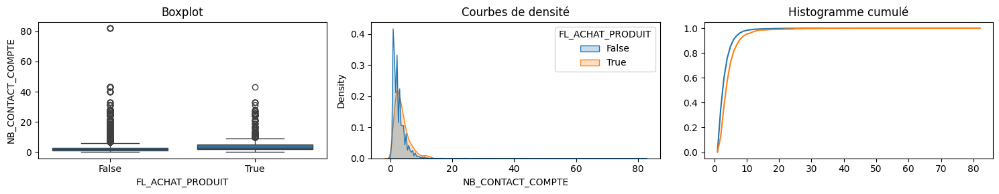


                    count      mean       std  min  25%  50%  75%   max
FL_ACHAT_PRODUIT                                                       
False             64094.0  2.755687  2.564462  0.0  1.0  2.0  3.0  82.0
True               4387.0  3.958970  3.359268  0.0  2.0  3.0  5.0  43.0

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(2.74), np.float64(2.78))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(3.86), np.float64(4.06))

Test de Shapiro-Wilk - Stat: 0.6280, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 194.0567, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 97387971.5000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: 0.1116, p-value: 0.0000 → Test significatif à 5%
Test de Kolmogorov-Smirnov - Stat: 0.2252, p-value: 0.0000 → Test significatif à 5%

Statistique KS : 0.225155490757609
     Distributions modérément différentes
Eta2 : 7.402993251774872e-07
    Relat

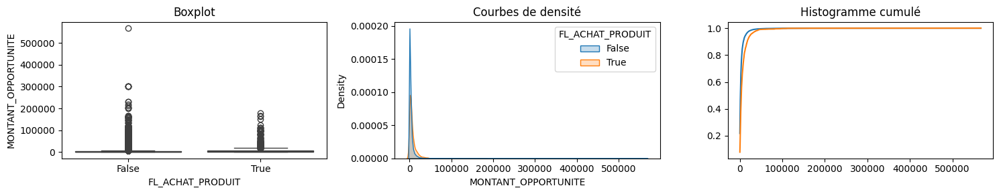


                    count         mean           std  min        25%      50%  \
FL_ACHAT_PRODUIT                                                                
False             64094.0  3539.974559   8541.723898  0.0   284.5225  1412.99   
True               4387.0  7129.526697  11755.445481  0.0  1291.6050  3333.50   

                        75%        max  
FL_ACHAT_PRODUIT                        
False             3611.1075  567037.00  
True              8448.4650  179381.02  

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(3473.85), np.float64(3606.1))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(6781.57), np.float64(7477.48))

Test de Shapiro-Wilk - Stat: 0.3669, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 394.7906, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 92884305.0000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: 0.0996, p-value: 0.0000 → Test signif

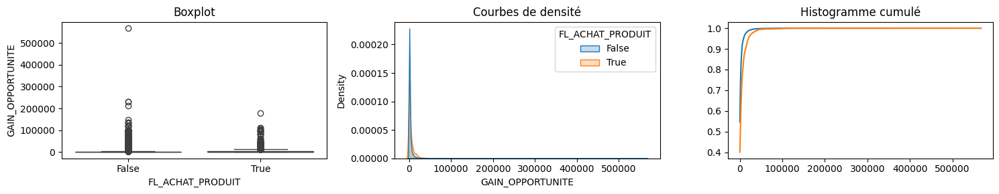


                    count         mean          std  min  25%      50%  \
FL_ACHAT_PRODUIT                                                         
False             64094.0  1866.512281  5949.511164  0.0  0.0     0.00   
True               4387.0  4606.430821  9495.983953  0.0  0.0  1153.82   

                       75%        max  
FL_ACHAT_PRODUIT                       
False             1733.615  567037.00  
True              5170.590  179381.02  

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(1820.45), np.float64(1912.57))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(4325.35), np.float64(4887.51))

Test de Shapiro-Wilk - Stat: 0.3103, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 724.1140, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 107964971.5000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: 0.1069, p-value: 0.0000 → Test significatif à 5%
Test de Kolmogorov

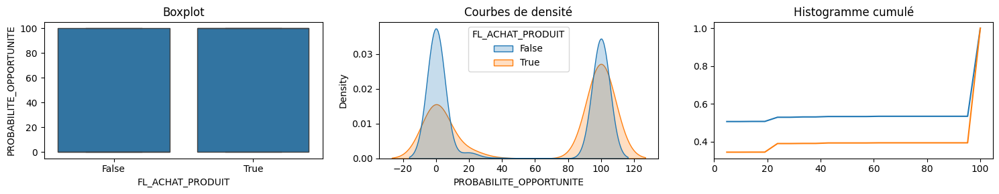


                    count       mean        std  min  25%    50%    75%    max
FL_ACHAT_PRODUIT                                                              
False             64094.0  47.299591  49.448113  0.0  0.0    0.0  100.0  100.0
True               4387.0  61.750627  47.755255  0.0  0.0  100.0  100.0  100.0

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(46.92), np.float64(47.68))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(60.34), np.float64(63.16))

Test de Shapiro-Wilk - Stat: 0.6486, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 138.1369, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 118696768.0000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: 0.0715, p-value: 0.0000 → Test significatif à 5%
Test de Kolmogorov-Smirnov - Stat: 0.1624, p-value: 0.0000 → Test significatif à 5%

Statistique KS : 0.1624260317339783
     Distributions modérément différentes
Eta2

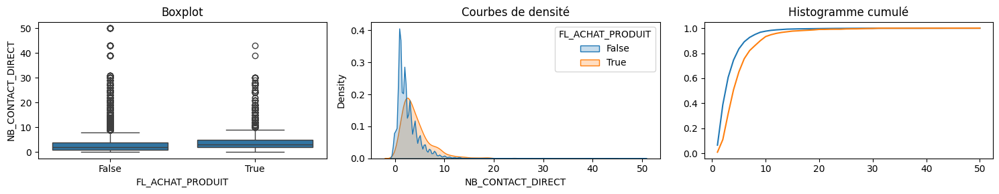


                    count      mean       std  min  25%  50%  75%   max
FL_ACHAT_PRODUIT                                                       
False             64094.0  2.749899  2.788833  0.0  1.0  2.0  4.0  50.0
True               4387.0  4.459767  3.769996  0.0  2.0  3.0  5.0  43.0

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(2.73), np.float64(2.77))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(4.35), np.float64(4.57))

Test de Shapiro-Wilk - Stat: 0.6924, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 314.1785, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 86778183.0000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: 0.1448, p-value: 0.0000 → Test significatif à 5%
Test de Kolmogorov-Smirnov - Stat: 0.2906, p-value: 0.0000 → Test significatif à 5%

Statistique KS : 0.29059681397824993
     Distributions modérément différentes
Eta2 : 1.2331722740871935e-06
    Re

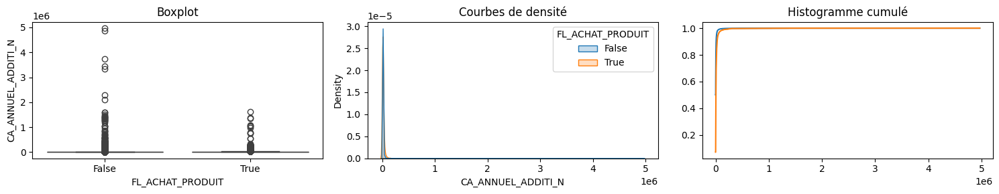


                    count          mean           std  min      25%      50%  \
FL_ACHAT_PRODUIT                                                               
False             64094.0   5570.381282  48747.702626  0.0     0.00     0.00   
True               4387.0  16172.647244  59856.891125  0.0  2937.28  6199.99   

                       75%         max  
FL_ACHAT_PRODUIT                        
False              4064.72  4967271.14  
True              13318.23  1621954.74  

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(5192.98), np.float64(5947.78))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(14400.91), np.float64(17944.38))

Test de Shapiro-Wilk - Stat: 0.0626, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 98.1123, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 63250820.0000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: 0.0523, p-value: 0.0000 → Test signific

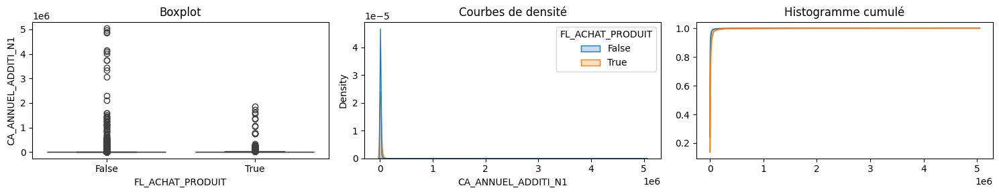


                    count          mean           std  min       25%  \
FL_ACHAT_PRODUIT                                                       
False             64094.0   6071.435604  66489.206466  0.0   190.000   
True               4387.0  14859.585867  71185.862213  0.0  1517.465   

                       50%       75%         max  
FL_ACHAT_PRODUIT                                  
False              988.985   3598.42  5045274.39  
True              4460.010  11650.33  1857839.29  

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(5556.68), np.float64(6586.19))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(12752.52), np.float64(16966.65))

Test de Shapiro-Wilk - Stat: 0.0446, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 50.7968, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 85759515.5000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: 0.0322, p-value: 0.0000 → Test 

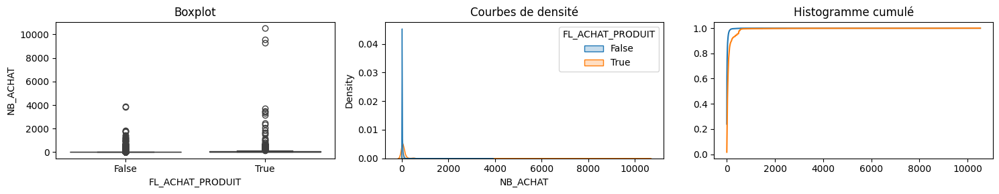


                    count       mean         std  min   25%   50%   75%  \
FL_ACHAT_PRODUIT                                                          
False             64094.0  16.634646   48.454199  1.0   2.0   5.0  15.0   
True               4387.0  90.223387  312.657591  1.0  15.0  35.0  76.0   

                      max  
FL_ACHAT_PRODUIT           
False              3915.0  
True              10525.0  

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(16.26), np.float64(17.01))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(80.97), np.float64(99.48))

Test de Shapiro-Wilk - Stat: 0.1370, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 1794.7094, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 50648689.5000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: 0.1923, p-value: 0.0000 → Test significatif à 5%
Test de Kolmogorov-Smirnov - Stat: 0.5016, p-value: 0.0000 → Test sign

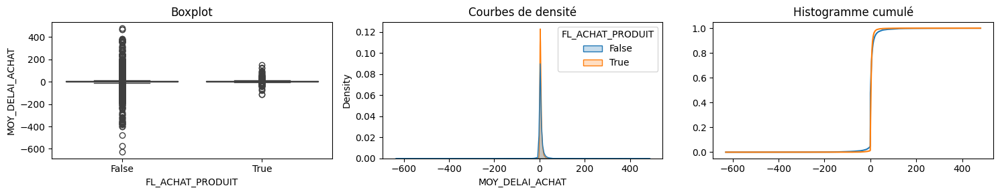


                    count      mean        std    min       25%       50%  \
FL_ACHAT_PRODUIT                                                            
False             48760.0  4.223994  23.039849 -630.0  0.000000  0.666667   
True               4315.0  4.223972   8.278518 -114.0  0.764982  2.766667   

                       75%    max  
FL_ACHAT_PRODUIT                   
False             5.796875  480.0  
True              5.493732  149.0  

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(4.02), np.float64(4.43))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(3.98), np.float64(4.47))

Test de Shapiro-Wilk - Stat: 0.3843, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 133.3724, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 83144238.5000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: -0.0000, p-value: 1.0000 → Test non significatif à 5%
Test de Kolmogorov-Smirnov - S

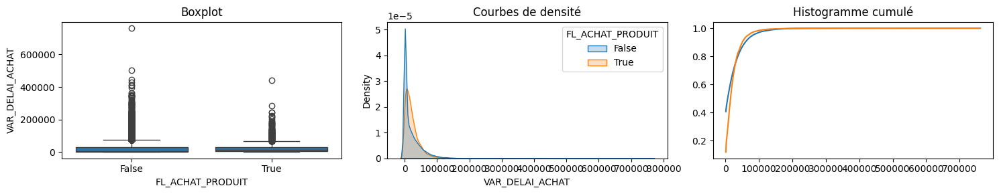


                    count          mean           std  min          25%  \
FL_ACHAT_PRODUIT                                                          
False             48760.0  20719.267840  32058.134476  0.0     0.000000   
True               4315.0  22380.830181  25663.495493  0.0  5684.240413   

                           50%           75%       max  
FL_ACHAT_PRODUIT                                        
False              7000.000000  30187.218562  761378.0  
True              15418.339491  30206.275218  442225.0  

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(20434.71), np.float64(21003.82))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(21614.89), np.float64(23146.77))

Test de Shapiro-Wilk - Stat: 0.6833, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 68.5842, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 82825149.5000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale -

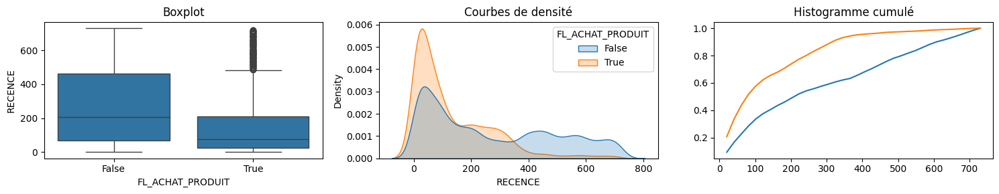


                    count        mean         std  min   25%    50%    75%  \
FL_ACHAT_PRODUIT                                                             
False             48760.0  272.336382  222.467513  0.0  69.0  208.0  461.0   
True               4315.0  130.774971  137.649854  0.0  26.0   78.0  209.0   

                    max  
FL_ACHAT_PRODUIT         
False             730.0  
True              720.0  

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(270.36), np.float64(274.31))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(126.67), np.float64(134.88))

Test de Shapiro-Wilk - Stat: 0.8963, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 2088.7979, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 144952436.5000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: -0.1757, p-value: 0.0000 → Test significatif à 5%
Test de Kolmogorov-Smirnov - Stat: 0.3106, p-value: 0.0000 →

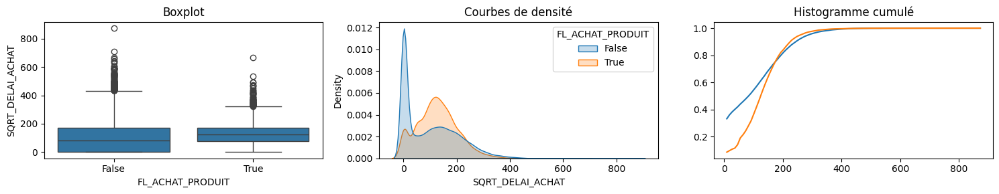


                    count        mean         std       min        25%  \
FL_ACHAT_PRODUIT                                                         
False             48760.0  101.567374  101.999039  0.175036   1.000000   
True               4315.0  127.948238   77.534031  0.272166  75.393901   

                         50%         75%         max  
FL_ACHAT_PRODUIT                                      
False              83.666003  173.744693  872.569768  
True              124.170606  173.799520  665.000000  

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(100.66), np.float64(102.47))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(125.63), np.float64(130.26))

Test de Shapiro-Wilk - Stat: 0.8894, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 760.7072, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 83019617.0000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: 0.0717, p-va

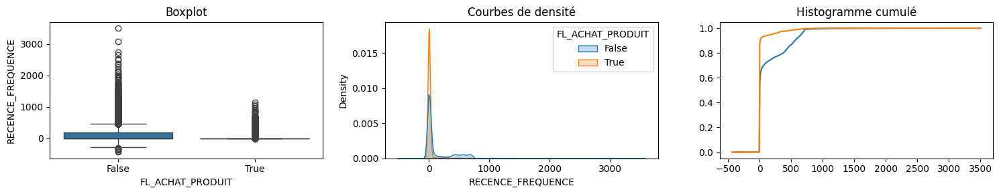


                    count        mean         std         min       25%  \
FL_ACHAT_PRODUIT                                                          
False             48760.0  138.898654  242.102335 -437.000000  0.377129   
True               4315.0   25.513304  105.348505   -4.357722  0.130256   

                       50%         75%          max  
FL_ACHAT_PRODUIT                                     
False             2.350689  186.000000  3503.246708  
True              0.553500    1.569242  1153.734982  

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(136.75), np.float64(141.05))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(22.37), np.float64(28.66))

Test de Shapiro-Wilk - Stat: 0.6125, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 937.2938, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 143462530.0000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: -0.1313, p-va

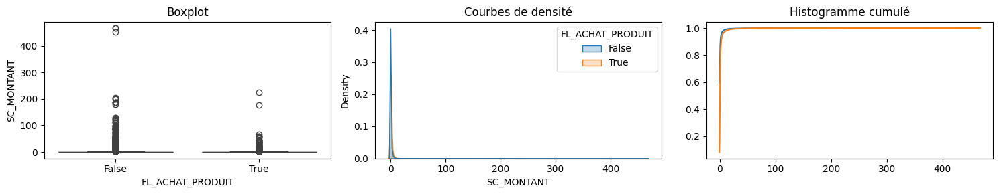


                    count      mean       std  min       25%       50%  \
FL_ACHAT_PRODUIT                                                         
False             53861.0 -0.035515  5.444374 -1.0 -1.000000 -1.000000   
True               3832.0  1.059045  6.105666 -1.0 -0.248046  0.100287   

                       75%         max  
FL_ACHAT_PRODUIT                        
False            -0.000361  467.444000  
True              0.775329  225.185827  

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(-0.08), np.float64(0.01))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(0.87), np.float64(1.25))

Test de Shapiro-Wilk - Stat: 0.1204, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 24.6882, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 49146262.0000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: 0.0496, p-value: 0.0000 → Test significatif à 5%
Test de Kolmogorov-Smirnov 

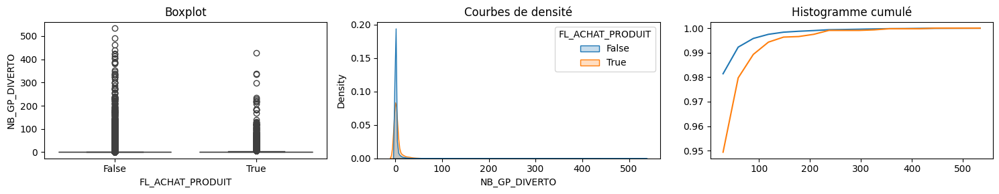


                    count      mean        std  min  25%  50%  75%    max
FL_ACHAT_PRODUIT                                                         
False             64094.0  2.372032  13.805455  0.0  0.0  0.0  0.0  534.0
True               4387.0  5.600182  20.488787  0.0  0.0  0.0  2.0  427.0

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(2.27), np.float64(2.48))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(4.99), np.float64(6.21))

Test de Shapiro-Wilk - Stat: 0.1641, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 208.4471, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 123622125.5000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: 0.0551, p-value: 0.0000 → Test significatif à 5%
Test de Kolmogorov-Smirnov - Stat: 0.1138, p-value: 0.0000 → Test significatif à 5%

Statistique KS : 0.11378930573882362
     Distributions modérément différentes
Eta2 : 1.8907991723470781e-

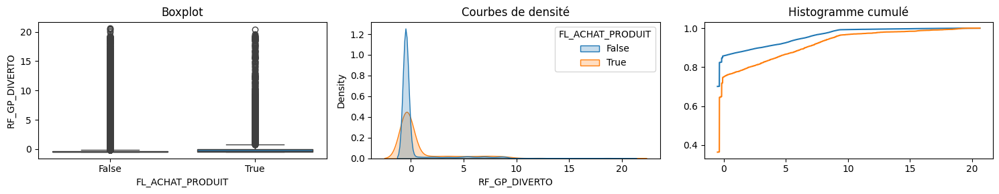


                    count      mean       std       min       25%       50%  \
FL_ACHAT_PRODUIT                                                              
False             64094.0  0.334844  2.382452 -0.513514 -0.513514 -0.513514   
True               4387.0  1.205728  3.548580 -0.513514 -0.513514 -0.351351   

                       75%        max  
FL_ACHAT_PRODUIT                       
False            -0.351351  20.628571  
True             -0.006757  20.371429  

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(0.32), np.float64(0.35))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(1.1), np.float64(1.31))

Test de Shapiro-Wilk - Stat: 0.4210, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 460.4855, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 94484601.5000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: 0.0859, p-value: 0.0000 → Test significatif à 5%
Test de Kolm

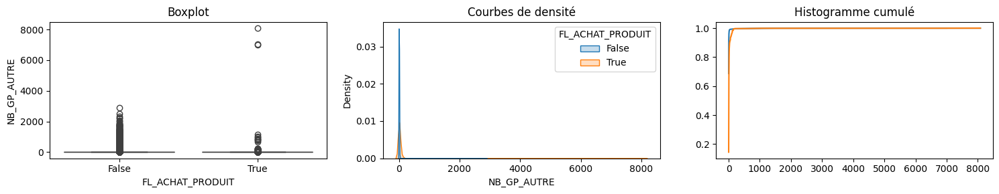


                    count       mean         std  min  25%  50%   75%     max
FL_ACHAT_PRODUIT                                                             
False             64094.0   5.139576   63.205463  0.0  0.0  0.0   1.0  2890.0
True               4387.0  20.116253  198.418646  0.0  2.0  4.0  11.0  8083.0

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(4.65), np.float64(5.63))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(14.24), np.float64(25.99))

Test de Shapiro-Wilk - Stat: 0.0421, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 117.0720, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 48806999.0000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: 0.0463, p-value: 0.0000 → Test significatif à 5%
Test de Kolmogorov-Smirnov - Stat: 0.5557, p-value: 0.0000 → Test significatif à 5%

Statistique KS : 0.555692534846795
    Distributions significativement différentes
Eta2 :

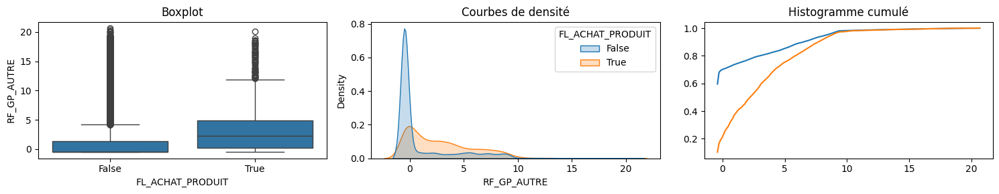


                    count      mean       std       min       25%       50%  \
FL_ACHAT_PRODUIT                                                              
False             64094.0  1.194277  3.232772 -0.513514 -0.513514 -0.513514   
True               4387.0  2.985275  3.290284 -0.513514  0.175676  2.243243   

                       75%        max  
FL_ACHAT_PRODUIT                       
False             1.378378  20.657143  
True              4.922874  20.085714  

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(1.17), np.float64(1.22))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(2.89), np.float64(3.08))

Test de Shapiro-Wilk - Stat: 0.6306, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 314.0184, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 70114838.5000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: 0.1343, p-value: 0.0000 → Test significatif à 5%
Test de Kol

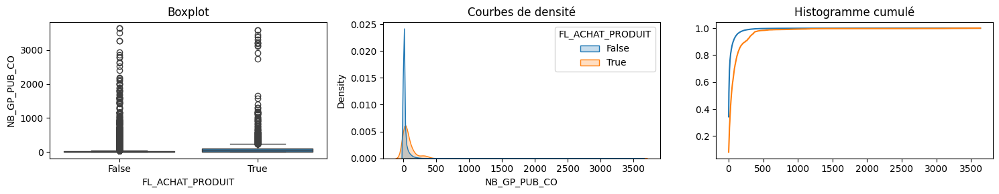


                    count       mean         std  min   25%   50%    75%  \
FL_ACHAT_PRODUIT                                                           
False             64094.0  25.179284   82.832039  0.0   0.0   4.0   19.0   
True               4387.0  93.687486  212.270876  0.0  12.0  39.0  102.0   

                     max  
FL_ACHAT_PRODUIT          
False             3637.0  
True              3589.0  

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(24.54), np.float64(25.82))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(87.4), np.float64(99.97))

Test de Shapiro-Wilk - Stat: 0.2612, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 1385.7781, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 65072898.5000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: 0.1713, p-value: 0.0000 → Test significatif à 5%
Test de Kolmogorov-Smirnov - Stat: 0.4281, p-value: 0.0000 → Test signi

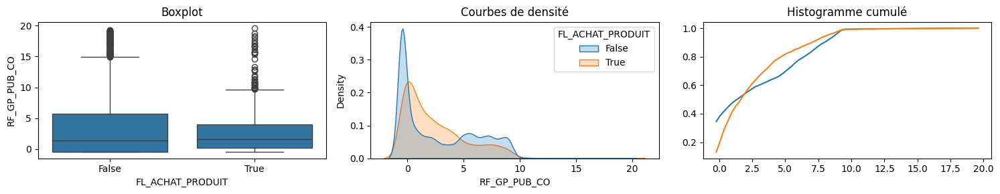


                    count      mean       std       min       25%       50%  \
FL_ACHAT_PRODUIT                                                              
False             64094.0  2.721183  3.440224 -0.513514 -0.513514  1.351351   
True               4387.0  2.483146  2.851622 -0.513514  0.202703  1.621622   

                       75%        max  
FL_ACHAT_PRODUIT                       
False             5.675676  19.297297  
True              3.972973  19.600000  

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(2.69), np.float64(2.75))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(2.4), np.float64(2.57))

Test de Shapiro-Wilk - Stat: 0.8480, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 440.4934, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 130069001.5000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: -0.0171, p-value: 0.0000 → Test significatif à 5%
Test de Ko

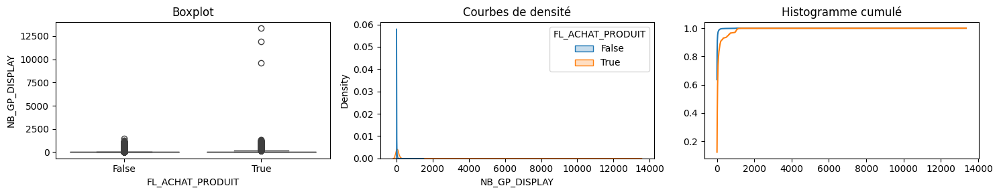


                    count        mean         std  min  25%   50%   75%  \
FL_ACHAT_PRODUIT                                                          
False             64094.0    8.856757   48.711919  0.0  0.0   0.0   4.0   
True               4387.0  100.206291  369.489119  0.0  7.0  22.0  62.0   

                      max  
FL_ACHAT_PRODUIT           
False              1493.0  
True              13353.0  

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(8.48), np.float64(9.23))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(89.27), np.float64(111.14))

Test de Shapiro-Wilk - Stat: 0.0911, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 2651.7541, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 45689576.5000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: 0.2089, p-value: 0.0000 → Test significatif à 5%
Test de Kolmogorov-Smirnov - Stat: 0.5693, p-value: 0.0000 → Test signi

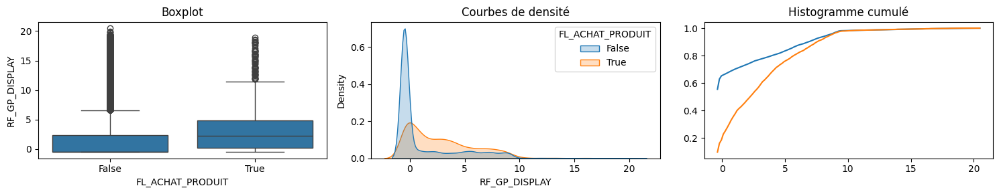


                    count      mean       std       min       25%       50%  \
FL_ACHAT_PRODUIT                                                              
False             64094.0  1.411192  3.319066 -0.513514 -0.513514 -0.513514   
True               4387.0  2.952695  3.197225 -0.513514  0.257143  2.243243   

                       75%        max  
FL_ACHAT_PRODUIT                       
False             2.337838  20.485714  
True              4.837838  18.945946  

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(1.39), np.float64(1.44))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(2.86), np.float64(3.05))

Test de Shapiro-Wilk - Stat: 0.6718, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 138.5139, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 76802142.5000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: 0.1133, p-value: 0.0000 → Test significatif à 5%
Test de Kol

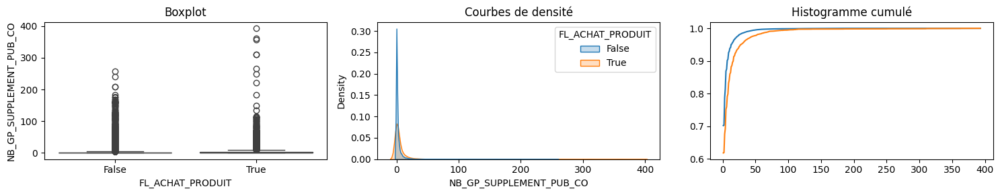


                    count      mean        std  min  25%  50%  75%    max
FL_ACHAT_PRODUIT                                                         
False             64094.0  2.568665   8.407398  0.0  0.0  0.0  2.0  258.0
True               4387.0  5.798496  18.481747  0.0  0.0  0.0  4.0  393.0

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(2.5), np.float64(2.63))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(5.25), np.float64(6.35))

Test de Shapiro-Wilk - Stat: 0.2953, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 486.5430, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 124401679.5000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: 0.0840, p-value: 0.0000 → Test significatif à 5%
Test de Kolmogorov-Smirnov - Stat: 0.1225, p-value: 0.0000 → Test significatif à 5%

Statistique KS : 0.12249942988553775
     Distributions modérément différentes
Eta2 : 2.1913443586977409e-0

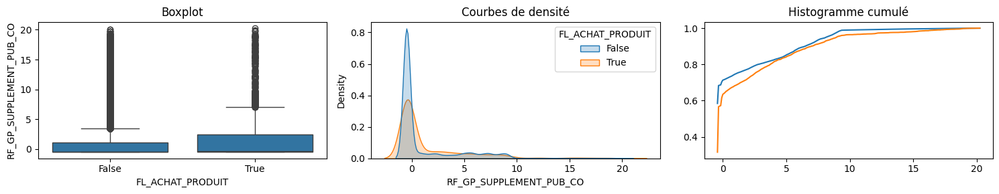


                    count      mean       std       min       25%       50%  \
FL_ACHAT_PRODUIT                                                              
False             64094.0  1.116466  3.065380 -0.513514 -0.513514 -0.513514   
True               4387.0  1.626746  3.711045 -0.513514 -0.513514 -0.351351   

                       75%        max  
FL_ACHAT_PRODUIT                       
False             1.067568  20.085714  
True              2.500659  20.257143  

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(1.09), np.float64(1.14))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(1.52), np.float64(1.74))

Test de Shapiro-Wilk - Stat: 0.6055, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 86.3027, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 109807748.0000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: 0.0401, p-value: 0.0000 → Test significatif à 5%
Test de Kol

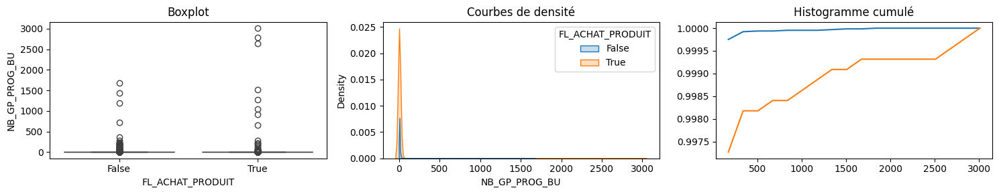


                    count      mean        std  min  25%  50%  75%     max
FL_ACHAT_PRODUIT                                                          
False             64094.0  0.812572  11.436637  0.0  0.0  0.0  0.0  1674.0
True               4387.0  5.186460  83.197474  0.0  0.0  0.0  1.0  3011.0

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(0.72), np.float64(0.9))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(2.72), np.float64(7.65))

Test de Shapiro-Wilk - Stat: 0.0152, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 138.8426, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 120558239.0000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: 0.0450, p-value: 0.0000 → Test significatif à 5%
Test de Kolmogorov-Smirnov - Stat: 0.1366, p-value: 0.0000 → Test significatif à 5%

Statistique KS : 0.1366101655927071
     Distributions modérément différentes
Eta2 : 2.725263549013287e

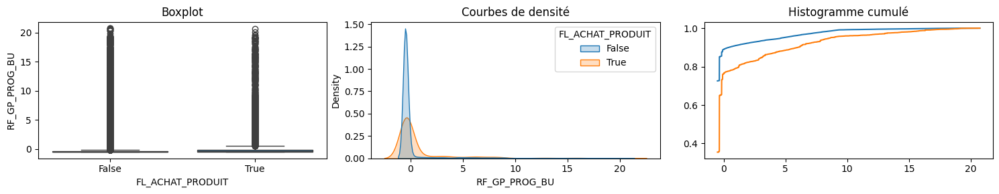


                    count      mean       std       min       25%       50%  \
FL_ACHAT_PRODUIT                                                              
False             64094.0  0.104315  2.093656 -0.513514 -0.513514 -0.513514   
True               4387.0  1.087818  3.558725 -0.513514 -0.513514 -0.351351   

                       75%        max  
FL_ACHAT_PRODUIT                       
False            -0.351351  20.742857  
True             -0.085714  20.600000  

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(0.09), np.float64(0.12))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(0.98), np.float64(1.19))

Test de Shapiro-Wilk - Stat: 0.3455, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 736.8425, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 88595685.5000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: 0.1080, p-value: 0.0000 → Test significatif à 5%
Test de Kol

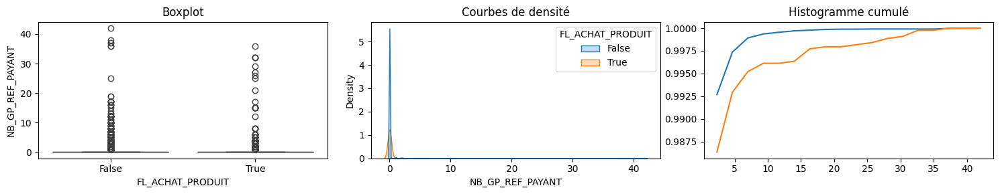


                    count      mean       std  min  25%  50%  75%   max
FL_ACHAT_PRODUIT                                                       
False             64094.0  0.068150  0.635300  0.0  0.0  0.0  0.0  42.0
True               4387.0  0.204468  1.567569  0.0  0.0  0.0  0.0  36.0

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(0.06), np.float64(0.07))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(0.16), np.float64(0.25))

Test de Shapiro-Wilk - Stat: 0.0768, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 142.5779, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 136144922.5000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: 0.0456, p-value: 0.0000 → Test significatif à 5%
Test de Kolmogorov-Smirnov - Stat: 0.0314, p-value: 0.0006 → Test significatif à 5%

Statistique KS : 0.0313676120031392
     Distributions quasi-identiques
Eta2 : 1.4368303693718064e-08
    Relation

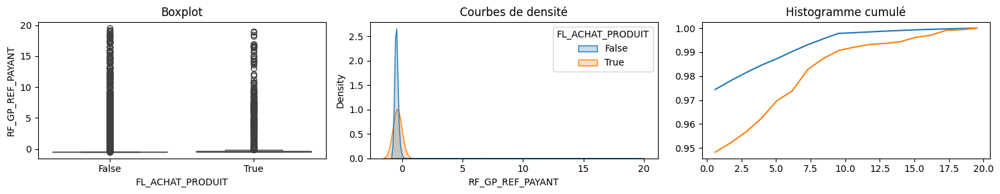


                    count      mean       std       min       25%       50%  \
FL_ACHAT_PRODUIT                                                              
False             64094.0 -0.317796  1.105015 -0.513514 -0.513514 -0.513514   
True               4387.0 -0.018171  1.854493 -0.513514 -0.513514 -0.351351   

                       75%        max  
FL_ACHAT_PRODUIT                       
False            -0.513514  19.514286  
True             -0.351351  19.027027  

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(-0.33), np.float64(-0.31))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(-0.07), np.float64(0.04))

Test de Shapiro-Wilk - Stat: 0.1690, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 222.8058, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 89087692.0000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: 0.0627, p-value: 0.0000 → Test significatif à 5%
Test de 

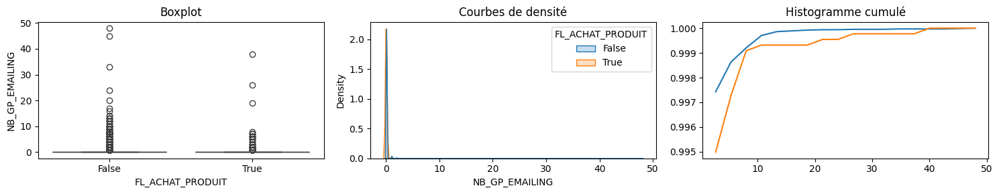


                    count      mean       std  min  25%  50%  75%   max
FL_ACHAT_PRODUIT                                                       
False             64094.0  0.032811  0.486922  0.0  0.0  0.0  0.0  48.0
True               4387.0  0.055847  0.842244  0.0  0.0  0.0  0.0  38.0

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(0.03), np.float64(0.04))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(0.03), np.float64(0.08))

Test de Shapiro-Wilk - Stat: 0.0379, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 8.1498, p-value: 0.0043 → Test significatif à 5%
Test de Mann-Whitney - Stat: 140310729.5000, p-value: 0.2954 → Test non significatif à 5%
Corrélation point bisériale - Stat: 0.0109, p-value: 0.0043 → Test significatif à 5%
Test de Kolmogorov-Smirnov - Stat: 0.0027, p-value: 1.0000 → Test non significatif à 5%

Statistique KS : 0.0026855785790287356
     Distributions quasi-identiques
Eta2 : 1.053218111155009e-10
    

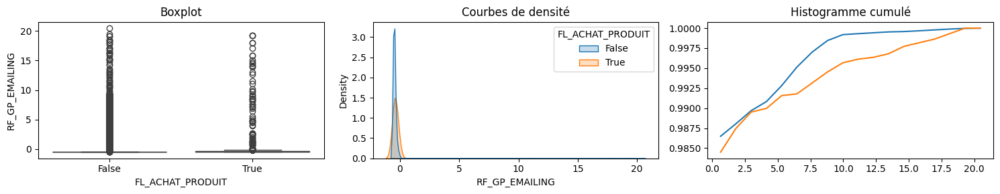


                    count      mean       std       min       25%       50%  \
FL_ACHAT_PRODUIT                                                              
False             64094.0 -0.387312  0.814055 -0.513514 -0.513514 -0.513514   
True               4387.0 -0.266567  1.203012 -0.513514 -0.513514 -0.351351   

                       75%        max  
FL_ACHAT_PRODUIT                       
False            -0.513514  20.457143  
True             -0.351351  19.216216  

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(-0.39), np.float64(-0.38))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(-0.3), np.float64(-0.23))

Test de Shapiro-Wilk - Stat: 0.1266, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 53.9565, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 90106078.5000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: 0.0350, p-value: 0.0000 → Test significatif à 5%
Test de K

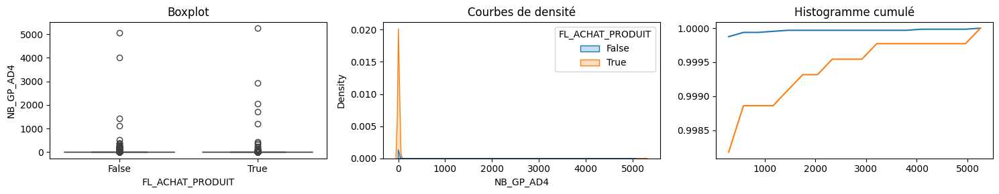


                    count      mean         std  min  25%  50%  75%     max
FL_ACHAT_PRODUIT                                                           
False             64094.0  1.055341   27.503238  0.0  0.0  0.0  0.0  5052.0
True               4387.0  4.544108  101.749841  0.0  0.0  0.0  0.0  5254.0

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(0.84), np.float64(1.27))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(1.53), np.float64(7.56))

Test de Shapiro-Wilk - Stat: 0.0106, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 36.4499, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 136715642.0000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: 0.0231, p-value: 0.0000 → Test significatif à 5%
Test de Kolmogorov-Smirnov - Stat: 0.0298, p-value: 0.0013 → Test significatif à 5%

Statistique KS : 0.02980769518703763
     Distributions quasi-identiques
Eta2 : 1.297476132588513e-

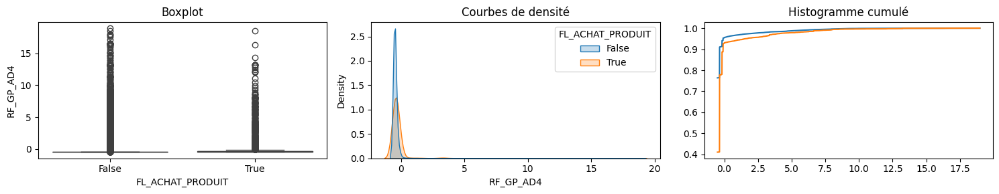


                    count      mean       std       min       25%       50%  \
FL_ACHAT_PRODUIT                                                              
False             64094.0 -0.296101  1.059032 -0.513514 -0.513514 -0.513514   
True               4387.0 -0.085312  1.415448 -0.513514 -0.513514 -0.351351   

                       75%        max  
FL_ACHAT_PRODUIT                       
False            -0.513514  18.972973  
True             -0.351351  18.594595  

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(-0.3), np.float64(-0.29))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(-0.13), np.float64(-0.04))

Test de Shapiro-Wilk - Stat: 0.2087, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 115.9483, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 91421194.5000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: 0.0475, p-value: 0.0000 → Test significatif à 5%
Test de 

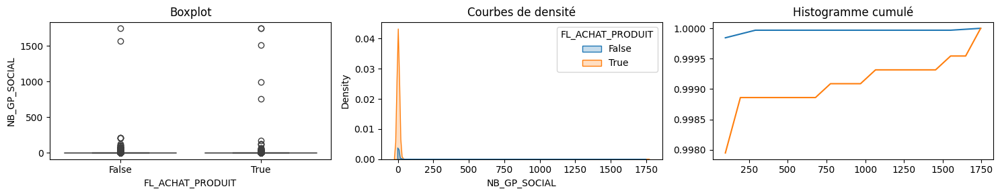


                    count      mean        std  min  25%  50%  75%     max
FL_ACHAT_PRODUIT                                                          
False             64094.0  0.452679   9.827071  0.0  0.0  0.0  0.0  1746.0
True               4387.0  2.503533  47.890923  0.0  0.0  0.0  0.0  1746.0

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(0.38), np.float64(0.53))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(1.09), np.float64(3.92))

Test de Shapiro-Wilk - Stat: 0.0117, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 72.7805, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 130153662.5000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: 0.0326, p-value: 0.0000 → Test significatif à 5%
Test de Kolmogorov-Smirnov - Stat: 0.0734, p-value: 0.0000 → Test significatif à 5%

Statistique KS : 0.07338533772082767
     Distributions quasi-identiques
Eta2 : 7.864319526970685e-08
 

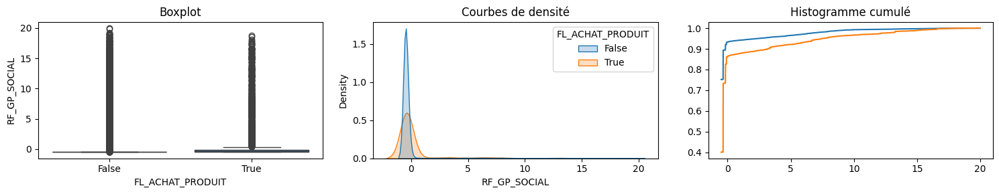


                    count      mean       std       min       25%       50%  \
FL_ACHAT_PRODUIT                                                              
False             64094.0 -0.066097  1.853163 -0.513514 -0.513514 -0.513514   
True               4387.0  0.577822  3.026559 -0.513514 -0.513514 -0.351351   

                       75%        max  
FL_ACHAT_PRODUIT                       
False            -0.513514  19.971429  
True             -0.170732  18.810811  

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(-0.08), np.float64(-0.05))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(0.49), np.float64(0.67))

Test de Shapiro-Wilk - Stat: 0.2680, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 406.0101, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 91195581.5000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: 0.0806, p-value: 0.0000 → Test significatif à 5%
Test de K

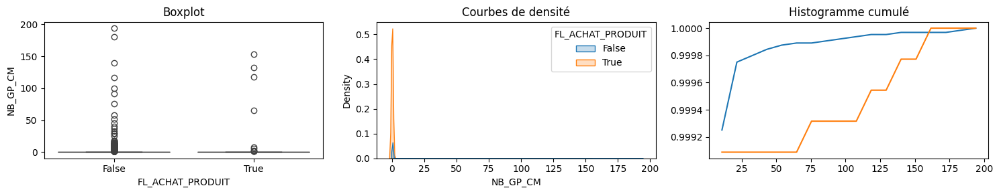


                    count      mean       std  min  25%  50%  75%    max
FL_ACHAT_PRODUIT                                                        
False             64094.0  0.097497  1.584359  0.0  0.0  0.0  0.0  194.0
True               4387.0  0.111238  3.668916  0.0  0.0  0.0  0.0  153.0

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(0.09), np.float64(0.11))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(0.0), np.float64(0.22))

Test de Shapiro-Wilk - Stat: 0.0233, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 0.2414, p-value: 0.6232 → Test non significatif à 5%
Test de Mann-Whitney - Stat: 146766968.0000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: 0.0019, p-value: 0.6232 → Test non significatif à 5%
Test de Kolmogorov-Smirnov - Stat: 0.0440, p-value: 0.0000 → Test significatif à 5%

Statistique KS : 0.043996320397577615
     Distributions quasi-identiques
Eta2 : 2.82667117482893e-08
   

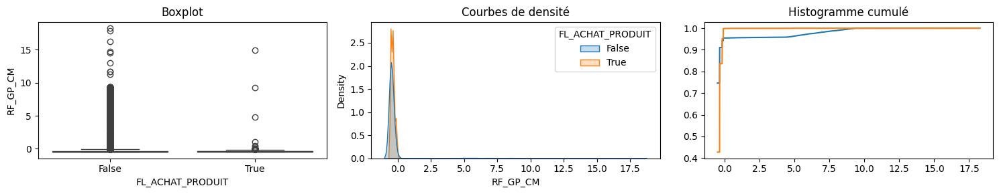


                    count      mean       std       min       25%       50%  \
FL_ACHAT_PRODUIT                                                              
False             64094.0 -0.156651  1.497869 -0.513514 -0.513514 -0.513514   
True               4387.0 -0.379720  0.314032 -0.513514 -0.513514 -0.351351   

                       75%        max  
FL_ACHAT_PRODUIT                       
False            -0.351351  18.270270  
True             -0.351351  14.945946  

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(-0.17), np.float64(-0.15))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(-0.39), np.float64(-0.37))

Test de Shapiro-Wilk - Stat: 0.2384, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 118.6047, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 98106438.0000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: -0.0376, p-value: 0.0000 → Test significatif à 5%
Test d

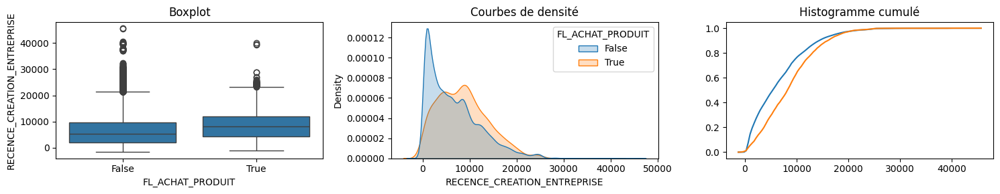


                    count         mean          std     min     25%     50%  \
FL_ACHAT_PRODUIT                                                              
False             64094.0  6602.852919  5558.160499 -1673.0  1936.0  5358.5   
True               4387.0  8588.533850  5389.844675 -1132.0  4326.5  8186.0   

                      75%      max  
FL_ACHAT_PRODUIT                    
False              9711.0  45657.0  
True              11916.0  40146.0  

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(6559.82), np.float64(6645.88))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(8429.0), np.float64(8748.07))

Test de Shapiro-Wilk - Stat: 0.9088, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 0.9638, p-value: 0.3262 → Test non significatif à 5%
Test de Mann-Whitney - Stat: 106890689.0000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: 0.0873, p-value: 0.0000 → Test significatif à 5%
Test de K

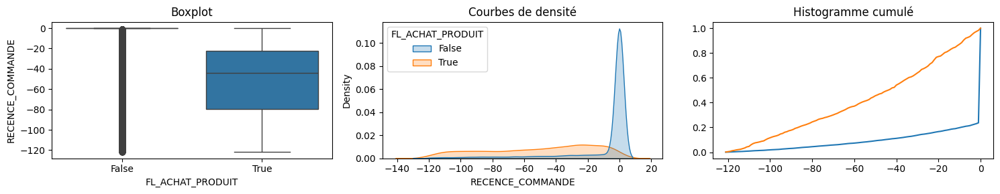


                    count       mean        std    min   25%   50%   75%  max
FL_ACHAT_PRODUIT                                                             
False             64094.0 -10.698115  25.059808 -122.0   0.0   0.0   0.0  0.0
True               4387.0 -50.782083  34.220189 -122.0 -79.5 -44.0 -22.0  0.0

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(-10.89), np.float64(-10.5))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(-51.79), np.float64(-49.77))

Test de Shapiro-Wilk - Stat: 0.5543, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 2296.1291, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 250780251.5000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: -0.3562, p-value: 0.0000 → Test significatif à 5%
Test de Kolmogorov-Smirnov - Stat: 0.7531, p-value: 0.0000 → Test significatif à 5%

Statistique KS : 0.753066904974429
    Distributions significativement différente

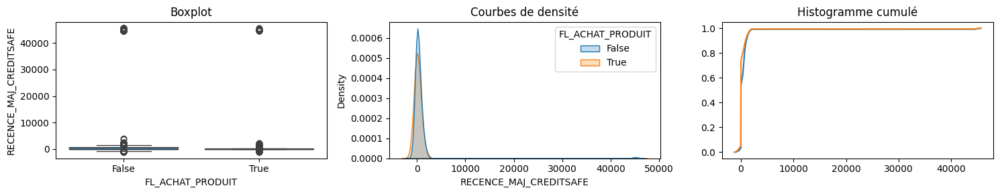


                    count       mean          std     min  25%  50%    75%  \
FL_ACHAT_PRODUIT                                                             
False             64094.0  699.92795  4179.047250 -1243.0  0.0  0.0  595.0   
True               4387.0  446.21085  3532.219057 -1237.0  0.0  0.0   88.0   

                      max  
FL_ACHAT_PRODUIT           
False             45657.0  
True              45657.0  

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(667.57), np.float64(732.28))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(341.66), np.float64(550.76))

Test de Shapiro-Wilk - Stat: 0.1210, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 12.7325, p-value: 0.0004 → Test significatif à 5%
Test de Mann-Whitney - Stat: 168446830.5000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: -0.0150, p-value: 0.0001 → Test significatif à 5%
Test de Kolmogorov-Smirnov - Stat: 0.1992, p-value: 0.

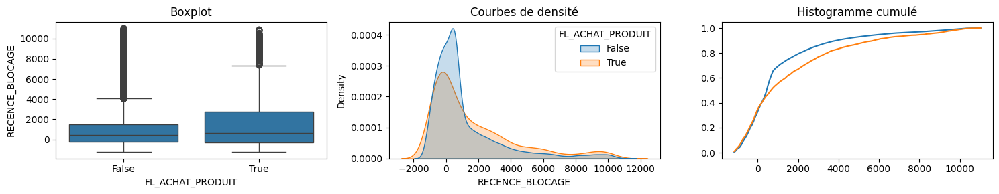


                    count         mean          std     min     25%    50%  \
FL_ACHAT_PRODUIT                                                             
False             64094.0  1106.249040  2208.749784 -1247.0 -209.75  439.0   
True               4387.0  1668.031457  2709.643725 -1245.0 -258.50  656.0   

                     75%      max  
FL_ACHAT_PRODUIT                   
False             1507.0  11034.0  
True              2789.0  10912.0  

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(1089.15), np.float64(1123.35))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(1587.83), np.float64(1748.24))

Test de Shapiro-Wilk - Stat: 0.7600, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 397.7101, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 128695038.5000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: 0.0612, p-value: 0.0000 → Test significatif à 5%
Test de Kolmogorov

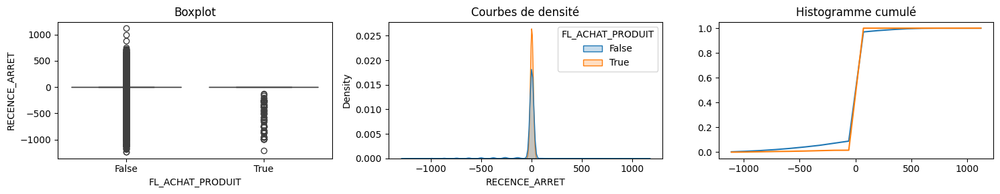


                    count       mean         std     min  25%  50%  75%  \
FL_ACHAT_PRODUIT                                                          
False             64094.0 -33.613443  171.885098 -1241.0  0.0  0.0  0.0   
True               4387.0  -9.039891   78.831723 -1214.0  0.0  0.0  0.0   

                     max  
FL_ACHAT_PRODUIT          
False             1122.0  
True                 0.0  

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(-34.94), np.float64(-32.28))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(-11.37), np.float64(-6.71))

Test de Shapiro-Wilk - Stat: 0.3863, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 280.1966, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 133523168.0000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: 0.0359, p-value: 0.0000 → Test significatif à 5%
Test de Kolmogorov-Smirnov - Stat: 0.0850, p-value: 0.0000 → Test signi

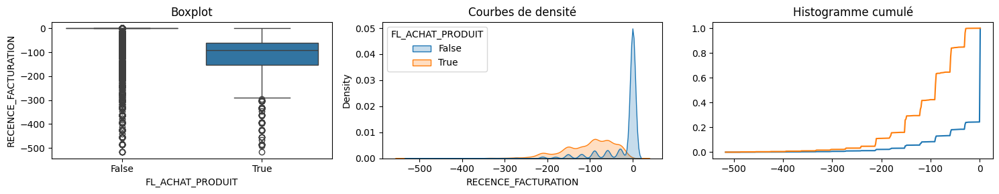


                    count        mean        std    min    25%   50%   75%  \
FL_ACHAT_PRODUIT                                                             
False             64094.0  -23.879661  55.268818 -517.0    0.0   0.0   0.0   
True               4387.0 -108.811488  69.458578 -518.0 -152.0 -90.0 -60.0   

                  max  
FL_ACHAT_PRODUIT       
False             1.0  
True              1.0  

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(-24.31), np.float64(-23.45))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(-110.87), np.float64(-106.76))

Test de Shapiro-Wilk - Stat: 0.5644, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 942.2727, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 251036722.0000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: -0.3466, p-value: 0.0000 → Test significatif à 5%
Test de Kolmogorov-Smirnov - Stat: 0.7577, p-value: 0.0000 → Test s

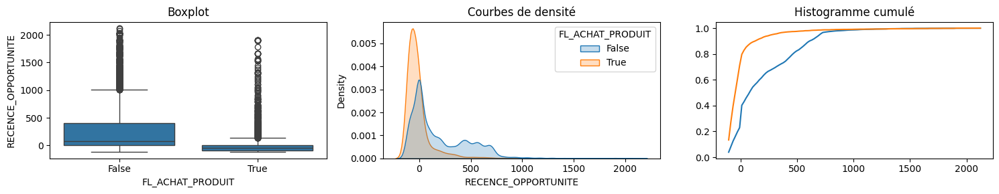


                    count        mean         std    min   25%   50%    75%  \
FL_ACHAT_PRODUIT                                                              
False             64094.0  196.776219  287.683288 -123.0   0.0  79.0  405.0   
True               4387.0   -0.605197  191.491580 -123.0 -88.0 -46.0    0.0   

                     max  
FL_ACHAT_PRODUIT          
False             2122.0  
True              1907.0  

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(194.55), np.float64(199.0))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(-6.27), np.float64(5.06))

Test de Shapiro-Wilk - Stat: 0.8439, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 1528.0232, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 217128820.5000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: -0.1686, p-value: 0.0000 → Test significatif à 5%
Test de Kolmogorov-Smirnov - Stat: 0.4943, p-value: 0.00

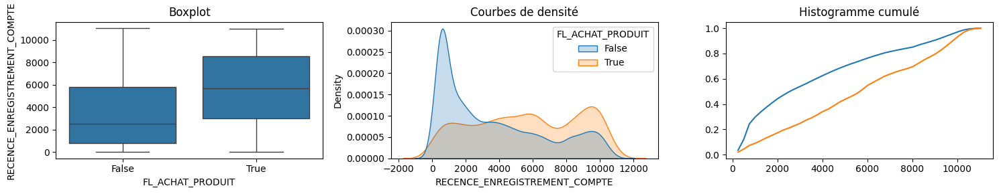


                    count         mean          std   min     25%     50%  \
FL_ACHAT_PRODUIT                                                            
False             64094.0  3600.669173  3132.156318   2.0   786.0  2549.0   
True               4387.0  5610.248689  3130.882073  16.0  3034.5  5663.0   

                     75%      max  
FL_ACHAT_PRODUIT                   
False             5793.0  11048.0  
True              8535.5  10985.0  

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(3576.42), np.float64(3624.92))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(5517.58), np.float64(5702.92))

Test de Shapiro-Wilk - Stat: 0.8845, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 13.1090, p-value: 0.0003 → Test significatif à 5%
Test de Mann-Whitney - Stat: 89564154.5000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: 0.1552, p-value: 0.0000 → Test significatif à 5%
Test de Kolmogorov-Smirn

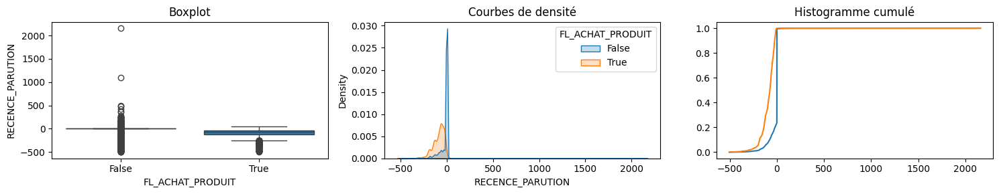


                    count       mean        std    min    25%   50%   75%  \
FL_ACHAT_PRODUIT                                                            
False             64094.0 -19.418479  51.397664 -506.0    0.0   0.0   0.0   
True               4387.0 -92.508320  67.988804 -502.0 -129.0 -74.0 -44.0   

                     max  
FL_ACHAT_PRODUIT          
False             2160.0  
True                49.0  

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(-19.82), np.float64(-19.02))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(-94.52), np.float64(-90.5))

Test de Shapiro-Wilk - Stat: 0.5284, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 1362.9590, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 251598053.0000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: -0.3220, p-value: 0.0000 → Test significatif à 5%
Test de Kolmogorov-Smirnov - Stat: 0.7728, p-value: 0.0000 → 

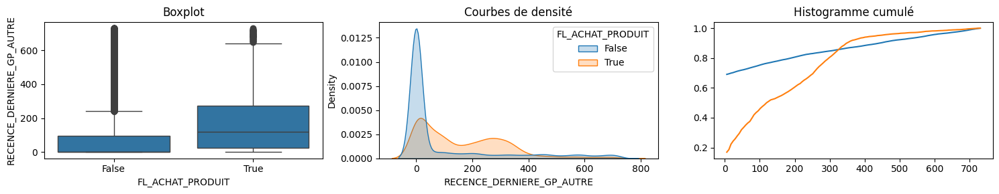


                    count        mean         std  min   25%    50%    75%  \
FL_ACHAT_PRODUIT                                                             
False             64094.0   99.262224  190.425519  0.0   0.0    0.0   97.0   
True               4387.0  164.521085  154.414032  0.0  25.0  119.0  273.0   

                    max  
FL_ACHAT_PRODUIT         
False             730.0  
True              729.0  

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(97.79), np.float64(100.74))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(159.95), np.float64(169.09))

Test de Shapiro-Wilk - Stat: 0.6151, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 90.6439, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 77001905.5000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: 0.0845, p-value: 0.0000 → Test significatif à 5%
Test de Kolmogorov-Smirnov - Stat: 0.5397, p-value: 0.0000 → Test

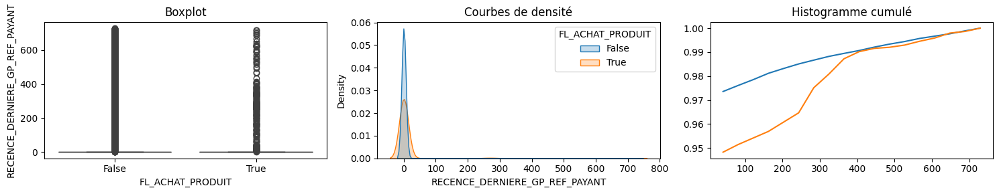


                    count       mean        std  min  25%  50%  75%    max
FL_ACHAT_PRODUIT                                                          
False             64094.0   8.631962  61.335154  0.0  0.0  0.0  0.0  729.0
True               4387.0  15.969227  76.720385  0.0  0.0  0.0  0.0  717.0

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(8.16), np.float64(9.11))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(13.7), np.float64(18.24))

Test de Shapiro-Wilk - Stat: 0.1315, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 56.7070, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 136221240.5000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: 0.0288, p-value: 0.0000 → Test significatif à 5%
Test de Kolmogorov-Smirnov - Stat: 0.0312, p-value: 0.0007 → Test significatif à 5%

Statistique KS : 0.03118647205175884
     Distributions quasi-identiques
Eta2 : 1.4202836274208339e-08

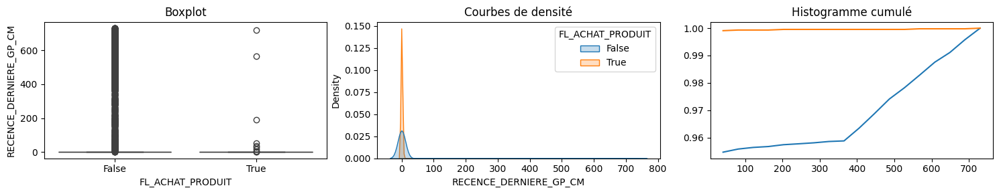


                    count       mean         std  min  25%  50%  75%    max
FL_ACHAT_PRODUIT                                                           
False             64094.0  23.030143  110.298366  0.0  0.0  0.0  0.0  730.0
True               4387.0   0.370413   14.168286  0.0  0.0  0.0  0.0  720.0

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(22.18), np.float64(23.88))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(-0.05), np.float64(0.79))

Test de Shapiro-Wilk - Stat: 0.2004, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 184.9452, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 146783078.5000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: -0.0519, p-value: 0.0000 → Test significatif à 5%
Test de Kolmogorov-Smirnov - Stat: 0.0445, p-value: 0.0000 → Test significatif à 5%

Statistique KS : 0.044496365959078465
     Distributions quasi-identiques
Eta2 : 2.89129006895

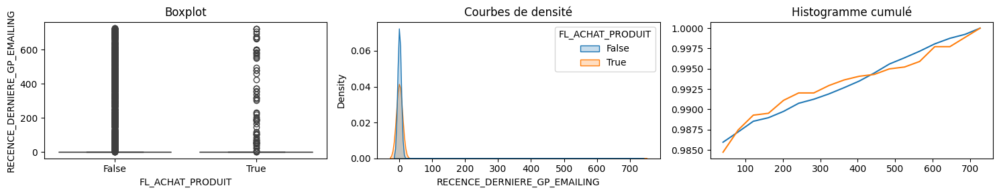


                    count      mean        std  min  25%  50%  75%    max
FL_ACHAT_PRODUIT                                                         
False             64094.0  5.130184  49.031577  0.0  0.0  0.0  0.0  727.0
True               4387.0  5.170504  50.394369  0.0  0.0  0.0  0.0  724.0

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(4.75), np.float64(5.51))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(3.68), np.float64(6.66))

Test de Shapiro-Wilk - Stat: 0.0801, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 0.0028, p-value: 0.9581 → Test non significatif à 5%
Test de Mann-Whitney - Stat: 140319461.5000, p-value: 0.3107 → Test non significatif à 5%
Corrélation point bisériale - Stat: 0.0002, p-value: 0.9581 → Test non significatif à 5%
Test de Kolmogorov-Smirnov - Stat: 0.0020, p-value: 1.0000 → Test non significatif à 5%

Statistique KS : 0.0019680285087317895
     Distributions quasi-identiques
Eta2 : 5.65594738

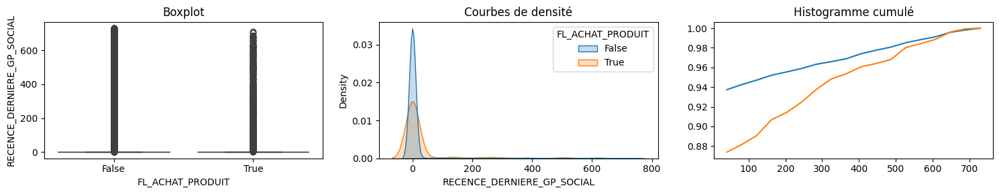


                    count       mean         std  min  25%  50%  75%    max
FL_ACHAT_PRODUIT                                                           
False             64094.0  22.403111   99.143864  0.0  0.0  0.0  0.0  730.0
True               4387.0  40.396171  123.138237  0.0  0.0  0.0  0.0  709.0

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(21.64), np.float64(23.17))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(36.75), np.float64(44.04))

Test de Shapiro-Wilk - Stat: 0.2480, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 130.6943, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 130506476.5000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: 0.0436, p-value: 0.0000 → Test significatif à 5%
Test de Kolmogorov-Smirnov - Stat: 0.0727, p-value: 0.0000 → Test significatif à 5%

Statistique KS : 0.07271632233170977
     Distributions quasi-identiques
Eta2 : 7.721583441869

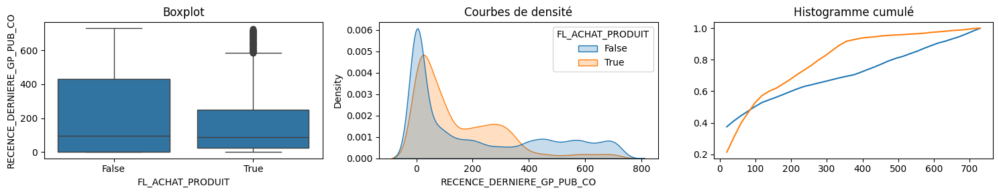


                    count        mean         std  min   25%   50%    75%  \
FL_ACHAT_PRODUIT                                                            
False             64094.0  214.102287  241.419626  0.0   0.0  96.0  430.0   
True               4387.0  149.435605  155.602362  0.0  27.0  90.0  250.0   

                    max  
FL_ACHAT_PRODUIT         
False             730.0  
True              726.0  

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(212.23), np.float64(215.97))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(144.83), np.float64(154.04))

Test de Shapiro-Wilk - Stat: 0.8179, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 878.0804, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 139664293.5000, p-value: 0.4575 → Test non significatif à 5%
Corrélation point bisériale - Stat: -0.0667, p-value: 0.0000 → Test significatif à 5%
Test de Kolmogorov-Smirnov - Stat: 0.2494, p-value: 0.0000 → 

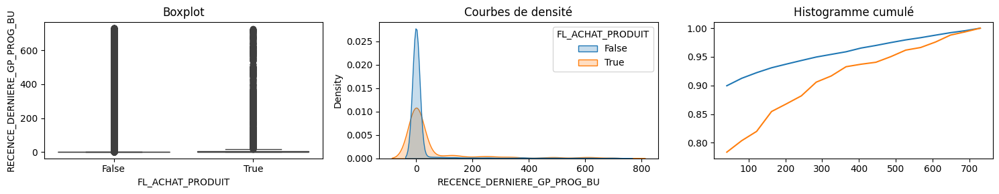


                    count       mean         std  min  25%  50%  75%    max
FL_ACHAT_PRODUIT                                                           
False             64094.0  32.468515  115.812097  0.0  0.0  0.0  0.0  730.0
True               4387.0  66.067016  153.387455  0.0  0.0  0.0  7.5  727.0

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(31.57), np.float64(33.37))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(61.53), np.float64(70.61))

Test de Shapiro-Wilk - Stat: 0.3274, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 329.6551, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 121559856.0000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: 0.0692, p-value: 0.0000 → Test significatif à 5%
Test de Kolmogorov-Smirnov - Stat: 0.1362, p-value: 0.0000 → Test significatif à 5%

Statistique KS : 0.13615614742505255
     Distributions modérément différentes
Eta2 : 2.707179

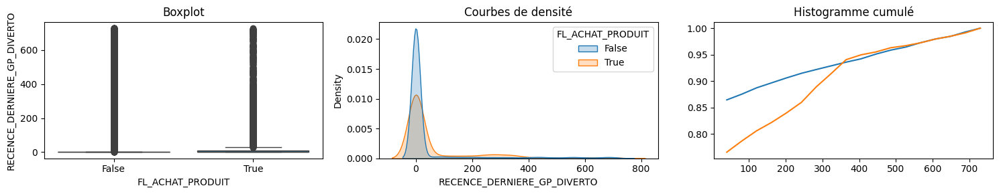


                    count       mean         std  min  25%  50%   75%    max
FL_ACHAT_PRODUIT                                                            
False             64094.0  48.402144  143.118943  0.0  0.0  0.0   0.0  729.0
True               4387.0  70.507408  152.372802  0.0  0.0  0.0  11.5  729.0

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(47.29), np.float64(49.51))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(66.0), np.float64(75.02))

Test de Shapiro-Wilk - Stat: 0.3966, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 97.1213, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 125409721.0000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: 0.0376, p-value: 0.0000 → Test significatif à 5%
Test de Kolmogorov-Smirnov - Stat: 0.1137, p-value: 0.0000 → Test significatif à 5%

Statistique KS : 0.1136549720407588
     Distributions modérément différentes
Eta2 : 1.88633

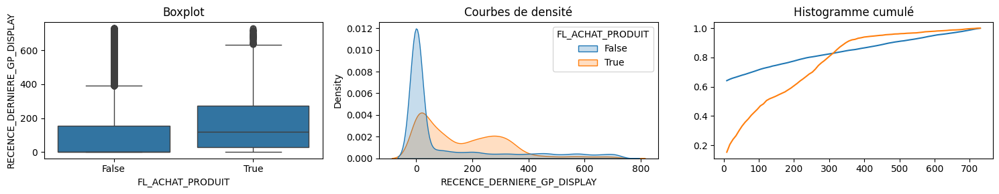


                    count        mean         std  min   25%    50%    75%  \
FL_ACHAT_PRODUIT                                                             
False             64094.0  114.696212  200.407172  0.0   0.0    0.0  156.0   
True               4387.0  165.022567  154.917299  0.0  31.0  119.0  272.5   

                    max  
FL_ACHAT_PRODUIT         
False             730.0  
True              729.0  

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(113.14), np.float64(116.25))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(160.44), np.float64(169.61))

Test de Shapiro-Wilk - Stat: 0.6553, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 14.5545, p-value: 0.0001 → Test significatif à 5%
Test de Mann-Whitney - Stat: 83740710.0000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: 0.0622, p-value: 0.0000 → Test significatif à 5%
Test de Kolmogorov-Smirnov - Stat: 0.5099, p-value: 0.0000 → Tes

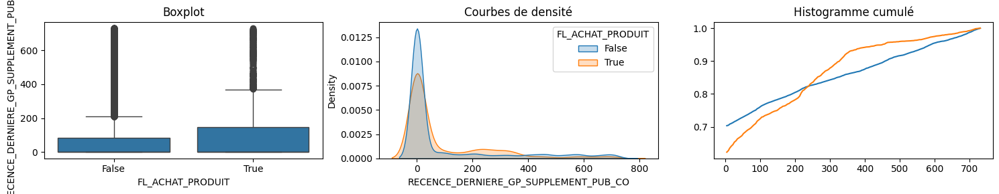


                    count        mean         std  min  25%  50%     75%  \
FL_ACHAT_PRODUIT                                                           
False             64094.0  100.302899  194.973385  0.0  0.0  0.0   84.75   
True               4387.0   92.039435  161.523649  0.0  0.0  0.0  148.00   

                    max  
FL_ACHAT_PRODUIT         
False             730.0  
True              730.0  

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(98.79), np.float64(101.81))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(87.26), np.float64(96.82))

Test de Shapiro-Wilk - Stat: 0.5828, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 7.5267, p-value: 0.0061 → Test significatif à 5%
Test de Mann-Whitney - Stat: 132723331.5000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: -0.0105, p-value: 0.0061 → Test significatif à 5%
Test de Kolmogorov-Smirnov - Stat: 0.0839, p-value: 0.0000 → Test signific

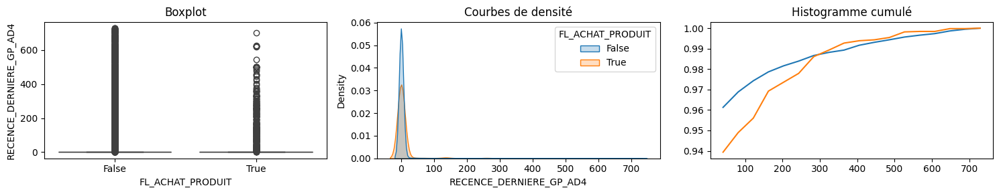


                    count       mean        std  min  25%  50%  75%    max
FL_ACHAT_PRODUIT                                                          
False             64094.0   9.894140  60.280914  0.0  0.0  0.0  0.0  729.0
True               4387.0  13.122179  60.701603  0.0  0.0  0.0  0.0  701.0

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(9.43), np.float64(10.36))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(11.33), np.float64(14.92))

Test de Shapiro-Wilk - Stat: 0.1610, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 11.7637, p-value: 0.0006 → Test significatif à 5%
Test de Mann-Whitney - Stat: 136854038.0000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: 0.0131, p-value: 0.0006 → Test significatif à 5%
Test de Kolmogorov-Smirnov - Stat: 0.0266, p-value: 0.0059 → Test significatif à 5%

Statistique KS : 0.026605057057004222
     Distributions quasi-identiques
Eta2 : 1.0336439692314692e

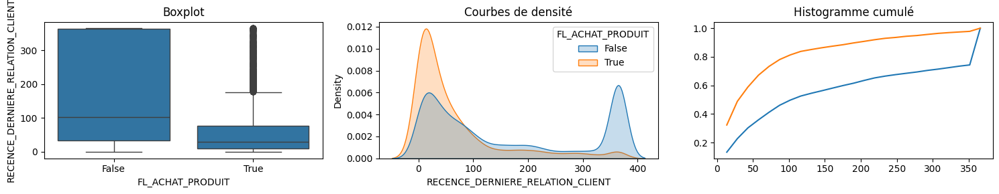


                    count        mean         std  min   25%    50%    75%  \
FL_ACHAT_PRODUIT                                                             
False             64094.0  162.884841  142.398164 -1.0  33.0  103.0  365.0   
True               4387.0   64.258035   85.441428 -1.0  10.0   30.0   77.0   

                    max  
FL_ACHAT_PRODUIT         
False             366.0  
True              366.0  

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(161.78), np.float64(163.99))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(61.73), np.float64(66.79))

Test de Shapiro-Wilk - Stat: 0.8180, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 2503.2323, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 201644875.5000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: -0.1706, p-value: 0.0000 → Test significatif à 5%
Test de Kolmogorov-Smirnov - Stat: 0.3241, p-value: 0.0000 → T

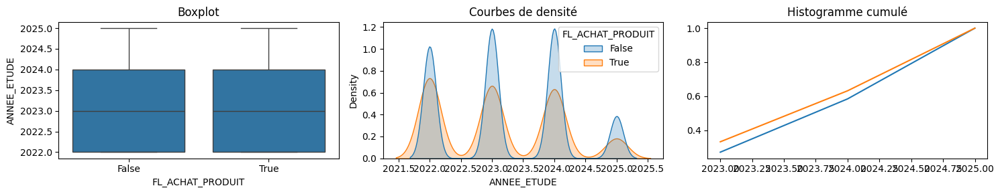


                    count         mean       std     min     25%     50%  \
FL_ACHAT_PRODUIT                                                           
False             64094.0  2023.247605  0.965352  2022.0  2022.0  2023.0   
True               4387.0  2023.118988  0.965890  2022.0  2022.0  2023.0   

                     75%     max  
FL_ACHAT_PRODUIT                  
False             2024.0  2025.0  
True              2024.0  2025.0  

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(2023.24), np.float64(2023.26))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(2023.09), np.float64(2023.15))

Test de Shapiro-Wilk - Stat: 0.8672, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 0.4704, p-value: 0.4928 → Test non significatif à 5%
Test de Mann-Whitney - Stat: 150969482.0000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: -0.0326, p-value: 0.0000 → Test significatif à 5%
Test de Kolmogorov-Smirnov 

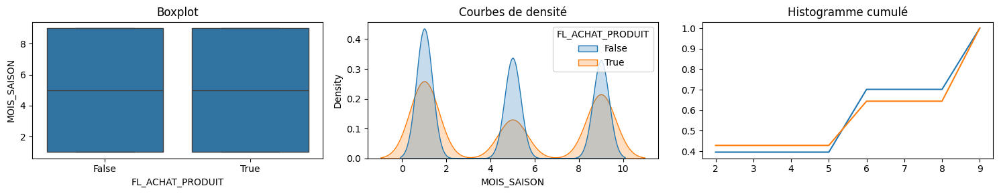


                    count      mean       std  min  25%  50%  75%  max
FL_ACHAT_PRODUIT                                                      
False             64094.0  4.612631  3.309314  1.0  1.0  5.0  9.0  9.0
True               4387.0  4.710964  3.531162  1.0  1.0  5.0  9.0  9.0

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(4.59), np.float64(4.64))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(4.61), np.float64(4.82))

Test de Shapiro-Wilk - Stat: 0.7813, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 160.4780, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 138949278.5000, p-value: 0.1679 → Test non significatif à 5%
Corrélation point bisériale - Stat: 0.0072, p-value: 0.0580 → Test non significatif à 5%
Test de Kolmogorov-Smirnov - Stat: 0.0576, p-value: 0.0000 → Test significatif à 5%

Statistique KS : 0.05755289225765248
     Distributions quasi-identiques
Eta2 : 4.8370087866396994e-08
    Rel

In [ ]:
# columns_quanti = dt.drop('ID_COMPTE', axis=1).select_dtypes(include=['float64', 'int64', 'Int64']).columns
# resultats = {}

# with warnings.catch_warnings():
#     warnings.simplefilter("ignore")
        
#     for column in columns_quanti:
#         df = dt.copy()
#         print('---'*30)
#         print(f"Analyse de la variable '{column}'")
#         print()

#         # Supprimer les lignes avec des NaN dans la colonne
#         df = df.dropna(subset=[column]) # Mais on est pas sensé avoir de NaN
        
#         # Supprimer les valeurs infinies
#         df = df[np.isfinite(df[column])]

#         # Etude bivariée
#         ## Boîtes à moustaches | Courbes de densité | Histogrammes cumulés
#         fig, axes = plt.subplots(1, 3, figsize=(15, 3))
#         sns.boxplot(x='FL_ACHAT_PRODUIT', y=column, data=df, ax=axes[0])
#         axes[0].set_title('Boxplot')
#         sns.kdeplot(data=df, x=column, hue='FL_ACHAT_PRODUIT', fill=True, common_norm=False, ax=axes[1])
#         axes[1].set_title('Courbes de densité')
#         bins = np.histogram_bin_edges(df[column], bins='auto')
#         for label in df['FL_ACHAT_PRODUIT'].unique():
#             subset = df[df['FL_ACHAT_PRODUIT'] == label][column]
#             counts, _ = np.histogram(subset, bins=bins)
#             cum_counts = np.cumsum(counts) / counts.sum()
#             axes[2].plot(bins[1:], cum_counts, label=str(label))
#         axes[2].set_title('Histogramme cumulé')
#         plt.tight_layout() 
#         plt.show()
#         print()

#         ## Descriptif par groupe 'FL_ACHAT_PRODUIT'
#         print(df.groupby('FL_ACHAT_PRODUIT')[column].describe())
#         print()

#         ## Intervalles de confiance autour de la moyenne (test de Student)
#         for group in df['FL_ACHAT_PRODUIT'].unique():
#             group_data = df[df['FL_ACHAT_PRODUIT'] == group][column]
#             conf_int = stats.t.interval(0.95, len(group_data)-1, loc=np.mean(group_data), scale=stats.sem(group_data))
#             print(f"Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = {group}: {(conf_int[0].round(2), conf_int[1].round(2))}")
#         print()
        
#         ## Test de normalité de Shapiro-Wilk
#         shapiro_stat, shapiro_p = stats.shapiro(df[column])
#         if shapiro_p < 0.05:
#             normalite = False
#             significatif_shapiro = "significatif"
#         else:
#             normalite = True
#             significatif_shapiro = "non significatif"
#         print(f'Test de Shapiro-Wilk - Stat: {shapiro_stat:.4f}, p-value: {shapiro_p:.4f} → Test {significatif_shapiro} à 5%')
        
#         if normalite:
#             ## Test de Bartlett
#             bartlett_stat, bartlett_p = stats.bartlett(df[column][df['FL_ACHAT_PRODUIT'] == False],
#                                                         df[column][df['FL_ACHAT_PRODUIT'] == True])
#             if bartlett_p < 0.05:
#                 equal_var = False
#                 significatif_bartlett = "significatif"
#             else:
#                 equal_var = True
#                 significatif_bartlett = "non significatif"
#             print(f'Test de Bartlett - Stat: {bartlett_stat:.4f}, p-value: {bartlett_p:.4f} → Test {significatif_bartlett} à 5%')
#         else:
#             ## Test de Levene
#             levene_stat, levene_p = stats.levene(df[column][df['FL_ACHAT_PRODUIT'] == False],
#                                                 df[column][df['FL_ACHAT_PRODUIT'] == True])
#             if levene_p < 0.05:
#                 equal_var = False
#                 significatif_levene = "significatif"
#             else:
#                 equal_var = True
#                 significatif_levene = "non significatif"
#             print(f'Test de Levene - Stat: {levene_stat:.4f}, p-value: {levene_p:.4f} → Test {significatif_levene} à 5%')
            
#         if normalite and equal_var:
#             ## Test de Student (T-test)
#             t_stat, t_p = stats.ttest_ind(df[column][df['FL_ACHAT_PRODUIT'] == False],
#                                             df[column][df['FL_ACHAT_PRODUIT'] == True])
#             significatif_t = "significatif" if t_p < 0.05 else "non significatif"
#             print(f'Test de Student - Stat: {t_stat:.4f}, p-value: {t_p:.4f} → Test {significatif_t} à 5%')
#         elif normalite and not equal_var:
#             ## Test de Welch
#             welch_stat, welch_p = stats.ttest_ind(df[column][df['FL_ACHAT_PRODUIT'] == False],
#                                                 df[column][df['FL_ACHAT_PRODUIT'] == True],
#                                                 equal_var=False)
#             significatif_welch = "significatif" if welch_p < 0.05 else "non significatif"
#             print(f'Test de Welch - Stat: {welch_stat:.4f}, p-value: {welch_p:.4f} → Test {significatif_welch} à 5%')
#         elif not normalite:
#             ## Test de Mann-Whitney-Wilcoxon (U)
#             mannwhitney_stat, mannwhitney_p = stats.mannwhitneyu(df[column][df['FL_ACHAT_PRODUIT'] == False],
#                                                                 df[column][df['FL_ACHAT_PRODUIT'] == True])
#             significatif_mannwhitney = "significatif" if mannwhitney_p < 0.05 else "non significatif"
#             print(f'Test de Mann-Whitney - Stat: {mannwhitney_stat:.4f}, p-value: {mannwhitney_p:.4f} → Test {significatif_mannwhitney} à 5%')
                
#         ## Corrélation point bisériale
#         corr, p_corr = stats.pointbiserialr(df['FL_ACHAT_PRODUIT'], df[column])
#         if p_corr < 0.05:
#             significatif_corr = "significatif"
#         else:
#             significatif_corr = "non significatif"
#         print(f"Corrélation point bisériale - Stat: {corr:.4f}, p-value: {p_corr:.4f} → Test {significatif_corr} à 5%")
        
#         ## Distance de Kolmogorov-Smirnov
#         ## Test non-paramétrique de Kolmogorov-Smirnov
#         ks_stat, ks_p = stats.ks_2samp(df[column][df['FL_ACHAT_PRODUIT'] == False],
#                                     df[column][df['FL_ACHAT_PRODUIT'] == True])
#         significatif_ks = "significatif" if ks_p < 0.05 else "non significatif"
#         print(f'Test de Kolmogorov-Smirnov - Stat: {ks_stat:.4f}, p-value: {ks_p:.4f} → Test {significatif_ks} à 5%')
#         print()
        
#         ## Distance de Kolmogorov-Smirnov
#         print(f"Statistique KS : {ks_stat}")
#         if ks_stat < 0.1: print("     Distributions quasi-identiques")
#         elif 0.1 <= ks_stat <= 0.3: print("     Distributions modérément différentes")
#         else: print("    Distributions significativement différentes")
        
#         ## Rapport de corrélation
#         eta2 = (ks_stat ** 2) / (ks_stat ** 2 + len(df[column]) - 2)
#         print(f"Eta2 : {eta2}")
#         if eta2 < 0.01: print(f"    Relation négligeable")
#         elif 0.01 <= eta2 < 0.06: print(f"    Relation faible")
#         elif 0.06 <= eta2 < 0.14: print(f"    Relation modérée")
#         else: print(f"    Relation forte")
        
#         # Sauvergarde des résultats
#         resultats[column] = {'stat': eta2}
#         print('\n\n')

------------------------------------------------------------------------------------------
Analyse de la variable 'RECENCE_PARUTION'



c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\seaborn\categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)


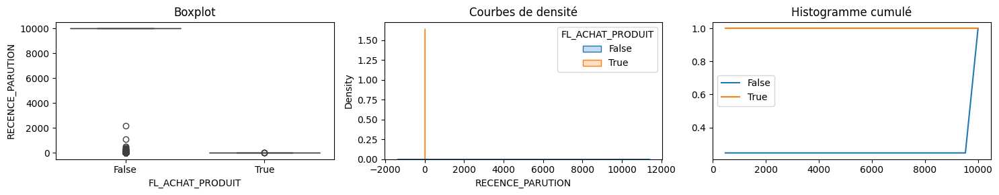

                    count         mean          std  min      25%      50%  \
FL_ACHAT_PRODUIT                                                             
False             64092.0  7536.611948  4308.712384 -1.0  10000.0  10000.0   
True               4384.0    -0.966925     1.120628 -1.0     -1.0     -1.0   

                      75%      max  
FL_ACHAT_PRODUIT                    
False             10000.0  10000.0  
True                 -1.0     49.0  

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(7503.25), np.float64(7569.97))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(-1.0), np.float64(-0.93))

Test de Shapiro-Wilk - Stat: 0.5722, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 1432.9255, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 247530307.5000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: -0.4048, p-value: 0.0000 → Test significatif à 5%
Test de Kolmogorov

c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\scipy\stats\_axis_nan_policy.py:586: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 68476.
  res = hypotest_fun_out(*samples, **kwds)
c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\seaborn\categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)


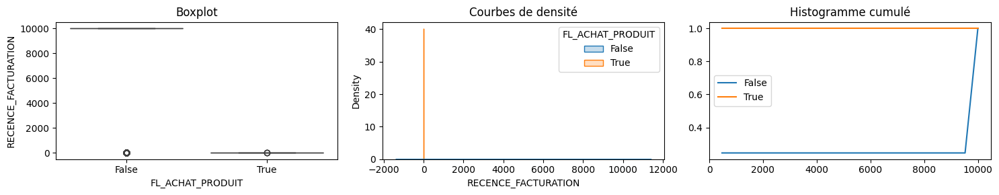

                    count         mean          std  min      25%      50%  \
FL_ACHAT_PRODUIT                                                             
False             64092.0  7536.269222  4309.296504 -1.0  10000.0  10000.0   
True               4384.0    -0.998631     0.052307 -1.0     -1.0     -1.0   

                      75%      max  
FL_ACHAT_PRODUIT                    
False             10000.0  10000.0  
True                 -1.0      1.0  

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(7502.91), np.float64(7569.63))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(-1.0), np.float64(-1.0))

Test de Shapiro-Wilk - Stat: 0.5722, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 1432.9726, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 246736332.5000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: -0.4047, p-value: 0.0000 → Test significatif à 5%
Test de Kolmogorov-

c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\scipy\stats\_axis_nan_policy.py:586: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 68476.
  res = hypotest_fun_out(*samples, **kwds)
c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\seaborn\categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)


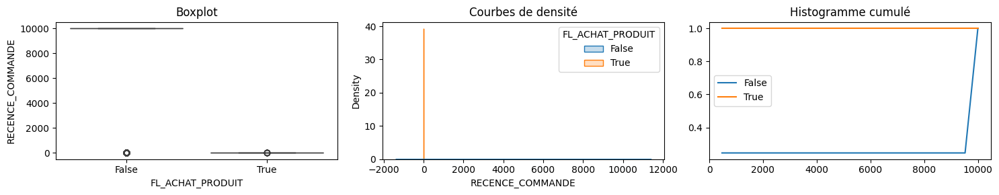

                    count         mean          std  min      25%      50%  \
FL_ACHAT_PRODUIT                                                             
False             64092.0  7536.265961  4309.302207 -1.0  10000.0  10000.0   
True               4384.0    -0.997263     0.052253 -1.0     -1.0     -1.0   

                      75%      max  
FL_ACHAT_PRODUIT                    
False             10000.0  10000.0  
True                 -1.0      0.0  

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(7502.9), np.float64(7569.63))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(-1.0), np.float64(-1.0))

Test de Shapiro-Wilk - Stat: 0.5722, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 1432.9710, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 246597330.0000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: -0.4047, p-value: 0.0000 → Test significatif à 5%
Test de Kolmogorov-S

c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\scipy\stats\_axis_nan_policy.py:586: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 68476.
  res = hypotest_fun_out(*samples, **kwds)
c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\seaborn\categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)


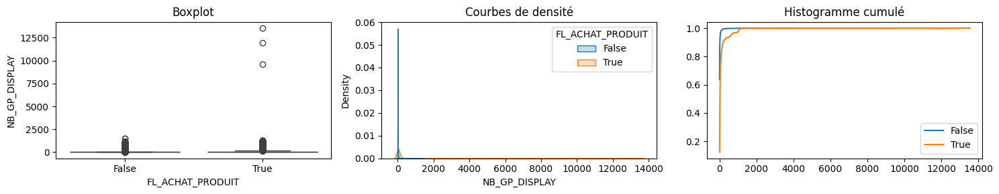

                    count        mean         std  min  25%   50%   75%  \
FL_ACHAT_PRODUIT                                                          
False             64092.0    8.947716   49.244110  0.0  0.0   0.0   4.0   
True               4384.0  100.448221  371.242912  0.0  7.0  22.0  62.0   

                      max  
FL_ACHAT_PRODUIT           
False              1493.0  
True              13542.0  

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(8.57), np.float64(9.33))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(89.46), np.float64(111.44))

Test de Shapiro-Wilk - Stat: 0.0914, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 2628.7072, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 45686347.5000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: 0.2080, p-value: 0.0000 → Test significatif à 5%
Test de Kolmogorov-Smirnov - Stat: 0.5692, p-value: 0.0000 → Test signif

c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\scipy\stats\_axis_nan_policy.py:586: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 68476.
  res = hypotest_fun_out(*samples, **kwds)
c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\seaborn\categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)


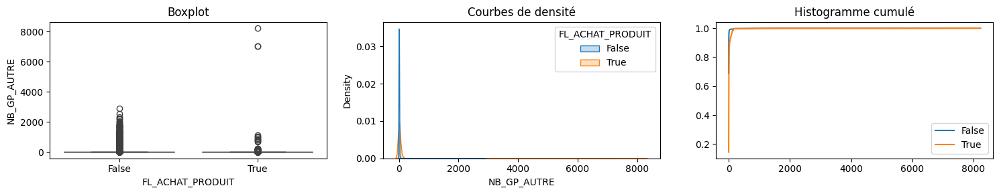

                    count       mean         std  min  25%  50%   75%     max
FL_ACHAT_PRODUIT                                                             
False             64092.0   5.141297   63.238191  0.0  0.0  0.0   1.0  2890.0
True               4384.0  20.158759  199.809906  0.0  2.0  4.0  11.0  8225.0

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(4.65), np.float64(5.63))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(14.24), np.float64(26.08))

Test de Shapiro-Wilk - Stat: 0.0419, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 116.9993, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 48796388.0000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: 0.0463, p-value: 0.0000 → Test significatif à 5%
Test de Kolmogorov-Smirnov - Stat: 0.5556, p-value: 0.0000 → Test significatif à 5%
Statistique KS : 0.5556202768055591
    Distributions significativement différentes
Eta2 : 

c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\scipy\stats\_axis_nan_policy.py:586: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 68476.
  res = hypotest_fun_out(*samples, **kwds)
c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\seaborn\categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)


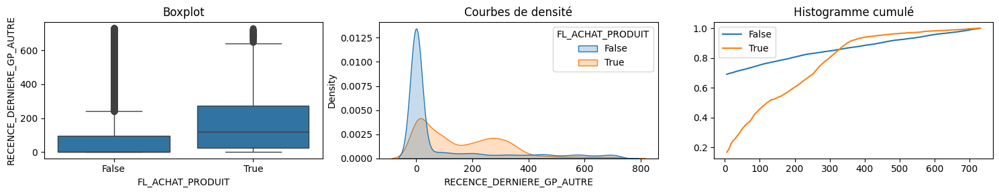

                    count        mean         std  min   25%    50%    75%  \
FL_ACHAT_PRODUIT                                                             
False             64092.0   99.322880  190.489787  0.0   0.0    0.0   97.0   
True               4384.0  165.235173  154.407623  0.0  26.0  121.0  274.0   

                    max  
FL_ACHAT_PRODUIT         
False             730.0  
True              729.0  

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(97.85), np.float64(100.8))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(160.66), np.float64(169.81))

Test de Shapiro-Wilk - Stat: 0.6154, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 90.6548, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 76569817.5000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: 0.0853, p-value: 0.0000 → Test significatif à 5%
Test de Kolmogorov-Smirnov - Stat: 0.5427, p-value: 0.0000 → Test s

c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\scipy\stats\_axis_nan_policy.py:586: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 68476.
  res = hypotest_fun_out(*samples, **kwds)
c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\seaborn\categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)


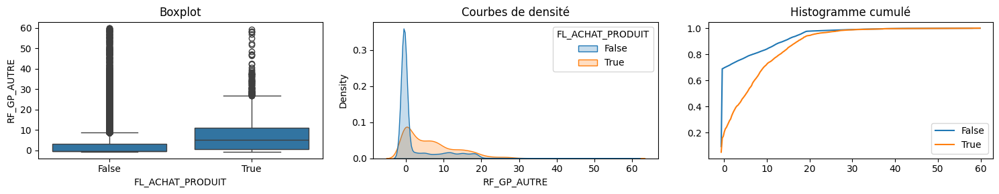

                    count      mean       std       min       25%       50%  \
FL_ACHAT_PRODUIT                                                              
False             64092.0  3.025981  7.010781 -0.916667 -0.459459 -0.459459   
True               4384.0  6.962200  7.674954 -0.916667  0.648649  5.189189   

                        75%        max  
FL_ACHAT_PRODUIT                        
False              3.222222  59.833333  
True              11.108859  59.083333  

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(2.97), np.float64(3.08))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(6.73), np.float64(7.19))

Test de Shapiro-Wilk - Stat: 0.6119, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 432.2386, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 76601090.5000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: 0.1353, p-value: 0.0000 → Test significatif à 5%
Test de 

c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\scipy\stats\_axis_nan_policy.py:586: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 68476.
  res = hypotest_fun_out(*samples, **kwds)
c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\seaborn\categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)


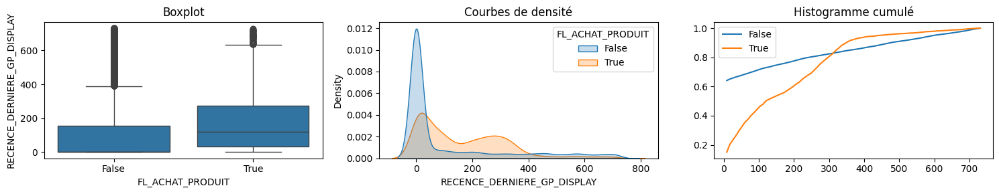

                    count        mean         std  min    25%    50%    75%  \
FL_ACHAT_PRODUIT                                                              
False             64092.0  114.780753  200.494008  0.0   0.00    0.0  156.0   
True               4384.0  165.680885  154.936081  0.0  31.75  119.0  273.0   

                    max  
FL_ACHAT_PRODUIT         
False             731.0  
True              729.0  

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(113.23), np.float64(116.33))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(161.09), np.float64(170.27))

Test de Shapiro-Wilk - Stat: 0.6556, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 14.5954, p-value: 0.0001 → Test significatif à 5%
Test de Mann-Whitney - Stat: 83325619.5000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: 0.0628, p-value: 0.0000 → Test significatif à 5%
Test de Kolmogorov-Smirnov - Stat: 0.5128, p-value: 0.0000 → 

c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\scipy\stats\_axis_nan_policy.py:586: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 68476.
  res = hypotest_fun_out(*samples, **kwds)
c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\seaborn\categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)


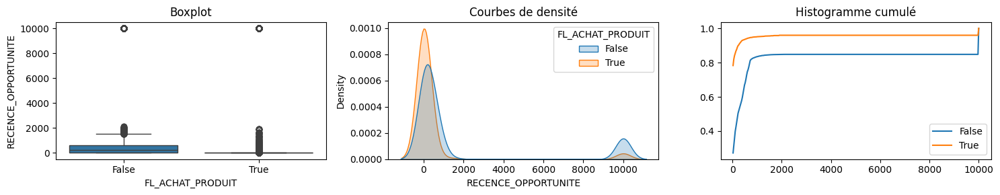

                    count         mean          std  min   25%    50%    75%  \
FL_ACHAT_PRODUIT                                                               
False             64092.0  1733.294421  3511.216439 -1.0  12.0  225.0  615.0   
True               4384.0   453.305201  1971.852562 -1.0  -1.0   -1.0   10.0   

                      max  
FL_ACHAT_PRODUIT           
False             10000.0  
True              10000.0  

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(1706.11), np.float64(1760.48))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(394.92), np.float64(511.69))

Test de Shapiro-Wilk - Stat: 0.4787, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 547.0449, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 219263696.0000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: -0.0909, p-value: 0.0000 → Test significatif à 5%
Test de Kolmogorov-Smirnov - Stat: 0.5108, p

c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\scipy\stats\_axis_nan_policy.py:586: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 68476.
  res = hypotest_fun_out(*samples, **kwds)
c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\seaborn\categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)


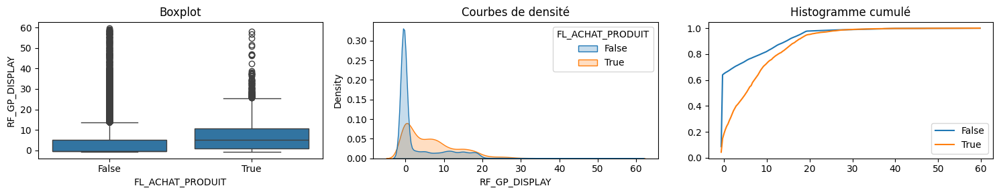

                    count      mean       std       min       25%       50%  \
FL_ACHAT_PRODUIT                                                              
False             64092.0  3.436914  7.084470 -0.916667 -0.459459 -0.459459   
True               4384.0  6.848116  7.336988 -0.916667  0.783784  5.189189   

                        75%        max  
FL_ACHAT_PRODUIT                        
False              5.243243  59.750000  
True              10.724099  58.166667  

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(3.38), np.float64(3.49))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(6.63), np.float64(7.07))

Test de Shapiro-Wilk - Stat: 0.6560, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 232.0230, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 80949279.0000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: 0.1168, p-value: 0.0000 → Test significatif à 5%
Test de 

c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\scipy\stats\_axis_nan_policy.py:586: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 68476.
  res = hypotest_fun_out(*samples, **kwds)
c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\seaborn\categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)


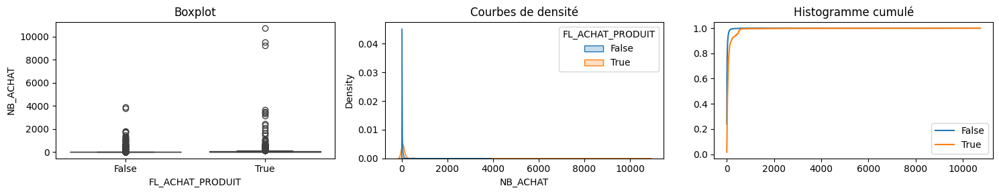

                    count       mean         std  min   25%   50%   75%  \
FL_ACHAT_PRODUIT                                                          
False             64092.0  16.643076   48.468479  1.0   2.0   5.0  15.0   
True               4384.0  90.319571  314.456739  1.0  15.0  35.0  76.0   

                      max  
FL_ACHAT_PRODUIT           
False              3915.0  
True              10745.0  

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(16.27), np.float64(17.02))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(81.01), np.float64(99.63))

Test de Shapiro-Wilk - Stat: 0.1361, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 1784.5270, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 50676772.0000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: 0.1917, p-value: 0.0000 → Test significatif à 5%
Test de Kolmogorov-Smirnov - Stat: 0.5011, p-value: 0.0000 → Test signi

c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\scipy\stats\_axis_nan_policy.py:586: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 68476.
  res = hypotest_fun_out(*samples, **kwds)
c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\seaborn\categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)


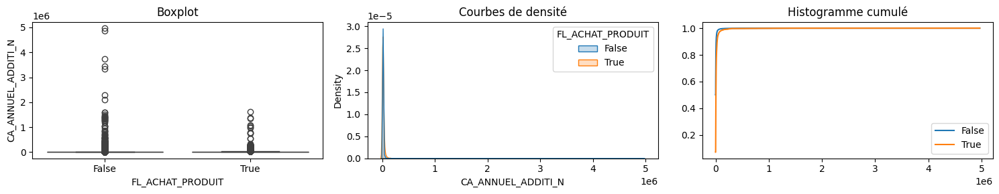

                    count          mean           std  min      25%     50%  \
FL_ACHAT_PRODUIT                                                              
False             64092.0   5568.017365  48746.826431  0.0     0.00     0.0   
True               4384.0  16161.480080  59852.041663  0.0  2938.37  6182.2   

                        75%         max  
FL_ACHAT_PRODUIT                         
False              4063.400  4967271.14  
True              13317.685  1621954.74  

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(5190.62), np.float64(5945.42))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(14389.28), np.float64(17933.68))

Test de Shapiro-Wilk - Stat: 0.0625, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 97.9557, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 63252259.5000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: 0.0523, p-value: 0.0000 → Test significa

c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\scipy\stats\_axis_nan_policy.py:586: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 68476.
  res = hypotest_fun_out(*samples, **kwds)
c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\seaborn\categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)


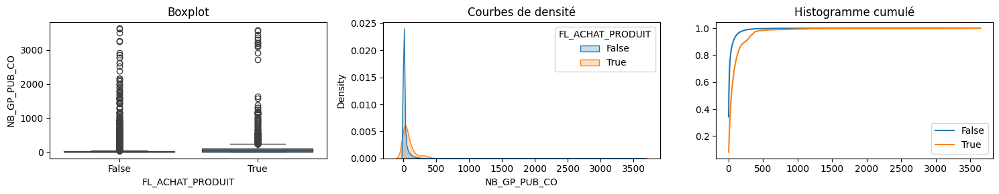

                    count       mean         std  min   25%   50%    75%  \
FL_ACHAT_PRODUIT                                                           
False             64092.0  25.180725   82.857047  0.0   0.0   4.0   19.0   
True               4384.0  93.724681  212.376029  0.0  12.0  39.0  103.0   

                     max  
FL_ACHAT_PRODUIT          
False             3647.0  
True              3589.0  

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(24.54), np.float64(25.82))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(87.44), np.float64(100.01))

Test de Shapiro-Wilk - Stat: 0.2611, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 1386.5539, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 65082415.0000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: 0.1713, p-value: 0.0000 → Test significatif à 5%
Test de Kolmogorov-Smirnov - Stat: 0.4278, p-value: 0.0000 → Test sign

c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\scipy\stats\_axis_nan_policy.py:586: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 68476.
  res = hypotest_fun_out(*samples, **kwds)
c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\seaborn\categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)


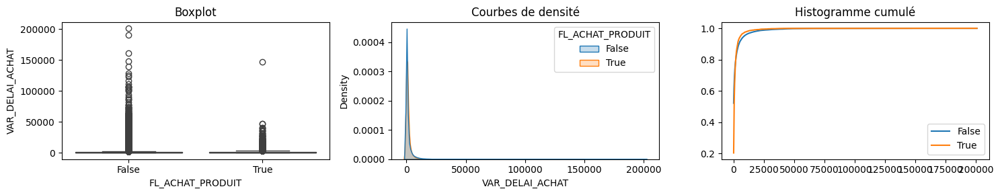

                    count         mean          std  min         25%  \
FL_ACHAT_PRODUIT                                                       
False             64092.0  1795.660319  5623.069551 -1.0    0.000000   
True               4384.0  1471.778801  4005.363373 -1.0  117.699042   

                         50%          75%            max  
FL_ACHAT_PRODUIT                                          
False              22.153846  1171.219663  200978.000000  
True              465.355517  1353.779313  147408.333333  

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(1752.13), np.float64(1839.19))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(1353.18), np.float64(1590.38))

Test de Shapiro-Wilk - Stat: 0.3288, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 30.3966, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 98523816.0000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: -0

c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\scipy\stats\_axis_nan_policy.py:586: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 68476.
  res = hypotest_fun_out(*samples, **kwds)
c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\seaborn\categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)


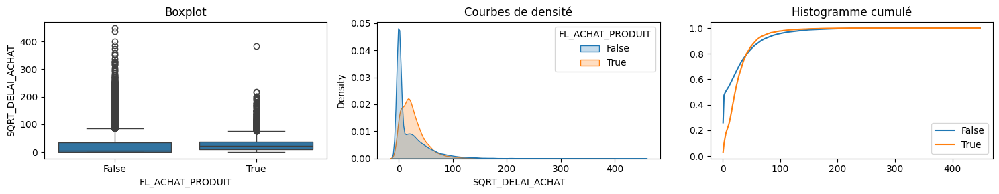

                    count       mean        std  min        25%        50%  \
FL_ACHAT_PRODUIT                                                             
False             64092.0  22.892547  35.669078 -1.0   0.333333   4.706787   
True               4384.0  27.698641  26.548282 -1.0  10.848919  21.572099   

                        75%         max  
FL_ACHAT_PRODUIT                         
False             34.223087  448.305699  
True              36.793740  383.937929  

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(22.62), np.float64(23.17))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(26.91), np.float64(28.48))

Test de Shapiro-Wilk - Stat: 0.7073, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 105.9992, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 99081103.5000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: 0.0334, p-value: 0.0000 → Test significatif à 5%
Test

c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\scipy\stats\_axis_nan_policy.py:586: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 68476.
  res = hypotest_fun_out(*samples, **kwds)
c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\seaborn\categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)


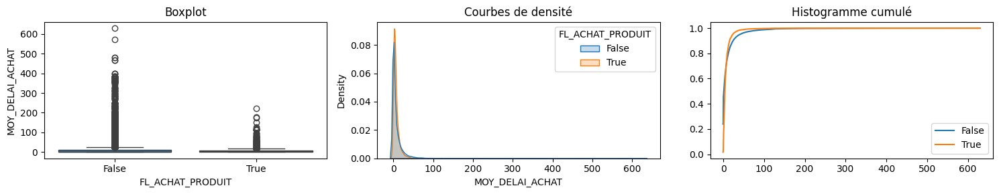

                    count      mean        std  min       25%       50%  \
FL_ACHAT_PRODUIT                                                          
False             64092.0  8.897503  22.725945 -1.0  0.000000  1.305556   
True               4384.0  6.974953  11.417131 -1.0  1.685393  3.937500   

                       75%         max  
FL_ACHAT_PRODUIT                        
False             9.166667  630.000000  
True              8.131548  221.666667  

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(8.72), np.float64(9.07))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(6.64), np.float64(7.31))

Test de Shapiro-Wilk - Stat: 0.4262, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 138.3525, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 106788402.5000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: -0.0212, p-value: 0.0000 → Test significatif à 5%
Test de Kolmogorov-Smi

c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\scipy\stats\_axis_nan_policy.py:586: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 68476.
  res = hypotest_fun_out(*samples, **kwds)
c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\seaborn\categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)


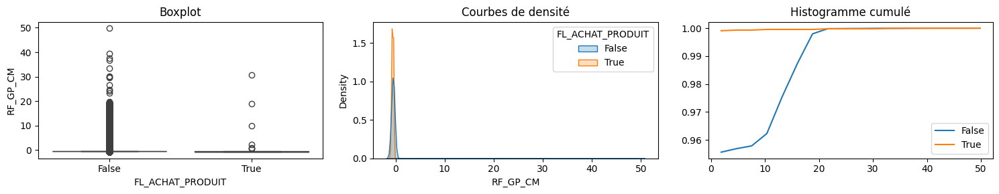

                    count      mean       std       min       25%       50%  \
FL_ACHAT_PRODUIT                                                              
False             64092.0  0.110070  3.036402 -0.916667 -0.459459 -0.459459   
True               4384.0 -0.617765  0.605556 -0.916667 -0.722222 -0.722222   

                       75%        max  
FL_ACHAT_PRODUIT                       
False            -0.459459  49.833333  
True             -0.459459  30.722222  

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(0.09), np.float64(0.13))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(-0.64), np.float64(-0.6))

Test de Shapiro-Wilk - Stat: 0.2288, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 140.1615, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 195294275.0000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: -0.0605, p-value: 0.0000 → Test significatif à 5%
Test de K

c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\scipy\stats\_axis_nan_policy.py:586: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 68476.
  res = hypotest_fun_out(*samples, **kwds)
c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\seaborn\categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)


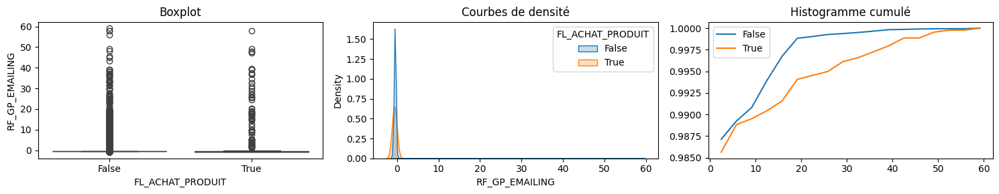

                    count      mean       std       min       25%       50%  \
FL_ACHAT_PRODUIT                                                              
False             64092.0 -0.342480  1.767987 -0.916667 -0.459459 -0.459459   
True               4384.0 -0.323163  3.041490 -0.916667 -0.722222 -0.722222   

                       75%        max  
FL_ACHAT_PRODUIT                       
False            -0.459459  59.166667  
True             -0.459459  57.916667  

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(-0.36), np.float64(-0.33))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(-0.41), np.float64(-0.23))

Test de Shapiro-Wilk - Stat: 0.1040, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 51.0165, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 190348849.5000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: 0.0025, p-value: 0.5094 → Test non significatif à 5%
Test

c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\scipy\stats\_axis_nan_policy.py:586: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 68476.
  res = hypotest_fun_out(*samples, **kwds)
c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\seaborn\categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)


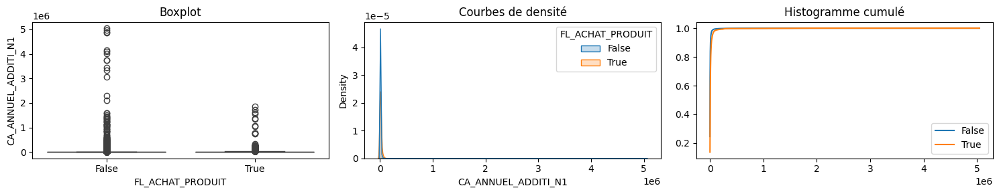

                    count          mean           std  min        25%  \
FL_ACHAT_PRODUIT                                                        
False             64092.0   6072.004640  66490.285021  0.0   190.0000   
True               4384.0  14862.194427  71209.431950  0.0  1518.7325   

                      50%        75%         max  
FL_ACHAT_PRODUIT                                  
False              989.00   3598.895  5045274.39  
True              4459.13  11646.145  1857839.29  

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(5557.24), np.float64(6586.77))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(12753.71), np.float64(16970.68))

Test de Shapiro-Wilk - Stat: 0.0446, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 50.7876, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 85689600.5000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: 0.0322, p-value: 0.0000 → Te

c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\scipy\stats\_axis_nan_policy.py:586: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 68476.
  res = hypotest_fun_out(*samples, **kwds)
c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\seaborn\categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)


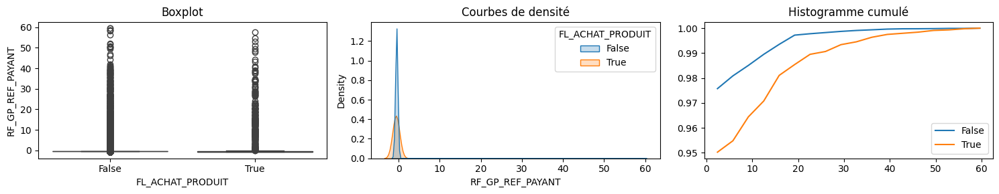

                    count      mean       std       min       25%       50%  \
FL_ACHAT_PRODUIT                                                              
False             64092.0 -0.189478  2.435981 -0.916667 -0.459459 -0.459459   
True               4384.0  0.250209  4.528656 -0.916667 -0.722222 -0.722222   

                       75%        max  
FL_ACHAT_PRODUIT                       
False            -0.459459  59.583333  
True             -0.459459  57.500000  

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(-0.21), np.float64(-0.17))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(0.12), np.float64(0.38))

Test de Shapiro-Wilk - Stat: 0.1483, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 240.8342, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 183075331.0000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: 0.0410, p-value: 0.0000 → Test significatif à 5%
Test de K

c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\scipy\stats\_axis_nan_policy.py:586: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 68476.
  res = hypotest_fun_out(*samples, **kwds)
c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\seaborn\categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)


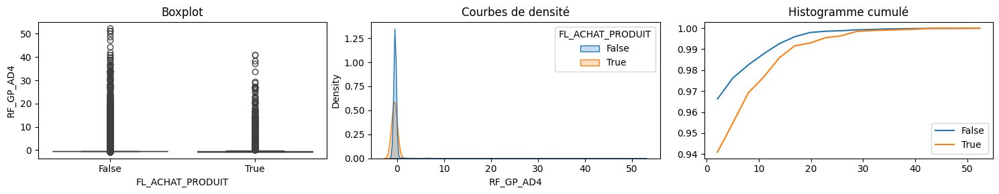

                    count      mean       std       min       25%       50%  \
FL_ACHAT_PRODUIT                                                              
False             64092.0 -0.147530  2.272803 -0.916667 -0.459459 -0.459459   
True               4384.0  0.057503  3.221214 -0.916667 -0.722222 -0.722222   

                       75%        max  
FL_ACHAT_PRODUIT                       
False            -0.459459  52.416667  
True             -0.459459  41.000000  

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(-0.17), np.float64(-0.13))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(-0.04), np.float64(0.15))

Test de Shapiro-Wilk - Stat: 0.1884, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 122.9932, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 181812010.5000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: 0.0214, p-value: 0.0000 → Test significatif à 5%
Test de 

c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\scipy\stats\_axis_nan_policy.py:586: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 68476.
  res = hypotest_fun_out(*samples, **kwds)
c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\seaborn\categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)


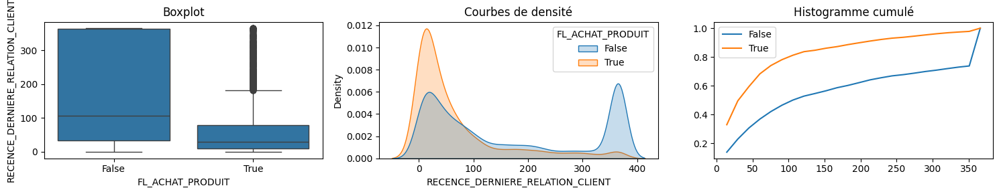

                    count        mean         std  min   25%    50%    75%  \
FL_ACHAT_PRODUIT                                                             
False             64092.0  164.124867  142.775499 -1.0  33.0  106.0  365.0   
True               4384.0   65.610173   86.791979 -1.0  10.0   30.0   79.0   

                    max  
FL_ACHAT_PRODUIT         
False             366.0  
True              366.0  

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(163.02), np.float64(165.23))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(63.04), np.float64(68.18))

Test de Shapiro-Wilk - Stat: 0.8182, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 2564.3697, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 201232984.5000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: -0.1699, p-value: 0.0000 → Test significatif à 5%
Test de Kolmogorov-Smirnov - Stat: 0.3217, p-value: 0.0000 → Te

c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\scipy\stats\_axis_nan_policy.py:586: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 68476.
  res = hypotest_fun_out(*samples, **kwds)
c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\seaborn\categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)


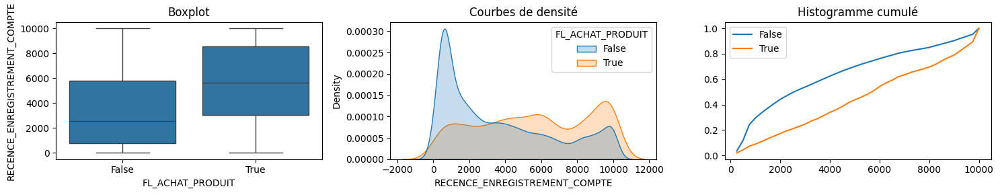

                    count         mean          std   min     25%     50%  \
FL_ACHAT_PRODUIT                                                            
False             64092.0  3591.021266  3111.411579   2.0   786.0  2549.0   
True               4384.0  5587.938412  3098.851888  16.0  3034.0  5663.0   

                      75%      max  
FL_ACHAT_PRODUIT                    
False             5794.25  10000.0  
True              8535.25  10000.0  

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(3566.93), np.float64(3615.11))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(5496.18), np.float64(5679.69))

Test de Shapiro-Wilk - Stat: 0.8810, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 10.8102, p-value: 0.0010 → Test significatif à 5%
Test de Mann-Whitney - Stat: 89513294.5000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: 0.1552, p-value: 0.0000 → Test significatif à 5%
Test de Kolmogorov-Sm

c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\scipy\stats\_axis_nan_policy.py:586: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 68476.
  res = hypotest_fun_out(*samples, **kwds)
c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\seaborn\categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)


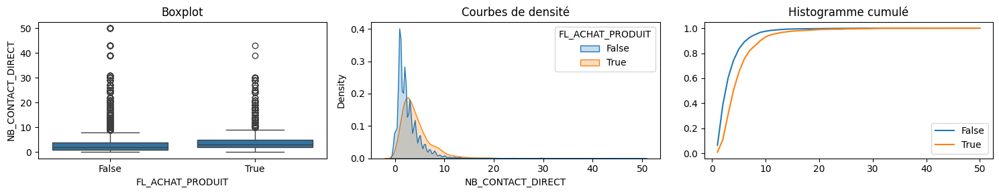

                    count      mean       std  min  25%  50%  75%   max
FL_ACHAT_PRODUIT                                                       
False             64092.0  2.762513  2.801456  0.0  1.0  2.0  4.0  50.0
True               4384.0  4.481068  3.788994  0.0  2.0  3.0  5.0  43.0

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(2.74), np.float64(2.78))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(4.37), np.float64(4.59))

Test de Shapiro-Wilk - Stat: 0.6932, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 314.2804, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 86664867.0000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: 0.1448, p-value: 0.0000 → Test significatif à 5%
Test de Kolmogorov-Smirnov - Stat: 0.2915, p-value: 0.0000 → Test significatif à 5%
Statistique KS : 0.29151115344684714
     Distributions modérément différentes
Eta2 : 1.2410352414388604e-06
    Rela

c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\scipy\stats\_axis_nan_policy.py:586: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 68476.
  res = hypotest_fun_out(*samples, **kwds)
c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\seaborn\categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)


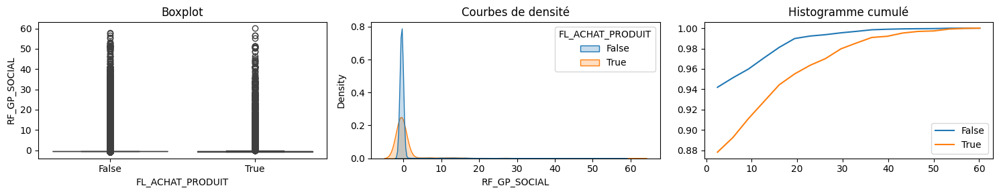

                    count      mean       std       min       25%       50%  \
FL_ACHAT_PRODUIT                                                              
False             64092.0  0.354745  4.063541 -0.916667 -0.459459 -0.459459   
True               4384.0  1.673193  7.329303 -0.916667 -0.722222 -0.459459   

                       75%        max  
FL_ACHAT_PRODUIT                       
False            -0.459459  57.750000  
True             -0.459459  60.166667  

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(0.32), np.float64(0.39))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(1.46), np.float64(1.89))

Test de Shapiro-Wilk - Stat: 0.2514, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 488.6803, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 168691932.5000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: 0.0740, p-value: 0.0000 → Test significatif à 5%
Test de Kol

c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\scipy\stats\_axis_nan_policy.py:586: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 68476.
  res = hypotest_fun_out(*samples, **kwds)
c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\seaborn\categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)


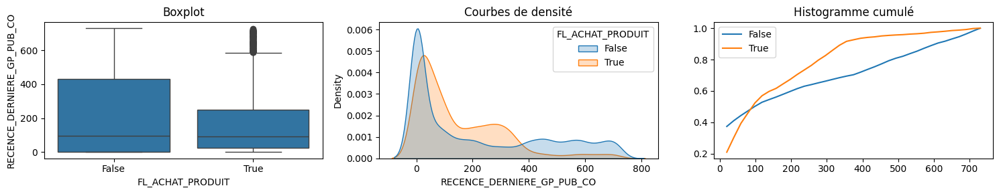

                    count        mean         std  min   25%   50%    75%  \
FL_ACHAT_PRODUIT                                                            
False             64092.0  214.241575  241.426427  0.0   0.0  97.0  430.0   
True               4384.0  150.210766  155.672765  0.0  27.0  91.0  251.0   

                    max  
FL_ACHAT_PRODUIT         
False             730.0  
True              726.0  

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(212.37), np.float64(216.11))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(145.6), np.float64(154.82))

Test de Shapiro-Wilk - Stat: 0.8183, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 879.4667, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 139234585.0000, p-value: 0.3138 → Test non significatif à 5%
Corrélation point bisériale - Stat: -0.0660, p-value: 0.0000 → Test significatif à 5%
Test de Kolmogorov-Smirnov - Stat: 0.2523, p-value: 0.0000 → Te

c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\scipy\stats\_axis_nan_policy.py:586: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 68476.
  res = hypotest_fun_out(*samples, **kwds)
c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\seaborn\categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)


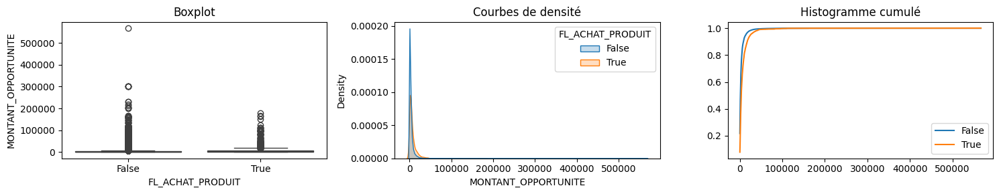

                    count         mean           std  min      25%       50%  \
FL_ACHAT_PRODUIT                                                               
False             64092.0  3540.590391   8536.481680  0.0   285.00  1413.000   
True               4384.0  7127.030646  11759.431882  0.0  1285.01  3329.685   

                        75%        max  
FL_ACHAT_PRODUIT                        
False             3612.9700  567037.00  
True              8411.7425  179381.02  

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(3474.5), np.float64(3606.68))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(6778.84), np.float64(7475.22))

Test de Shapiro-Wilk - Stat: 0.3672, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 395.0494, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 92932001.0000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: 0.0995, p-value: 0.0000 → Test significati

c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\scipy\stats\_axis_nan_policy.py:586: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 68476.
  res = hypotest_fun_out(*samples, **kwds)
c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\seaborn\categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)


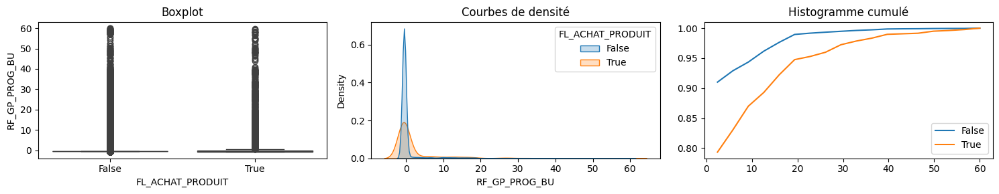

                    count      mean       std       min       25%       50%  \
FL_ACHAT_PRODUIT                                                              
False             64092.0  0.722994  4.619220 -0.916667 -0.459459 -0.459459   
True               4384.0  2.844690  8.664281 -0.916667 -0.722222 -0.459459   

                       75%        max  
FL_ACHAT_PRODUIT                       
False            -0.459459  60.000000  
True             -0.222222  59.583333  

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(0.69), np.float64(0.76))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(2.59), np.float64(3.1))

Test de Shapiro-Wilk - Stat: 0.3230, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 861.6599, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 153352709.0000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: 0.1038, p-value: 0.0000 → Test significatif à 5%
Test de Kolm

c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\scipy\stats\_axis_nan_policy.py:586: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 68476.
  res = hypotest_fun_out(*samples, **kwds)
c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\seaborn\categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)


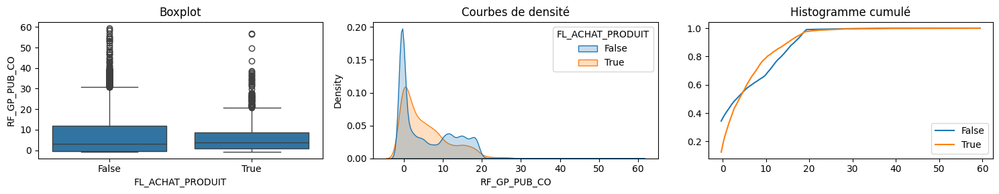

                    count      mean       std       min       25%       50%  \
FL_ACHAT_PRODUIT                                                              
False             64092.0  6.013271  7.062795 -0.916667 -0.459459  3.166667   
True               4384.0  5.665138  6.306140 -0.916667  0.722222  3.833333   

                       75%        max  
FL_ACHAT_PRODUIT                       
False             12.00000  59.416667  
True               8.72973  57.000000  

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(5.96), np.float64(6.07))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(5.48), np.float64(5.85))

Test de Shapiro-Wilk - Stat: 0.8436, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 273.8769, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 132592070.5000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: -0.0121, p-value: 0.0015 → Test significatif à 5%
Test de Ko

c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\scipy\stats\_axis_nan_policy.py:586: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 68476.
  res = hypotest_fun_out(*samples, **kwds)
c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\seaborn\categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)


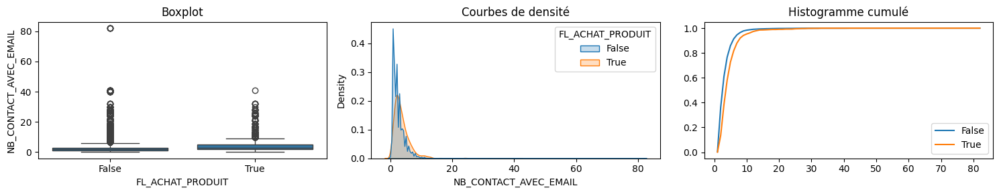

                    count      mean       std  min  25%  50%  75%   max
FL_ACHAT_PRODUIT                                                       
False             64092.0  2.693706  2.520411  0.0  1.0  2.0  3.0  82.0
True               4384.0  3.886405  3.320558  0.0  2.0  3.0  5.0  41.0

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(2.67), np.float64(2.71))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(3.79), np.float64(3.98))

Test de Shapiro-Wilk - Stat: 0.6220, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 205.0224, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 96965924.0000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: 0.1125, p-value: 0.0000 → Test significatif à 5%
Test de Kolmogorov-Smirnov - Stat: 0.2263, p-value: 0.0000 → Test significatif à 5%
Statistique KS : 0.22634873694338115
     Distributions modérément différentes
Eta2 : 7.482214034768686e-07
    Relat

c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\scipy\stats\_axis_nan_policy.py:586: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 68476.
  res = hypotest_fun_out(*samples, **kwds)
c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\seaborn\categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)


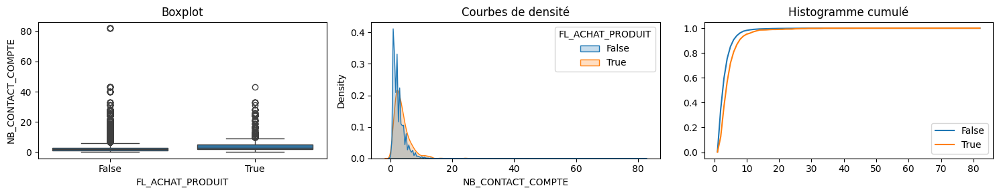

                    count      mean       std  min  25%  50%  75%   max
FL_ACHAT_PRODUIT                                                       
False             64092.0  2.767007  2.573710  0.0  1.0  2.0  3.0  82.0
True               4384.0  3.980383  3.372877  0.0  2.0  3.0  5.0  43.0

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(2.75), np.float64(2.79))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(3.88), np.float64(4.08))

Test de Shapiro-Wilk - Stat: 0.6296, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 193.6681, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 97074199.5000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: 0.1121, p-value: 0.0000 → Test significatif à 5%
Test de Kolmogorov-Smirnov - Stat: 0.2263, p-value: 0.0000 → Test significatif à 5%
Statistique KS : 0.22626982722373085
     Distributions modérément différentes
Eta2 : 7.476998047594189e-07
    Relat

c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\scipy\stats\_axis_nan_policy.py:586: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 68476.
  res = hypotest_fun_out(*samples, **kwds)
c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\seaborn\categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)


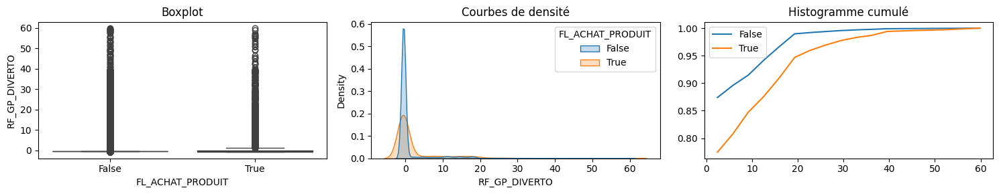

                    count      mean       std       min       25%       50%  \
FL_ACHAT_PRODUIT                                                              
False             64092.0  1.186721  5.101431 -0.916667 -0.459459 -0.459459   
True               4384.0  3.082279  8.359671 -0.916667 -0.722222 -0.459459   

                       75%        max  
FL_ACHAT_PRODUIT                       
False            -0.459459  59.750000  
True              0.000000  59.833333  

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(1.15), np.float64(1.23))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(2.83), np.float64(3.33))

Test de Shapiro-Wilk - Stat: 0.4062, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 596.2048, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 154129271.0000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: 0.0861, p-value: 0.0000 → Test significatif à 5%
Test de Kol

c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\scipy\stats\_axis_nan_policy.py:586: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 68476.
  res = hypotest_fun_out(*samples, **kwds)
c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\seaborn\categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)


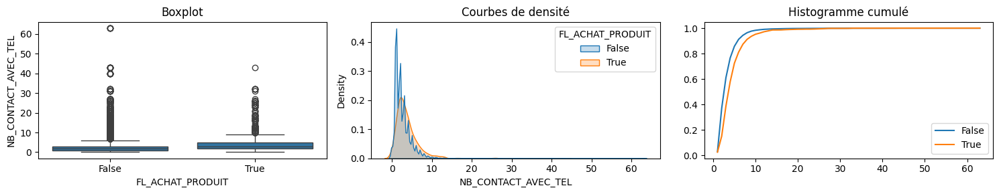

                    count      mean       std  min  25%  50%  75%   max
FL_ACHAT_PRODUIT                                                       
False             64092.0  2.658756  2.503707  0.0  1.0  2.0  3.0  63.0
True               4384.0  3.864735  3.354579  0.0  2.0  3.0  5.0  43.0

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(2.64), np.float64(2.68))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(3.77), np.float64(3.96))

Test de Shapiro-Wilk - Stat: 0.6647, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 245.7315, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 98612869.5000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: 0.1143, p-value: 0.0000 → Test significatif à 5%
Test de Kolmogorov-Smirnov - Stat: 0.2233, p-value: 0.0000 → Test significatif à 5%
Statistique KS : 0.22329725267191186
     Distributions modérément différentes
Eta2 : 7.281833505037064e-07
    Relat

c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\scipy\stats\_axis_nan_policy.py:586: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 68476.
  res = hypotest_fun_out(*samples, **kwds)
c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\seaborn\categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)


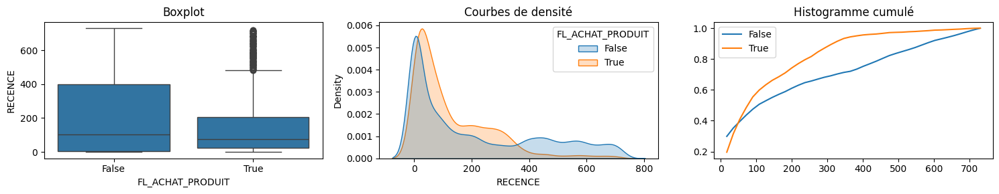

                    count        mean        std  min   25%    50%    75%  \
FL_ACHAT_PRODUIT                                                            
False             64092.0  207.137100  226.36460 -1.0   4.0  104.0  398.0   
True               4384.0  129.275319  137.52875 -1.0  25.0   76.0  207.0   

                    max  
FL_ACHAT_PRODUIT         
False             730.0  
True              720.0  

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(205.38), np.float64(208.89))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(125.2), np.float64(133.35))

Test de Shapiro-Wilk - Stat: 0.8340, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 1060.3130, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 148733144.5000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: -0.0856, p-value: 0.0000 → Test significatif à 5%
Test de Kolmogorov-Smirnov - Stat: 0.2231, p-value: 0.0000 → Test 

c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\scipy\stats\_axis_nan_policy.py:586: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 68476.
  res = hypotest_fun_out(*samples, **kwds)
c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\seaborn\categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)


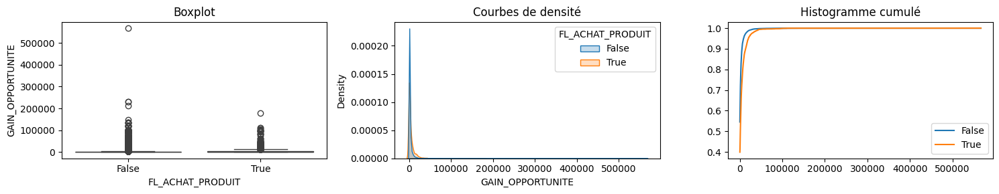

                    count         mean          std  min  25%      50%  \
FL_ACHAT_PRODUIT                                                         
False             64092.0  1875.243593  5976.327405  0.0  0.0     0.00   
True               4384.0  4620.615812  9504.678539  0.0  0.0  1171.21   

                      75%        max  
FL_ACHAT_PRODUIT                      
False             1747.75  567037.00  
True              5178.84  179381.02  

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(1828.97), np.float64(1921.51))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(4339.19), np.float64(4902.05))

Test de Shapiro-Wilk - Stat: 0.3102, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 719.5393, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 107845106.0000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: 0.1067, p-value: 0.0000 → Test significatif à 5%
Test de Kolmogorov-Smir

c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\scipy\stats\_axis_nan_policy.py:586: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 68476.
  res = hypotest_fun_out(*samples, **kwds)
c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\seaborn\categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)


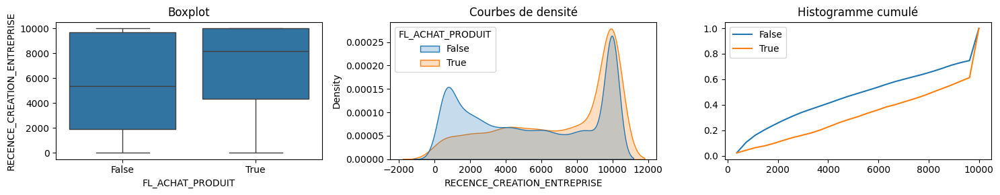

                    count         mean          std  min      25%     50%  \
FL_ACHAT_PRODUIT                                                            
False             64092.0  5482.530737  3590.789003 -1.0  1931.00  5355.0   
True               4384.0  7005.589416  3219.375236 -1.0  4319.75  8165.5   

                      75%      max  
FL_ACHAT_PRODUIT                    
False              9698.0  10000.0  
True              10000.0  10000.0  

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(5454.73), np.float64(5510.33))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(6910.26), np.float64(7100.91))

Test de Shapiro-Wilk - Stat: 0.8748, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 439.2767, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 106486418.5000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: 0.1039, p-value: 0.0000 → Test significatif à 5%
Test de Kolmogorov-

c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\scipy\stats\_axis_nan_policy.py:586: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 68476.
  res = hypotest_fun_out(*samples, **kwds)
c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\seaborn\categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)


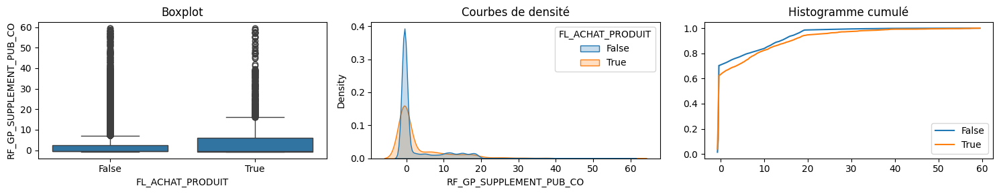

                    count      mean       std       min       25%       50%  \
FL_ACHAT_PRODUIT                                                              
False             64092.0  2.812555  6.549576 -0.916667 -0.459459 -0.459459   
True               4384.0  4.083121  8.851503 -0.916667 -0.722222 -0.459459   

                       75%        max  
FL_ACHAT_PRODUIT                       
False             2.611111  59.500000  
True              6.089527  59.416667  

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(2.76), np.float64(2.86))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(3.82), np.float64(4.35))

Test de Shapiro-Wilk - Stat: 0.5889, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 174.8335, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 149132590.5000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: 0.0462, p-value: 0.0000 → Test significatif à 5%
Test de Kol

c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\scipy\stats\_axis_nan_policy.py:586: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 68476.
  res = hypotest_fun_out(*samples, **kwds)
c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\seaborn\categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)


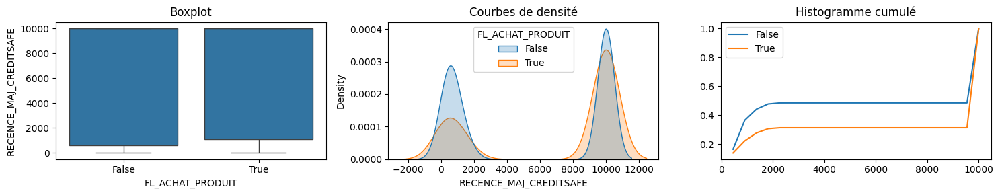

                    count         mean          std  min     25%      50%  \
FL_ACHAT_PRODUIT                                                            
False             64092.0  5469.040567  4677.993798 -1.0   607.0  10000.0   
True               4384.0  7068.285812  4359.033254 -1.0  1097.5  10000.0   

                      75%      max  
FL_ACHAT_PRODUIT                    
False             10000.0  10000.0  
True              10000.0  10000.0  

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(5432.82), np.float64(5505.26))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(6939.22), np.float64(7197.36))

Test de Shapiro-Wilk - Stat: 0.6719, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 483.6420, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 117971381.5000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: 0.0837, p-value: 0.0000 → Test significatif à 5%
Test de Kolmogorov-

c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\scipy\stats\_axis_nan_policy.py:586: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 68476.
  res = hypotest_fun_out(*samples, **kwds)
c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\seaborn\categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)


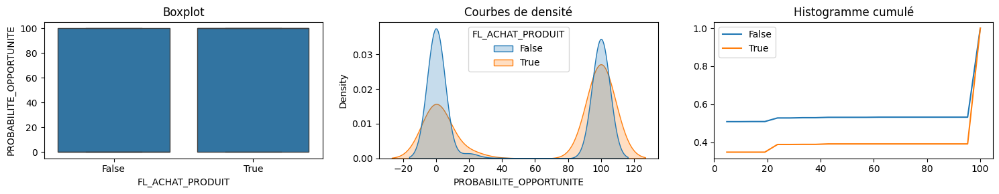

                    count       mean        std  min  25%    50%    75%    max
FL_ACHAT_PRODUIT                                                              
False             64092.0  47.328372  49.524023  0.0  0.0    0.0  100.0  100.0
True               4384.0  61.756387  47.861586  0.0  0.0  100.0  100.0  100.0

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(46.94), np.float64(47.71))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(60.34), np.float64(63.17))

Test de Shapiro-Wilk - Stat: 0.6468, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 138.6659, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 118807537.0000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: 0.0713, p-value: 0.0000 → Test significatif à 5%
Test de Kolmogorov-Smirnov - Stat: 0.1609, p-value: 0.0000 → Test significatif à 5%
Statistique KS : 0.16086226813098503
     Distributions modérément différentes
Eta2 

c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\scipy\stats\_axis_nan_policy.py:586: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 68476.
  res = hypotest_fun_out(*samples, **kwds)
c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\seaborn\categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)


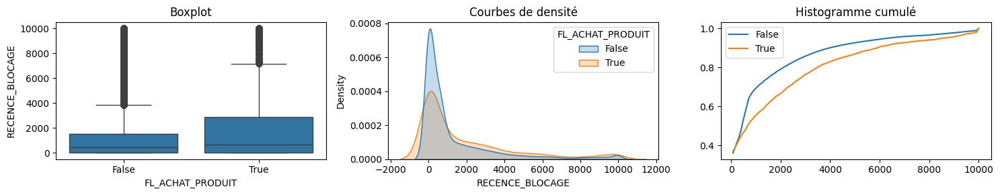

                    count         mean          std  min  25%    50%      75%  \
FL_ACHAT_PRODUIT                                                                
False             64092.0  1299.883355  2149.648295 -1.0 -1.0  441.0  1532.00   
True               4384.0  1902.791515  2631.086512 -1.0 -1.0  667.5  2860.25   

                      max  
FL_ACHAT_PRODUIT           
False             10000.0  
True              10000.0  

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(1283.24), np.float64(1316.53))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(1824.89), np.float64(1980.7))

Test de Shapiro-Wilk - Stat: 0.6532, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 358.8984, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 127771845.5000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: 0.0674, p-value: 0.0000 → Test significatif à 5%
Test de Kolmogorov-Smirnov - Stat: 0.140

c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\scipy\stats\_axis_nan_policy.py:586: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 68476.
  res = hypotest_fun_out(*samples, **kwds)
c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\seaborn\categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)


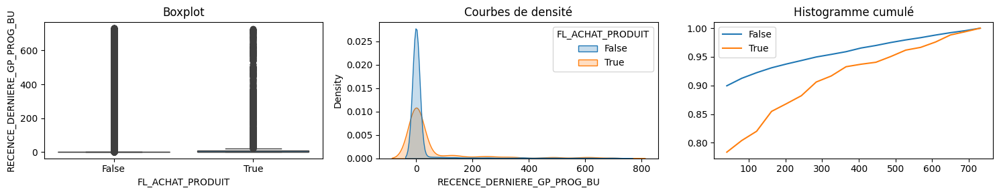

                    count       mean         std  min  25%  50%  75%    max
FL_ACHAT_PRODUIT                                                           
False             64092.0  32.528802  115.940863  0.0  0.0  0.0  0.0  731.0
True               4384.0  66.077555  153.400607  0.0  0.0  0.0  9.0  727.0

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(31.63), np.float64(33.43))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(61.54), np.float64(70.62))

Test de Shapiro-Wilk - Stat: 0.3276, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 327.8205, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 121393885.5000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: 0.0690, p-value: 0.0000 → Test significatif à 5%
Test de Kolmogorov-Smirnov - Stat: 0.1368, p-value: 0.0000 → Test significatif à 5%
Statistique KS : 0.13678721589084308
     Distributions modérément différentes
Eta2 : 2.73253166

c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\scipy\stats\_axis_nan_policy.py:586: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 68476.
  res = hypotest_fun_out(*samples, **kwds)
c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\seaborn\categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)


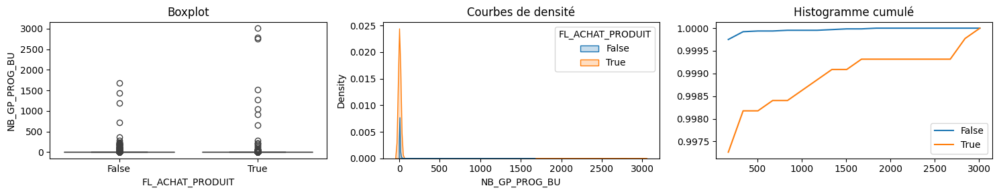

                    count      mean        std  min  25%  50%  75%     max
FL_ACHAT_PRODUIT                                                          
False             64092.0  0.812769  11.437748  0.0  0.0  0.0  0.0  1674.0
True               4384.0  5.212819  84.003779  0.0  0.0  0.0  1.0  3011.0

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(0.72), np.float64(0.9))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(2.73), np.float64(7.7))

Test de Shapiro-Wilk - Stat: 0.0151, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 138.3670, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 120479617.0000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: 0.0449, p-value: 0.0000 → Test significatif à 5%
Test de Kolmogorov-Smirnov - Stat: 0.1365, p-value: 0.0000 → Test significatif à 5%
Statistique KS : 0.13653909799371433
     Distributions modérément différentes
Eta2 : 2.7226275966297923e-

c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\scipy\stats\_axis_nan_policy.py:586: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 68476.
  res = hypotest_fun_out(*samples, **kwds)
c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\seaborn\categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)


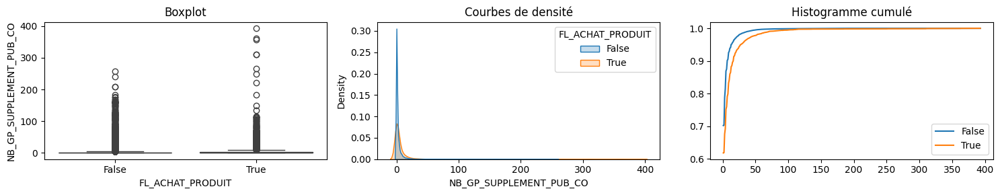

                    count      mean        std  min  25%  50%  75%    max
FL_ACHAT_PRODUIT                                                         
False             64092.0  2.569509   8.411459  0.0  0.0  0.0  2.0  258.0
True               4384.0  5.787181  18.464403  0.0  0.0  0.0  4.0  393.0

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(2.5), np.float64(2.63))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(5.24), np.float64(6.33))

Test de Shapiro-Wilk - Stat: 0.2953, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 482.5089, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 124311390.0000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: 0.0836, p-value: 0.0000 → Test significatif à 5%
Test de Kolmogorov-Smirnov - Stat: 0.1225, p-value: 0.0000 → Test significatif à 5%
Statistique KS : 0.12249173006777203
     Distributions modérément différentes
Eta2 : 2.1912288820905807e-07


c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\scipy\stats\_axis_nan_policy.py:586: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 68476.
  res = hypotest_fun_out(*samples, **kwds)
c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\seaborn\categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)


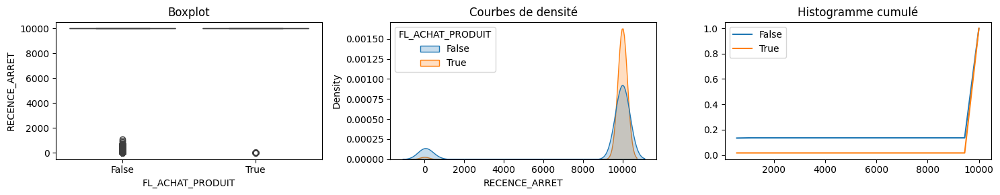

                    count         mean          std  min      25%      50%  \
FL_ACHAT_PRODUIT                                                             
False             64092.0  8649.622387  3405.085228 -1.0  10000.0  10000.0   
True               4384.0  9833.468750  1279.890633 -1.0  10000.0  10000.0   

                      75%      max  
FL_ACHAT_PRODUIT                    
False             10000.0  10000.0  
True              10000.0  10000.0  

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(8623.26), np.float64(8675.98))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(9795.57), np.float64(9871.37))

Test de Shapiro-Wilk - Stat: 0.3942, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 524.8357, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 123813713.0000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: 0.0872, p-value: 0.0000 → Test significatif à 5%
Test de Kolmogo

c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\scipy\stats\_axis_nan_policy.py:586: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 68476.
  res = hypotest_fun_out(*samples, **kwds)
c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\seaborn\categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)


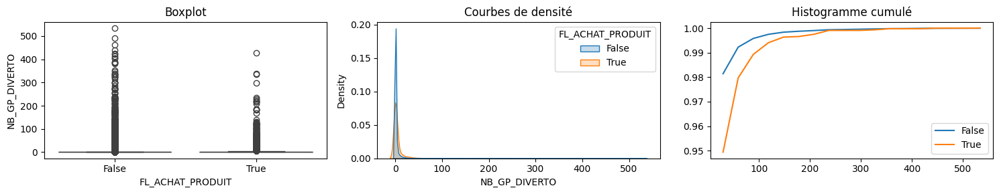

                    count      mean        std  min  25%  50%  75%    max
FL_ACHAT_PRODUIT                                                         
False             64092.0  2.372059  13.805550  0.0  0.0  0.0  0.0  534.0
True               4384.0  5.609033  20.504074  0.0  0.0  0.0  2.0  427.0

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(2.27), np.float64(2.48))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(5.0), np.float64(6.22))

Test de Shapiro-Wilk - Stat: 0.1642, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 209.4193, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 123507804.0000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: 0.0552, p-value: 0.0000 → Test significatif à 5%
Test de Kolmogorov-Smirnov - Stat: 0.1140, p-value: 0.0000 → Test significatif à 5%
Statistique KS : 0.11396301723662738
     Distributions modérément différentes
Eta2 : 1.8967150793445656e-07


c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\scipy\stats\_axis_nan_policy.py:586: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 68476.
  res = hypotest_fun_out(*samples, **kwds)
c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\seaborn\categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)


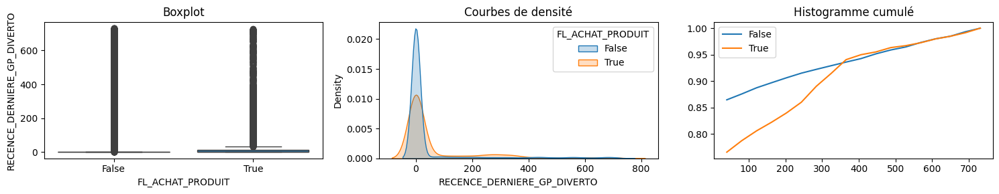

                    count      mean         std  min  25%  50%   75%    max
FL_ACHAT_PRODUIT                                                           
False             64092.0  48.44252  143.193432  0.0  0.0  0.0   0.0  731.0
True               4384.0  70.62021  152.443808  0.0  0.0  0.0  13.0  729.0

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(47.33), np.float64(49.55))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(66.11), np.float64(75.13))

Test de Shapiro-Wilk - Stat: 0.3967, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 97.5956, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 125278318.5000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: 0.0377, p-value: 0.0000 → Test significatif à 5%
Test de Kolmogorov-Smirnov - Stat: 0.1140, p-value: 0.0000 → Test significatif à 5%
Statistique KS : 0.11396301723662738
     Distributions modérément différentes
Eta2 : 1.896715079

c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\scipy\stats\_axis_nan_policy.py:586: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 68476.
  res = hypotest_fun_out(*samples, **kwds)
c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\seaborn\categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)


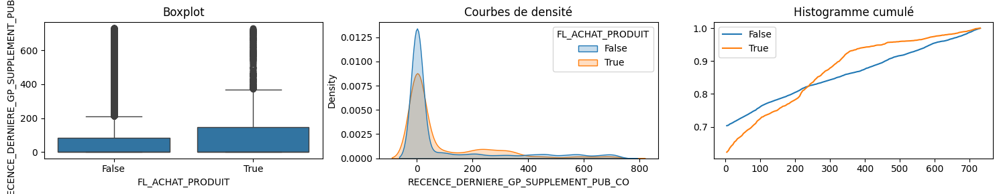

                    count        mean         std  min  25%  50%    75%    max
FL_ACHAT_PRODUIT                                                              
False             64092.0  100.352509  195.008161  0.0  0.0  0.0   85.0  730.0
True               4384.0   92.083485  161.565251  0.0  0.0  0.0  148.0  730.0

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(98.84), np.float64(101.86))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(87.3), np.float64(96.87))

Test de Shapiro-Wilk - Stat: 0.5830, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 7.5291, p-value: 0.0061 → Test significatif à 5%
Test de Mann-Whitney - Stat: 132620816.5000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: -0.0105, p-value: 0.0061 → Test significatif à 5%
Test de Kolmogorov-Smirnov - Stat: 0.0840, p-value: 0.0000 → Test significatif à 5%
Statistique KS : 0.08398404312505159
     Distributions quasi-identiques
Eta2 : 1.030

c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\scipy\stats\_axis_nan_policy.py:586: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 68476.
  res = hypotest_fun_out(*samples, **kwds)
c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\seaborn\categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)


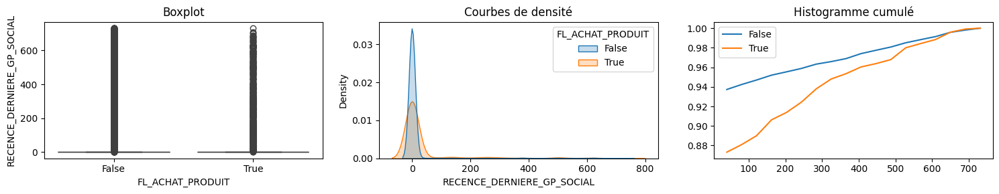

                    count       mean         std  min  25%  50%  75%    max
FL_ACHAT_PRODUIT                                                           
False             64092.0  22.477127   99.383268  0.0  0.0  0.0  0.0  731.0
True               4384.0  40.648038  123.633665  0.0  0.0  0.0  0.0  731.0

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(21.71), np.float64(23.25))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(36.99), np.float64(44.31))

Test de Shapiro-Wilk - Stat: 0.2484, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 132.5263, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 130261575.5000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: 0.0440, p-value: 0.0000 → Test significatif à 5%
Test de Kolmogorov-Smirnov - Stat: 0.0738, p-value: 0.0000 → Test significatif à 5%
Statistique KS : 0.07383758850757882
     Distributions quasi-identiques
Eta2 : 7.96213021368699

c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\scipy\stats\_axis_nan_policy.py:586: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 68476.
  res = hypotest_fun_out(*samples, **kwds)
c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\seaborn\categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)


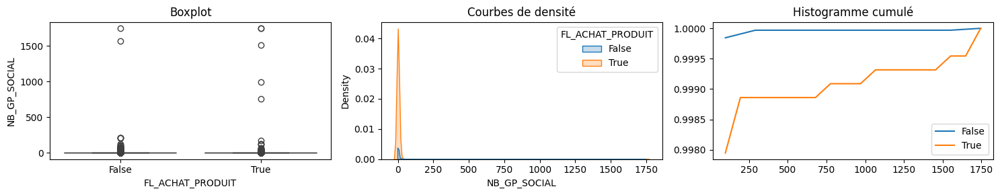

                    count      mean        std  min  25%  50%  75%     max
FL_ACHAT_PRODUIT                                                          
False             64092.0  0.452521   9.826871  0.0  0.0  0.0  0.0  1746.0
True               4384.0  2.504790  47.907465  0.0  0.0  0.0  0.0  1746.0

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(0.38), np.float64(0.53))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(1.09), np.float64(3.92))

Test de Shapiro-Wilk - Stat: 0.0117, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 72.8305, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 130025149.5000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: 0.0326, p-value: 0.0000 → Test significatif à 5%
Test de Kolmogorov-Smirnov - Stat: 0.0736, p-value: 0.0000 → Test significatif à 5%
Statistique KS : 0.07364815108391176
     Distributions quasi-identiques
Eta2 : 7.921327406638901e-08
   

c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\scipy\stats\_axis_nan_policy.py:586: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 68476.
  res = hypotest_fun_out(*samples, **kwds)
c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\seaborn\categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)


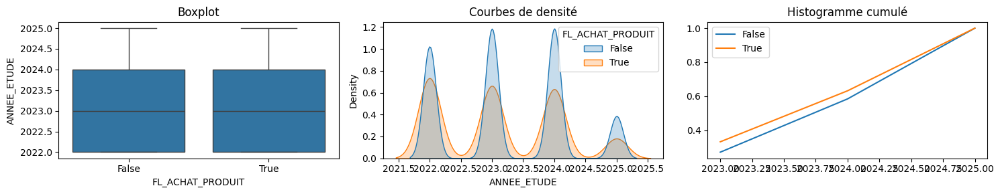

                    count         mean       std     min     25%     50%  \
FL_ACHAT_PRODUIT                                                           
False             64092.0  2023.247706  0.965390  2022.0  2022.0  2023.0   
True               4384.0  2023.118841  0.965653  2022.0  2022.0  2023.0   

                     75%     max  
FL_ACHAT_PRODUIT                  
False             2024.0  2025.0  
True              2024.0  2025.0  

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(2023.24), np.float64(2023.26))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(2023.09), np.float64(2023.15))

Test de Shapiro-Wilk - Stat: 0.8672, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 0.5001, p-value: 0.4794 → Test non significatif à 5%
Test de Mann-Whitney - Stat: 150876809.0000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: -0.0327, p-value: 0.0000 → Test significatif à 5%
Test de Kolmogorov-Smirnov -

c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\scipy\stats\_axis_nan_policy.py:586: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 68476.
  res = hypotest_fun_out(*samples, **kwds)
c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\seaborn\categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)


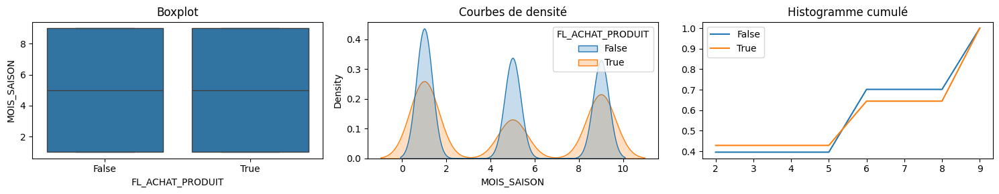

                    count      mean       std  min  25%  50%  75%  max
FL_ACHAT_PRODUIT                                                      
False             64092.0  4.612245  3.309246  1.0  1.0  5.0  9.0  9.0
True               4384.0  4.709854  3.530737  1.0  1.0  5.0  9.0  9.0

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(4.59), np.float64(4.64))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(4.61), np.float64(4.81))

Test de Shapiro-Wilk - Stat: 0.7813, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 159.8783, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 138866184.0000, p-value: 0.1723 → Test non significatif à 5%
Corrélation point bisériale - Stat: 0.0072, p-value: 0.0600 → Test non significatif à 5%
Test de Kolmogorov-Smirnov - Stat: 0.0574, p-value: 0.0000 → Test significatif à 5%
Statistique KS : 0.05739343216024784
     Distributions quasi-identiques
Eta2 : 4.8105936511255727e-08
    Relat

c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\scipy\stats\_axis_nan_policy.py:586: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 68476.
  res = hypotest_fun_out(*samples, **kwds)
c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\seaborn\categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)


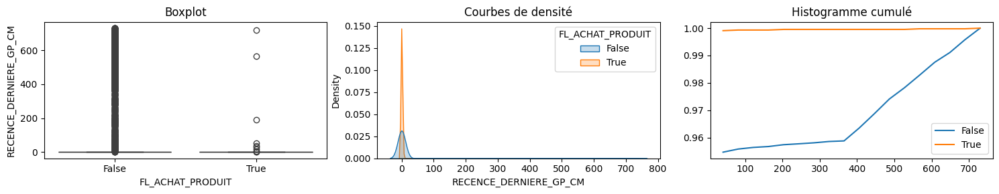

                    count       mean         std  min  25%  50%  75%    max
FL_ACHAT_PRODUIT                                                           
False             64092.0  23.047869  110.343051  0.0  0.0  0.0  0.0  730.0
True               4384.0   0.370666   14.173131  0.0  0.0  0.0  0.0  720.0

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(22.19), np.float64(23.9))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(-0.05), np.float64(0.79))

Test de Shapiro-Wilk - Stat: 0.2005, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 184.9541, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 146682508.0000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: -0.0519, p-value: 0.0000 → Test significatif à 5%
Test de Kolmogorov-Smirnov - Stat: 0.0445, p-value: 0.0000 → Test significatif à 5%
Statistique KS : 0.04452821525717365
     Distributions quasi-identiques
Eta2 : 2.895641990500781

c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\scipy\stats\_axis_nan_policy.py:586: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 68476.
  res = hypotest_fun_out(*samples, **kwds)
c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\seaborn\categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)


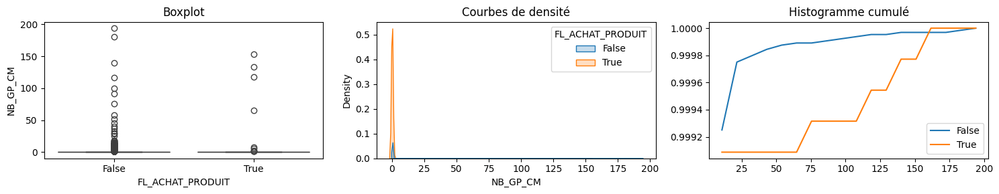

                    count      mean       std  min  25%  50%  75%    max
FL_ACHAT_PRODUIT                                                        
False             64092.0  0.097454  1.584105  0.0  0.0  0.0  0.0  194.0
True               4384.0  0.111542  3.678391  0.0  0.0  0.0  0.0  153.0

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(0.09), np.float64(0.11))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(0.0), np.float64(0.22))

Test de Shapiro-Wilk - Stat: 0.0232, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 0.2533, p-value: 0.6147 → Test non significatif à 5%
Test de Mann-Whitney - Stat: 146664191.0000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: 0.0019, p-value: 0.6147 → Test non significatif à 5%
Test de Kolmogorov-Smirnov - Stat: 0.0440, p-value: 0.0000 → Test significatif à 5%
Statistique KS : 0.04401180716041864
     Distributions quasi-identiques
Eta2 : 2.8288680590145093e-08
    

c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\scipy\stats\_axis_nan_policy.py:586: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 68476.
  res = hypotest_fun_out(*samples, **kwds)
c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\seaborn\categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)


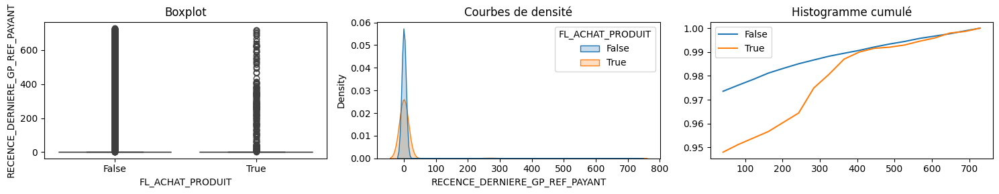

                    count       mean        std  min  25%  50%  75%    max
FL_ACHAT_PRODUIT                                                          
False             64092.0   8.634759  61.337426  0.0  0.0  0.0  0.0  729.0
True               4384.0  16.072765  76.970842  0.0  0.0  0.0  0.0  717.0

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(8.16), np.float64(9.11))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(13.79), np.float64(18.35))

Test de Shapiro-Wilk - Stat: 0.1317, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 58.1980, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 136089948.0000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: 0.0291, p-value: 0.0000 → Test significatif à 5%
Test de Kolmogorov-Smirnov - Stat: 0.0314, p-value: 0.0006 → Test significatif à 5%
Statistique KS : 0.03142409109897226
     Distributions quasi-identiques
Eta2 : 1.442114506463781e-08
 

c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\scipy\stats\_axis_nan_policy.py:586: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 68476.
  res = hypotest_fun_out(*samples, **kwds)
c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\seaborn\categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)


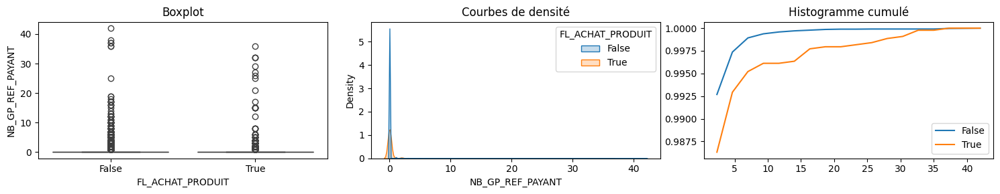

                    count     mean       std  min  25%  50%  75%   max
FL_ACHAT_PRODUIT                                                      
False             64092.0  0.06809  0.634505  0.0  0.0  0.0  0.0  42.0
True               4384.0  0.20438  1.567907  0.0  0.0  0.0  0.0  36.0

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(0.06), np.float64(0.07))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(0.16), np.float64(0.25))

Test de Shapiro-Wilk - Stat: 0.0768, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 142.6831, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 136042523.5000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: 0.0456, p-value: 0.0000 → Test significatif à 5%
Test de Kolmogorov-Smirnov - Stat: 0.0314, p-value: 0.0006 → Test significatif à 5%
Statistique KS : 0.03140848852766853
     Distributions quasi-identiques
Eta2 : 1.4406827954850728e-08
    Relation négl

c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\scipy\stats\_axis_nan_policy.py:586: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 68476.
  res = hypotest_fun_out(*samples, **kwds)
c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\seaborn\categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)


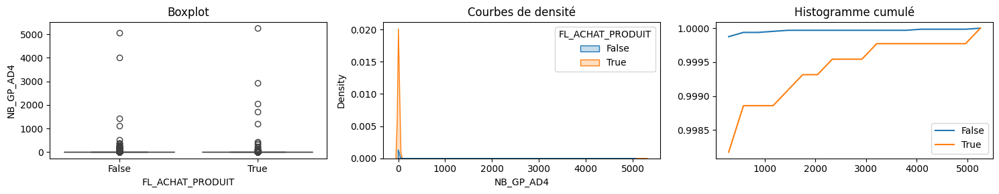

                    count      mean         std  min  25%  50%  75%     max
FL_ACHAT_PRODUIT                                                           
False             64092.0  1.055155   27.503855  0.0  0.0  0.0  0.0  5052.0
True               4384.0  4.544024  101.785134  0.0  0.0  0.0  0.0  5254.0

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(0.84), np.float64(1.27))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(1.53), np.float64(7.56))

Test de Shapiro-Wilk - Stat: 0.0106, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 36.4255, p-value: 0.0000 → Test significatif à 5%
Test de Mann-Whitney - Stat: 136611360.0000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: 0.0231, p-value: 0.0000 → Test significatif à 5%
Test de Kolmogorov-Smirnov - Stat: 0.0299, p-value: 0.0013 → Test significatif à 5%
Statistique KS : 0.029860730537443647
     Distributions quasi-identiques
Eta2 : 1.3021923892552633e-

c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\scipy\stats\_axis_nan_policy.py:586: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 68476.
  res = hypotest_fun_out(*samples, **kwds)
c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\seaborn\categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)


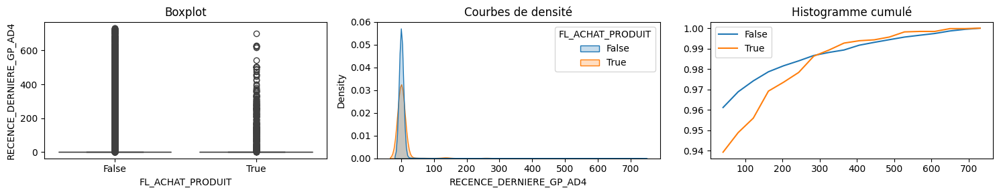

                    count       mean        std  min  25%  50%  75%    max
FL_ACHAT_PRODUIT                                                          
False             64092.0   9.937106  60.474880  0.0  0.0  0.0  0.0  731.0
True               4384.0  13.143476  60.720611  0.0  0.0  0.0  0.0  701.0

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(9.47), np.float64(10.41))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(11.35), np.float64(14.94))

Test de Shapiro-Wilk - Stat: 0.1612, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 11.5289, p-value: 0.0007 → Test significatif à 5%
Test de Mann-Whitney - Stat: 136642198.0000, p-value: 0.0000 → Test significatif à 5%
Corrélation point bisériale - Stat: 0.0130, p-value: 0.0007 → Test significatif à 5%
Test de Kolmogorov-Smirnov - Stat: 0.0274, p-value: 0.0041 → Test significatif à 5%
Statistique KS : 0.027446061797115617
     Distributions quasi-identiques
Eta2 : 1.100105587353075e-08

c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\scipy\stats\_axis_nan_policy.py:586: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 68476.
  res = hypotest_fun_out(*samples, **kwds)
c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\seaborn\categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)


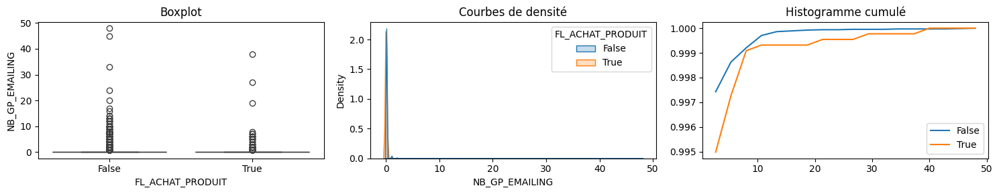

                    count      mean       std  min  25%  50%  75%   max
FL_ACHAT_PRODUIT                                                       
False             64092.0  0.032828  0.487137  0.0  0.0  0.0  0.0  48.0
True               4384.0  0.056113  0.849662  0.0  0.0  0.0  0.0  38.0

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(0.03), np.float64(0.04))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(0.03), np.float64(0.08))

Test de Shapiro-Wilk - Stat: 0.0379, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 8.2917, p-value: 0.0040 → Test significatif à 5%
Test de Mann-Whitney - Stat: 140208848.5000, p-value: 0.2928 → Test non significatif à 5%
Corrélation point bisériale - Stat: 0.0110, p-value: 0.0040 → Test significatif à 5%
Test de Kolmogorov-Smirnov - Stat: 0.0027, p-value: 1.0000 → Test non significatif à 5%
Statistique KS : 0.0026905751586109306
     Distributions quasi-identiques
Eta2 : 1.0572180219307903e-10
    R

c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\scipy\stats\_axis_nan_policy.py:586: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 68476.
  res = hypotest_fun_out(*samples, **kwds)
c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\seaborn\categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)


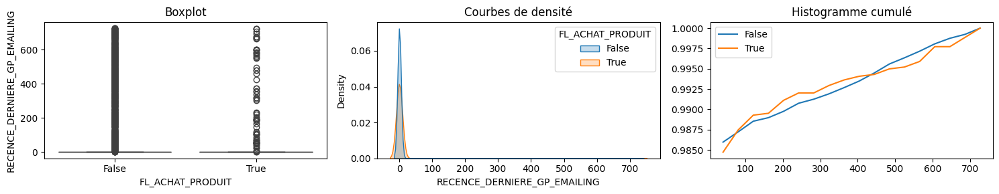

                    count      mean        std  min  25%  50%  75%    max
FL_ACHAT_PRODUIT                                                         
False             64092.0  5.130344  49.032333  0.0  0.0  0.0  0.0  727.0
True               4384.0  5.174042  50.411431  0.0  0.0  0.0  0.0  724.0

Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = False: (np.float64(4.75), np.float64(5.51))
Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = True: (np.float64(3.68), np.float64(6.67))

Test de Shapiro-Wilk - Stat: 0.0801, p-value: 0.0000 → Test significatif à 5%
Test de Levene - Stat: 0.0032, p-value: 0.9546 → Test non significatif à 5%
Test de Mann-Whitney - Stat: 140217576.5000, p-value: 0.3081 → Test non significatif à 5%
Corrélation point bisériale - Stat: 0.0002, p-value: 0.9546 → Test non significatif à 5%
Test de Kolmogorov-Smirnov - Stat: 0.0020, p-value: 1.0000 → Test non significatif à 5%
Statistique KS : 0.0019791064487135746
     Distributions quasi-identiques
Eta2 : 5.7202183823

c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\scipy\stats\_axis_nan_policy.py:586: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 68476.
  res = hypotest_fun_out(*samples, **kwds)


In [ ]:
columns_quanti = dt.drop('ID_COMPTE', axis=1).select_dtypes(include=['float64', 'int64', 'Int64']).columns
resultats = {}

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
        
    for column in columns_quanti:
        df = dt.copy()

        # Supprimer les lignes avec des NaN dans la colonne
        df = df.dropna(subset=[column])

        # Supprimer les valeurs infinies
        df = df[np.isfinite(df[column])]

        # Distance de Kolmogorov-Smirnov
        ks_stat, ks_p = stats.ks_2samp(df[column][df['FL_ACHAT_PRODUIT'] == False],
                                       df[column][df['FL_ACHAT_PRODUIT'] == True])

        # Rapport de corrélation Eta2
        eta2 = (ks_stat ** 2) / (ks_stat ** 2 + len(df[column]) - 2)

        # Sauvegarde des résultats
        resultats[column] = {
            'data': df,  # Je garde la data filtrée pour réafficher ensuite
            'ks_stat': ks_stat,
            'ks_p': ks_p,
            'eta2': eta2
        }

# Tri des variables par eta2 décroissant
resultats_tries = dict(sorted(resultats.items(), key=lambda item: item[1]['eta2'], reverse=True))

# Affichage final trié
for variable, infos in resultats_tries.items():
    print(f"Variable : {variable}")
    df = infos['data']
    ks_stat = infos['ks_stat']
    ks_p = infos['ks_p']
    eta2 = infos['eta2']

    print('---' * 30)
    print(f"Analyse de la variable '{variable}'\n")

    # Etude bivariée : Graphiques
    fig, axes = plt.subplots(1, 3, figsize=(15, 3))
    sns.boxplot(x='FL_ACHAT_PRODUIT', y=variable, data=df, ax=axes[0])
    axes[0].set_title('Boxplot')

    sns.kdeplot(data=df, x=variable, hue='FL_ACHAT_PRODUIT', fill=True, common_norm=False, ax=axes[1])
    axes[1].set_title('Courbes de densité')

    bins = np.histogram_bin_edges(df[variable], bins='auto')
    for label in df['FL_ACHAT_PRODUIT'].unique():
        subset = df[df['FL_ACHAT_PRODUIT'] == label][variable]
        counts, _ = np.histogram(subset, bins=bins)
        cum_counts = np.cumsum(counts) / counts.sum()
        axes[2].plot(bins[1:], cum_counts, label=str(label))
    axes[2].set_title('Histogramme cumulé')
    axes[2].legend()
    plt.tight_layout()
    plt.show()

    # Descriptif par groupe
    print(df.groupby('FL_ACHAT_PRODUIT')[variable].describe())
    print()

    # Intervalles de confiance
    for group in df['FL_ACHAT_PRODUIT'].unique():
        group_data = df[df['FL_ACHAT_PRODUIT'] == group][variable]
        conf_int = stats.t.interval(0.95, len(group_data)-1, loc=np.mean(group_data), scale=stats.sem(group_data))
        print(f"Intervalle de confiance pour 'FL_ACHAT_PRODUIT' = {group}: {(conf_int[0].round(2), conf_int[1].round(2))}")
    print()

    # Test de normalité
    shapiro_stat, shapiro_p = stats.shapiro(df[variable])
    normalite = shapiro_p >= 0.05
    significatif_shapiro = "non significatif" if normalite else "significatif"
    print(f'Test de Shapiro-Wilk - Stat: {shapiro_stat:.4f}, p-value: {shapiro_p:.4f} → Test {significatif_shapiro} à 5%')

    if normalite:
        bartlett_stat, bartlett_p = stats.bartlett(df[variable][df['FL_ACHAT_PRODUIT'] == False],
                                                   df[variable][df['FL_ACHAT_PRODUIT'] == True])
        equal_var = bartlett_p >= 0.05
        significatif_bartlett = "non significatif" if equal_var else "significatif"
        print(f'Test de Bartlett - Stat: {bartlett_stat:.4f}, p-value: {bartlett_p:.4f} → Test {significatif_bartlett} à 5%')
    else:
        levene_stat, levene_p = stats.levene(df[variable][df['FL_ACHAT_PRODUIT'] == False],
                                             df[variable][df['FL_ACHAT_PRODUIT'] == True])
        equal_var = levene_p >= 0.05
        significatif_levene = "non significatif" if equal_var else "significatif"
        print(f'Test de Levene - Stat: {levene_stat:.4f}, p-value: {levene_p:.4f} → Test {significatif_levene} à 5%')

    if normalite and equal_var:
        t_stat, t_p = stats.ttest_ind(df[variable][df['FL_ACHAT_PRODUIT'] == False],
                                      df[variable][df['FL_ACHAT_PRODUIT'] == True])
        significatif_t = "significatif" if t_p < 0.05 else "non significatif"
        print(f'Test de Student - Stat: {t_stat:.4f}, p-value: {t_p:.4f} → Test {significatif_t} à 5%')
    elif normalite and not equal_var:
        welch_stat, welch_p = stats.ttest_ind(df[variable][df['FL_ACHAT_PRODUIT'] == False],
                                              df[variable][df['FL_ACHAT_PRODUIT'] == True],
                                              equal_var=False)
        significatif_welch = "significatif" if welch_p < 0.05 else "non significatif"
        print(f'Test de Welch - Stat: {welch_stat:.4f}, p-value: {welch_p:.4f} → Test {significatif_welch} à 5%')
    else:
        mannwhitney_stat, mannwhitney_p = stats.mannwhitneyu(df[variable][df['FL_ACHAT_PRODUIT'] == False],
                                                             df[variable][df['FL_ACHAT_PRODUIT'] == True])
        significatif_mannwhitney = "significatif" if mannwhitney_p < 0.05 else "non significatif"
        print(f'Test de Mann-Whitney - Stat: {mannwhitney_stat:.4f}, p-value: {mannwhitney_p:.4f} → Test {significatif_mannwhitney} à 5%')

    corr, p_corr = stats.pointbiserialr(df['FL_ACHAT_PRODUIT'], df[variable])
    significatif_corr = "significatif" if p_corr < 0.05 else "non significatif"
    print(f"Corrélation point bisériale - Stat: {corr:.4f}, p-value: {p_corr:.4f} → Test {significatif_corr} à 5%")

    significatif_ks = "significatif" if ks_p < 0.05 else "non significatif"
    print(f'Test de Kolmogorov-Smirnov - Stat: {ks_stat:.4f}, p-value: {ks_p:.4f} → Test {significatif_ks} à 5%')

    print(f"Statistique KS : {ks_stat}")
    if ks_stat < 0.1:
        print("     Distributions quasi-identiques")
    elif 0.1 <= ks_stat <= 0.3:
        print("     Distributions modérément différentes")
    else:
        print("    Distributions significativement différentes")

    print(f"Eta2 : {eta2}")
    if eta2 < 0.01:
        print(f"    Relation négligeable")
    elif 0.01 <= eta2 < 0.06:
        print(f"    Relation faible")
    elif 0.06 <= eta2 < 0.14:
        print(f"    Relation modérée")
    else:
        print(f"    Relation forte")
    print('\n\n')


### Variables qualitatives

| **N°** | **Test**                   | **Objectif**                                                                           | **Conditions d’application**                                                  | **Hypothèse nulle (H₀)** | **Interprétation si rejet de H₀ / seuils**                                                 |
| ------ | -------------------------- | -------------------------------------------------------------------------------------- | ----------------------------------------------------------------------------- | ------------------------ | ------------------------------------------------------------------------------------------ |
| **1A** | Khi-deux d’indépendance    | Tester l’**indépendance** entre la variable qualitative et la cible                    | Effectifs théoriques ≥ 5 dans **≥ 80%** des cases                             | Indépendance             | Si p < 0.05 : **Association significative** entre les modalités de la variable et la cible |
| **1B** | Test exact de Fisher       | Idem Khi-deux mais pour petits effectifs ou tableau 2×2                                | Effectifs insuffisants (ou tableau 2×2)                                       | Indépendance             | Si p < 0.05 : **Association significative**                                                |
| **2A** | Coefficient V de Cramer    | Mesurer la **force de l’association** quand cible et variable ont même nb de modalités | Khi-deux applicable **et** nb modalités cible = nb modalités variable         | —                        | V < 0.1 : faible / 0.1 ≤ V < 0.3 : modérée / V ≥ 0.3 : **forte** association               |
| **2B** | Coefficient T de Tschuprow | Mesurer la **force de l’association** quand nb modalités ≠                             | Khi-deux applicable **et** nb modalités **différent** entre cible et variable | —                        | T < 0.1 : faible / 0.1 ≤ T < 0.3 : modérée / T ≥ 0.3 : **forte** association               |
| **(+)**  | Wilcoxon-Mann-Whitney (ou Mann-Whitney-Wilcoxon) | Vérifier si les **rangs** de la variable ordinale diffèrent entre les 2 groupes | Si **qualitatives ordinales** | Les **distributions sont identiques** entre les groupes | Si p < 0.05 : la variable **discrimine** significativement les groupes (par ex. clients ayant acheté sont dans une classe plus élevée) |

In [9]:
def calcul_cramersV_tschuprowT(conf_matrix, contingency_table):
    chi2_stat, p_val, dof, ex = stats.chi2_contingency(conf_matrix)
    n = conf_matrix.sum().sum()
    
    # return v et t
    return np.sqrt(chi2_stat / (n * (min(conf_matrix.shape) - 1))), np.sqrt(chi2_stat / (n * (min(contingency_table.shape) - 1)))

In [10]:
dt = data.copy()
dt.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 68476 entries, 0 to 68475
Columns: 157 entries, _ID_ to SAISON
dtypes: bool(26), float64(20), int64(40), object(71)
memory usage: 70.1+ MB


> Version initiae sans tri sur l'intensite de liaison

------------------------------------------------------------------------------------------
Analyse de la variable 'LIB_DAF2'



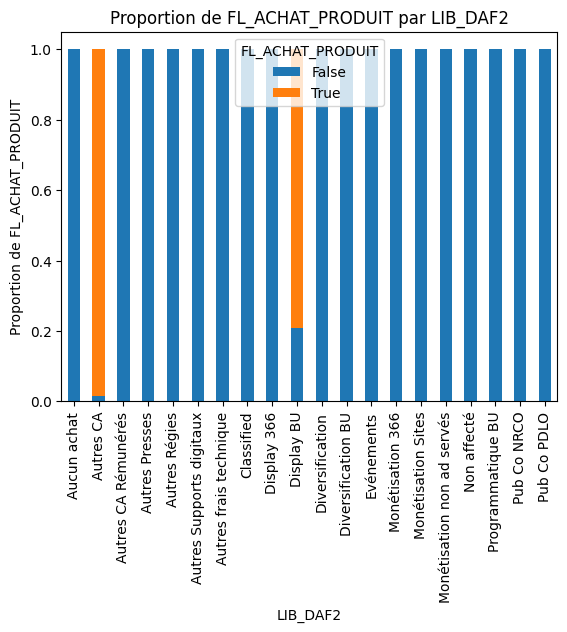


FL_ACHAT_PRODUIT            False  True 
LIB_DAF2                                
Aucun achat                 48306      0
Autres CA                      36   2274
Autres CA Rémunérés             6      0
Autres Presses                 64      0
Autres Régies                   4      0
Autres Supports digitaux       13      0
Autres frais technique          1      0
Classified                   2205      0
Display 366                    31      0
Display BU                    554   2113
Diversification              1285      0
Diversification BU            199      0
Evénements                    105      0
Monétisation 366               19      0
Monétisation Sites             90      0
Monétisation non ad servés      5      0
Non affecté                     8      0
Programmatique BU             464      0
Pub Co NRCO                    24      0
Pub Co PDLO                 10675      0

Test du Khi-Deux - Chi2 stat: 60569.4223, p-value: 0.0000, df: 19 → Test significatif à 5%
T de 

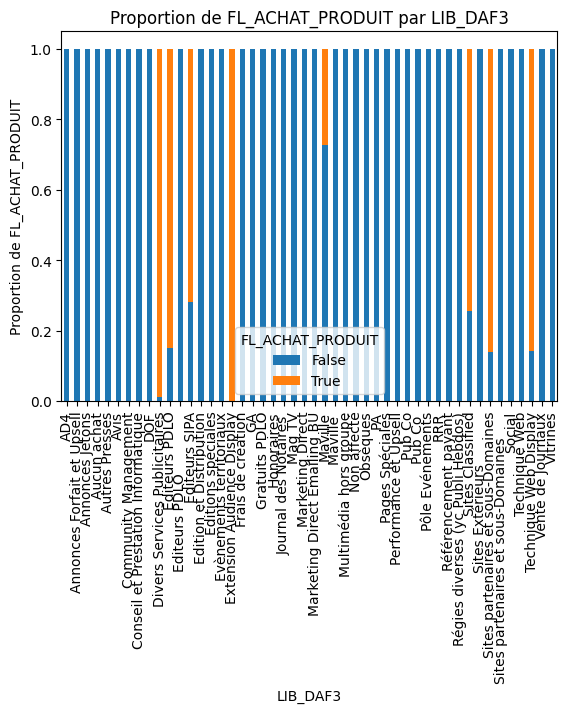


FL_ACHAT_PRODUIT                          False  True 
LIB_DAF3                                              
AD4                                         788      0
Annonces Forfait et Upsell                 1202      0
Annonces Jetons                              83      0
Aucun achat                               48306      0
Autres Presses                               64      0
Avis                                        778      0
Community Management                         51      0
Conseil et Prestation Informatique           76      0
DOF                                         131      0
Divers Services Publicitaires                25   2274
Editeurs PDLO                               238   1354
Editeurs PDLO                                 4      0
Editeurs SIPA                                 9     23
Edition et Distribution                       1      0
Editions spéciales                         1791      0
Evènements territoriaux                       2      0
Extension

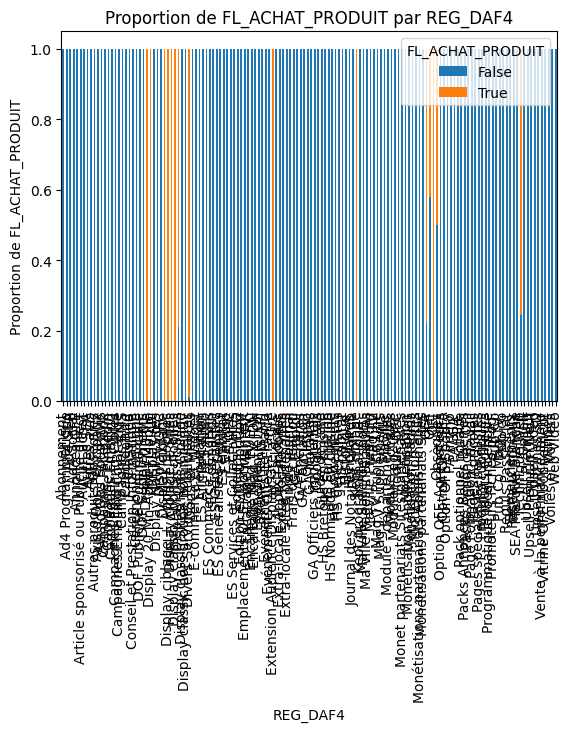


FL_ACHAT_PRODUIT             False  True 
REG_DAF4                                 
Abonnement                       1      0
Ad4 Programmatique             422      0
Ad4 SEA                         21      0
Ad4 Social                     345      0
Annonces OFE                    83      0
...                            ...    ...
Vente à la performance Immo      1      0
Vitrine OFE Abonnement          29      0
Vitrines                        47      0
Voiles et Voiliers               3      0
Web Vidéo                        1      0

[142 rows x 2 columns]

Test exact de Fisher - Stat: 0.0000, p-value: 0.0001 → Test significatif à 5%
Variables non valides pour le calcul de V de Cramer ou T de Tschuprow



------------------------------------------------------------------------------------------
Analyse de la variable 'GAMME_PRODUIT'



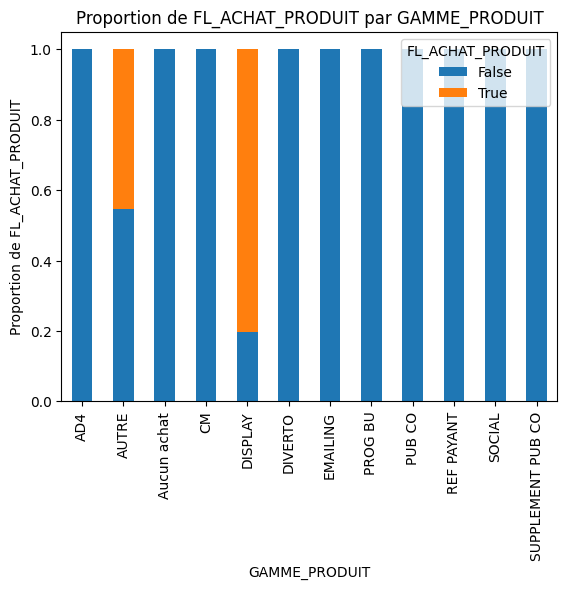


FL_ACHAT_PRODUIT   False  True 
GAMME_PRODUIT                  
AD4                  788      0
AUTRE               2753   2274
Aucun achat        48306      0
CM                    51      0
DISPLAY              523   2113
DIVERTO              878      0
EMAILING              58      0
PROG BU              464      0
PUB CO              7469      0
REF PAYANT           218      0
SOCIAL               234      0
SUPPLEMENT PUB CO   2352      0

Test du Khi-Deux - Chi2 stat: 40718.5372, p-value: 0.0000, df: 11 → Test significatif à 5%
T de Tschuprow : 0.7711
     Relation forte



------------------------------------------------------------------------------------------
Analyse de la variable 'DEPARTEMENT'



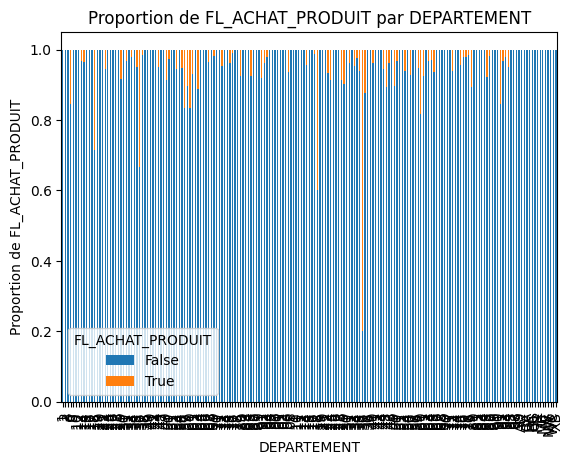


FL_ACHAT_PRODUIT  False  True 
DEPARTEMENT                   
1                     2      0
2                    11      0
3                     3      0
6                    11      2
8                     1      0
...                 ...    ...
N/                    3      0
NW                    7      0
W6                    7      0
WC                    8      0
XB                    4      0

[187 rows x 2 columns]

Test du Khi-Deux - Chi2 stat: 663.2086, p-value: 0.0000, df: 186 → Test significatif à 5%
T de Tschuprow : 0.0984
     Relation faible



------------------------------------------------------------------------------------------
Analyse de la variable 'CODE_POSTAL'



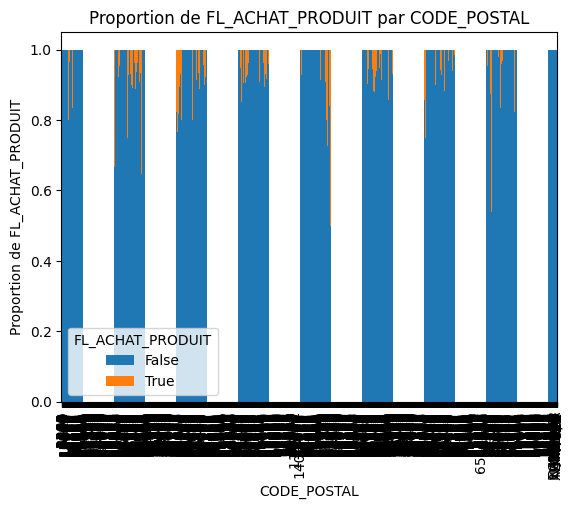


FL_ACHAT_PRODUIT  False  True 
CODE_POSTAL                   
35                    1      0
1100                  2      0
2000                  2      0
2260                  2      0
2300                  2      0
...                 ...    ...
N/D                   3      0
NW1 2FD               7      0
W6 7A                 7      0
WC2E                  8      0
XBX 1425              4      0

[2488 rows x 2 columns]

Test exact de Fisher - Stat: 0.0000, p-value: 1.0000 → Test non significatif à 5%
Variables non valides pour le calcul de V de Cramer ou T de Tschuprow



------------------------------------------------------------------------------------------
Analyse de la variable 'STATUT_SOCIETE'



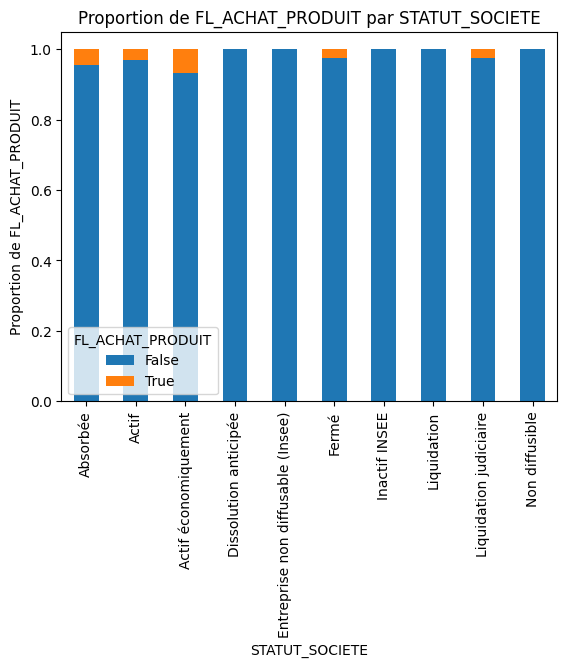


FL_ACHAT_PRODUIT                   False  True 
STATUT_SOCIETE                                 
Absorbée                              66      3
Actif                                123      4
Actif économiquement               57515   4217
Dissolution anticipée                125      0
Entreprise non diffusable (Insee)     27      0
Fermé                               4993    135
Inactif INSEE                          1      0
Liquidation                          146      0
Liquidation judiciaire              1095     28
Non diffusible                         3      0

Test du Khi-Deux - Chi2 stat: 192.4641, p-value: 0.0000, df: 9 → Test significatif à 5%
T de Tschuprow : 0.0530
     Relation faible



------------------------------------------------------------------------------------------
Analyse de la variable 'TYPE_FACTURE'



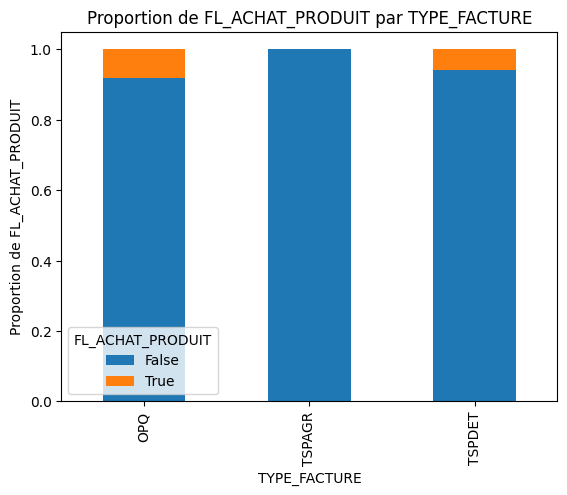


FL_ACHAT_PRODUIT  False  True 
TYPE_FACTURE                  
OPQ               14386   1263
TSPAGR               29      0
TSPDET            49679   3124

Test du Khi-Deux - Chi2 stat: 95.4394, p-value: 0.0000, df: 2 → Test significatif à 5%
T de Tschuprow : 0.0373
     Relation faible



------------------------------------------------------------------------------------------
Analyse de la variable 'MODE_PAIEMENT'



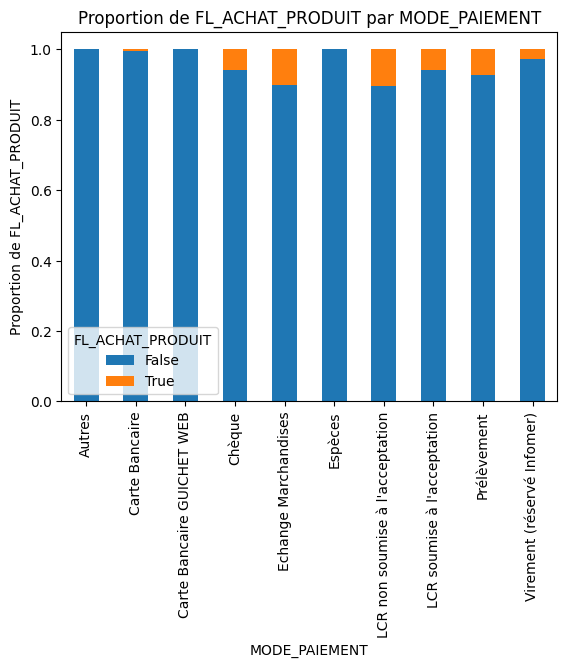


FL_ACHAT_PRODUIT                 False  True 
MODE_PAIEMENT                                
Autres                              56      0
Carte Bancaire                     247      1
Carte Bancaire GUICHET WEB           3      0
Chèque                           46163   2856
Echange Marchandises                 9      1
Espèces                             12      0
LCR non soumise à l'acceptation   5280    623
LCR soumise à l'acceptation        130      8
Prélèvement                      10639    853
Virement (réservé Infomer)        1555     45

Test du Khi-Deux - Chi2 stat: 271.1972, p-value: 0.0000, df: 9 → Test significatif à 5%
T de Tschuprow : 0.0629
     Relation faible



------------------------------------------------------------------------------------------
Analyse de la variable 'FREQUENCE_FACTURATION'



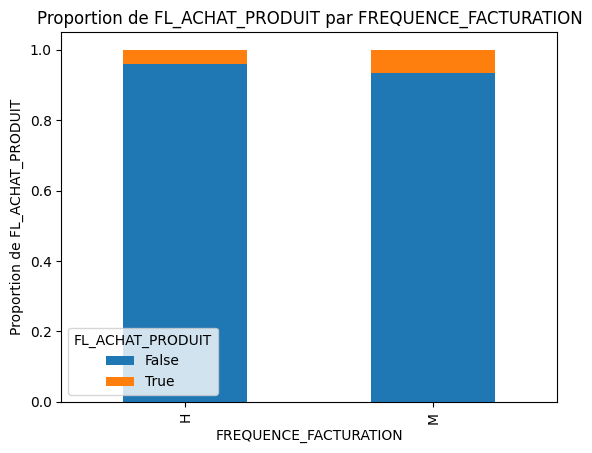


FL_ACHAT_PRODUIT       False  True 
FREQUENCE_FACTURATION              
H                       2843    117
M                      61251   4270

Test exact de Fisher - Stat: 1.6940, p-value: 0.0000 → Test significatif à 5%
Variables non valides pour le calcul de V de Cramer ou T de Tschuprow



------------------------------------------------------------------------------------------
Analyse de la variable 'DELAI_PAIEMENT'



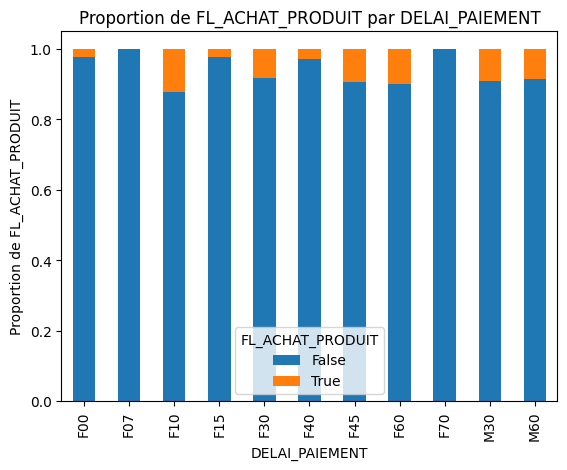


FL_ACHAT_PRODUIT  False  True 
DELAI_PAIEMENT                
F00                 859     19
F07                  56      0
F10                 114     16
F15               21084    484
F30               34318   3111
F40                  36      1
F45                1211    126
F60                 581     63
F70                  58      0
M30                5712    561
M60                  65      6

Test du Khi-Deux - Chi2 stat: 992.7654, p-value: 0.0000, df: 10 → Test significatif à 5%
T de Tschuprow : 0.1204
     Relation modérée



------------------------------------------------------------------------------------------
Analyse de la variable 'SOURCE_CREATION'



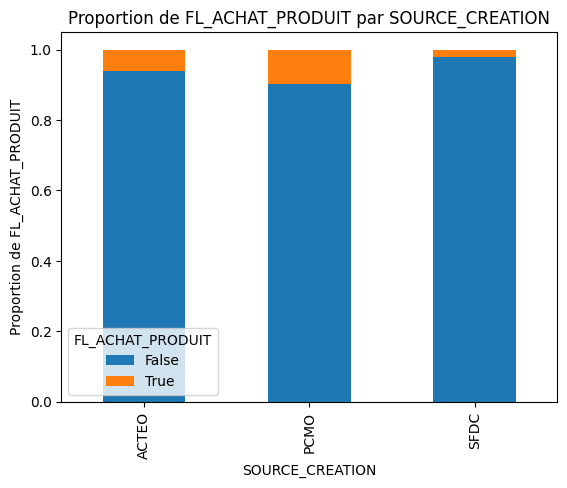


FL_ACHAT_PRODUIT  False  True 
SOURCE_CREATION               
ACTEO             15491   1015
PCMO              26877   2923
SFDC              21726    449

Test du Khi-Deux - Chi2 stat: 1287.1994, p-value: 0.0000, df: 2 → Test significatif à 5%
T de Tschuprow : 0.1371
     Relation modérée



------------------------------------------------------------------------------------------
Analyse de la variable 'PROCEDURE_COLLECTIVE'



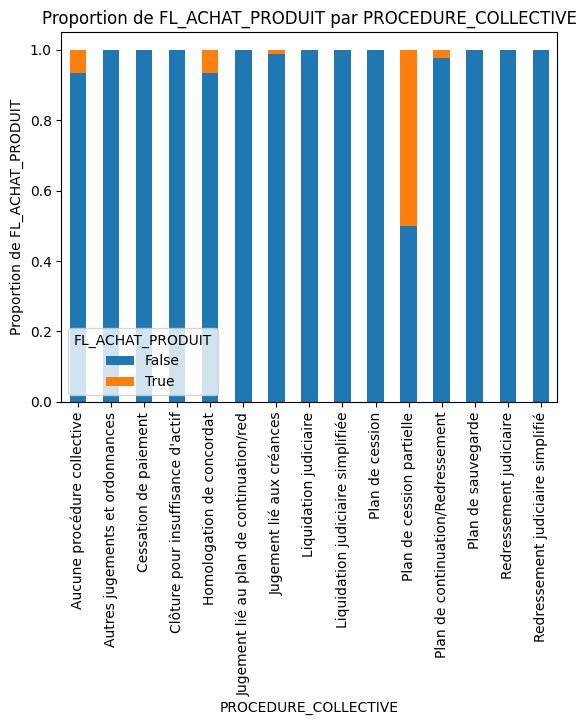


FL_ACHAT_PRODUIT                          False  True 
PROCEDURE_COLLECTIVE                                  
Aucune procédure collective               63343   4375
Autres jugements et ordonnances              39      0
Cessation de paiement                         5      0
Clôture pour insuffisance d'actif           136      0
Homologation de concordat                    57      4
Jugement lié au plan de continuation/red     39      0
Jugement lié aux créances                    85      1
Liquidation judiciaire                      106      0
Liquidation judiciaire simplifiée           102      0
Plan de cession                              54      0
Plan de cession partielle                     5      5
Plan de continuation/Redressement            82      2
Plan de sauvegarde                           14      0
Redressement judiciaire                      26      0
Redressement judiciaire simplifié             1      0

Test du Khi-Deux - Chi2 stat: 73.9757, p-value: 0.0000, df: 14 

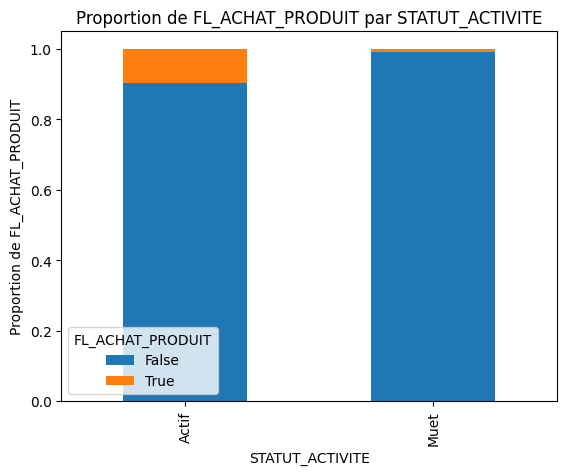


FL_ACHAT_PRODUIT  False  True 
STATUT_ACTIVITE               
Actif             39239   4193
Muet              24855    194

Test exact de Fisher - Stat: 0.0730, p-value: 0.0000 → Test significatif à 5%
Variables non valides pour le calcul de V de Cramer ou T de Tschuprow



------------------------------------------------------------------------------------------
Analyse de la variable 'STATUT_BENEFICIAIRE'



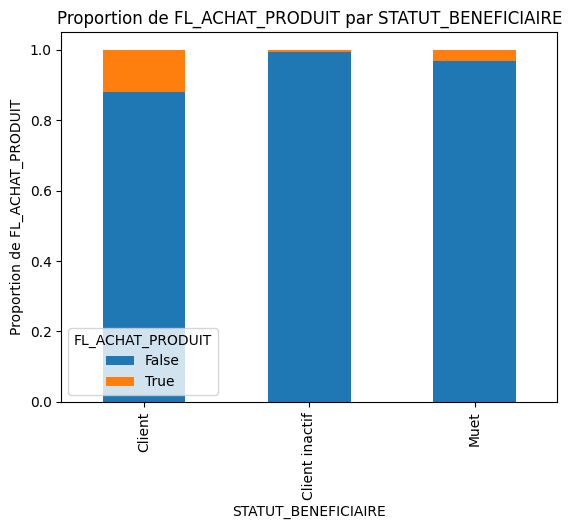


FL_ACHAT_PRODUIT     False  True 
STATUT_BENEFICIAIRE              
Client               28951   3916
Client inactif       25776    162
Muet                  9367    309

Test du Khi-Deux - Chi2 stat: 3275.9882, p-value: 0.0000, df: 2 → Test significatif à 5%
T de Tschuprow : 0.2187
     Relation modérée



------------------------------------------------------------------------------------------
Analyse de la variable 'PROFIL_CLIENT'



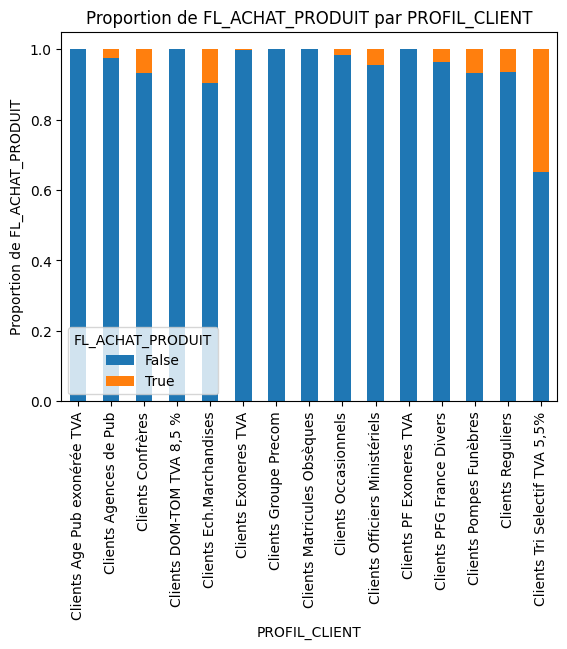


FL_ACHAT_PRODUIT                False  True 
PROFIL_CLIENT                               
Clients Age Pub exonérée TVA       16      0
Clients Agences de Pub            521     13
Clients Confrères                 168     12
Clients DOM-TOM TVA 8,5 %           9      0
Clients Ech.Marchandises           28      3
Clients Exoneres TVA              335      1
Clients Groupe Precom              59      0
Clients Matricules Obsèques         3      0
Clients Occasionnels             1770     28
Clients Officiers Ministériels    230     11
Clients PF Exoneres TVA            13      0
Clients PFG France Divers          27      1
Clients Pompes Funèbres          1038     76
Clients Reguliers               59862   4234
Clients Tri Selectif TVA 5,5%      15      8

Test du Khi-Deux - Chi2 stat: 150.0906, p-value: 0.0000, df: 14 → Test significatif à 5%
T de Tschuprow : 0.0468
     Relation faible



------------------------------------------------------------------------------------------
Analy

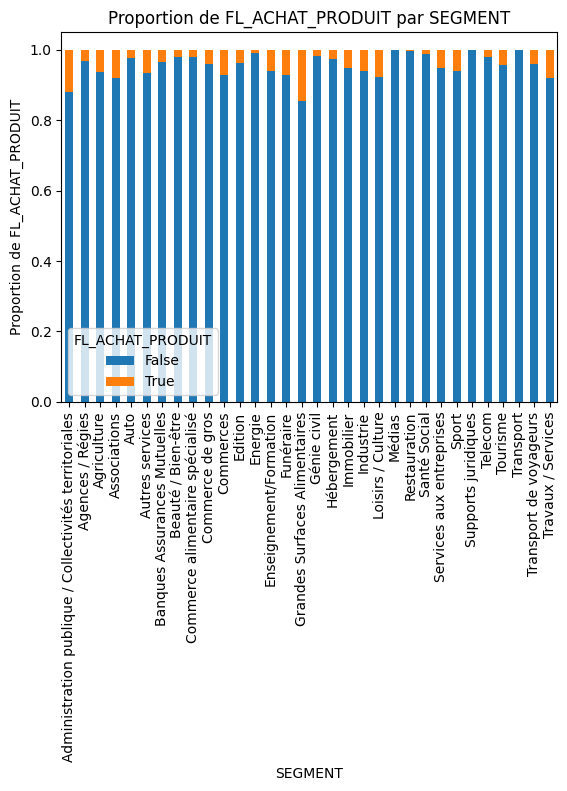


FL_ACHAT_PRODUIT                                    False  True 
SEGMENT                                                         
Administration publique / Collectivités territo...   2250    304
Agences / Régies                                      784     25
Agriculture                                          4032    273
Associations                                          753     65
Auto                                                  448     10
Autres services                                      1977    136
Banques Assurances Mutuelles                          800     29
Beauté / Bien-être                                    866     17
Commerce alimentaire spécialisé                      2053     44
Commerce de gros                                      762     33
Commerces                                           13299   1018
Edition                                               236      9
Energie                                               114      1
Enseignement/Formation  

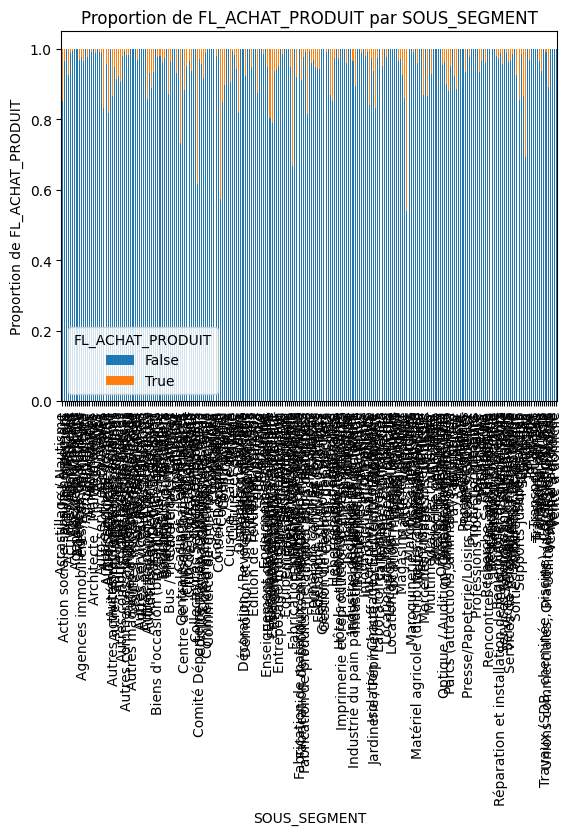


FL_ACHAT_PRODUIT                                  False  True 
SOUS_SEGMENT                                                  
Accastillage / Nautisme                              97     17
Action sociale sans hébergement                     172      6
Activité forestière                                  24      0
Activité maritime                                    37      3
Activités hospitalières                             192      2
...                                                 ...    ...
Unions commerciales, Grands magasins et Galeries    578     70
Utilitaires et poids lourds                           2      0
Vente par automate                                    3      0
Vente à distance                                     50      0
Vente à domicile                                      9      0

[239 rows x 2 columns]

Test du Khi-Deux - Chi2 stat: 3040.2437, p-value: 0.0000, df: 238 → Test significatif à 5%
T de Tschuprow : 0.2107
     Relation modérée



---------------

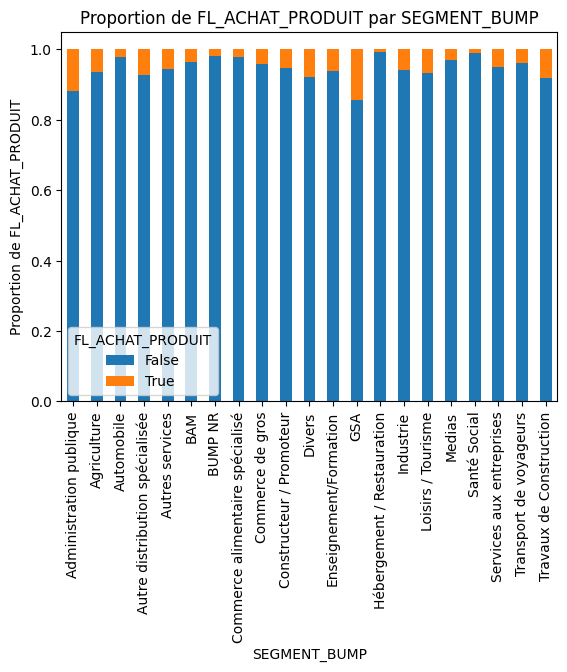


FL_ACHAT_PRODUIT                 False  True 
SEGMENT_BUMP                                 
Administration publique           2250    304
Agriculture                       4032    273
Automobile                         448     10
Autre distribution spécialisée   13105   1018
Autres services                   4200    249
BAM                                800     29
BUMP NR                            744     13
Commerce alimentaire spécialisé   2053     44
Commerce de gros                   762     33
Constructeur / Promoteur          7462    416
Divers                             753     65
Enseignement/Formation            3024    196
GSA                               2879    486
Hébergement / Restauration        2139     16
Industrie                         3061    193
Loisirs / Tourisme                4673    337
Medias                             784     25
Santé Social                      2176     24
Services aux entreprises          2686    140
Transport de voyageurs           

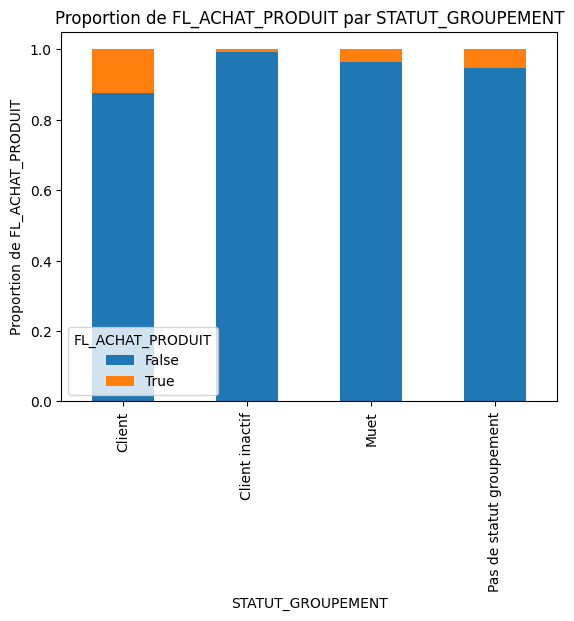


FL_ACHAT_PRODUIT          False  True 
STATUT_GROUPEMENT                     
Client                    10451   1473
Client inactif             1769     15
Muet                       1234     45
Pas de statut groupement  50640   2854

Test du Khi-Deux - Chi2 stat: 915.6535, p-value: 0.0000, df: 3 → Test significatif à 5%
T de Tschuprow : 0.1156
     Relation modérée



------------------------------------------------------------------------------------------
Analyse de la variable 'GROUPEMENT'



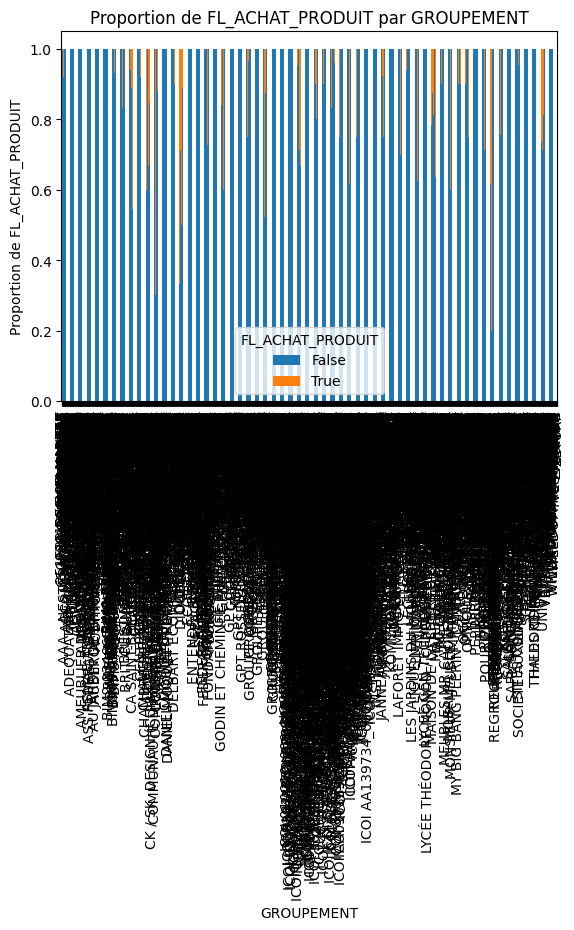


FL_ACHAT_PRODUIT       False  True 
GROUPEMENT                         
030127-BATI NANTES        23      0
228145                     7      2
251630 DESIGN HABITAT      4      0
5 MENHIRS                  4      0
650899 GROUPE LAUNAY      20     12
...                      ...    ...
YVES ROCHER                8      0
YVON                       3      0
YVONNOU                    6      1
Z COMME                    3      0
ZETURF                    10      0

[1547 rows x 2 columns]

Test exact de Fisher - Stat: 0.0000, p-value: 1.0000 → Test non significatif à 5%
Variables non valides pour le calcul de V de Cramer ou T de Tschuprow



------------------------------------------------------------------------------------------
Analyse de la variable 'RECORD_TYPE_NAME'



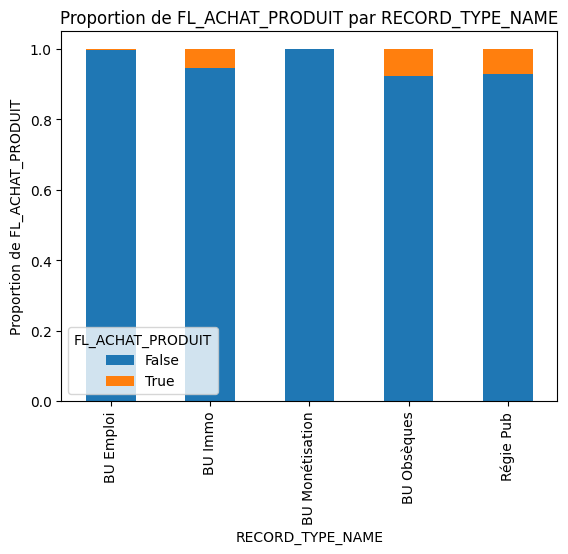


FL_ACHAT_PRODUIT  False  True 
RECORD_TYPE_NAME              
BU Emploi          3532     11
BU Immo            7205    418
BU Monétisation     511      0
BU Obsèques        1489    123
Régie Pub         51357   3835

Test du Khi-Deux - Chi2 stat: 296.4723, p-value: 0.0000, df: 4 → Test significatif à 5%
T de Tschuprow : 0.0658
     Relation faible



------------------------------------------------------------------------------------------
Analyse de la variable 'ETAPE_OPPORTUNITE'



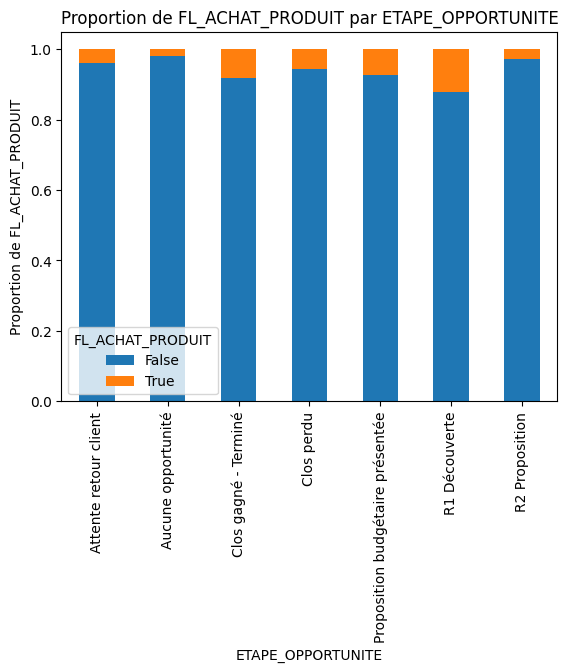


FL_ACHAT_PRODUIT                  False  True 
ETAPE_OPPORTUNITE                             
Attente retour client                76      3
Aucune opportunité                 9749    178
Clos gagné - Terminé              29894   2662
Clos perdu                        22669   1330
Proposition budgétaire présentée    142     11
R1 Découverte                      1455    200
R2 Proposition                      109      3

Test du Khi-Deux - Chi2 stat: 645.0949, p-value: 0.0000, df: 6 → Test significatif à 5%
T de Tschuprow : 0.0971
     Relation faible



------------------------------------------------------------------------------------------
Analyse de la variable 'TYPE_PRODUIT_OPPORTUNITE'



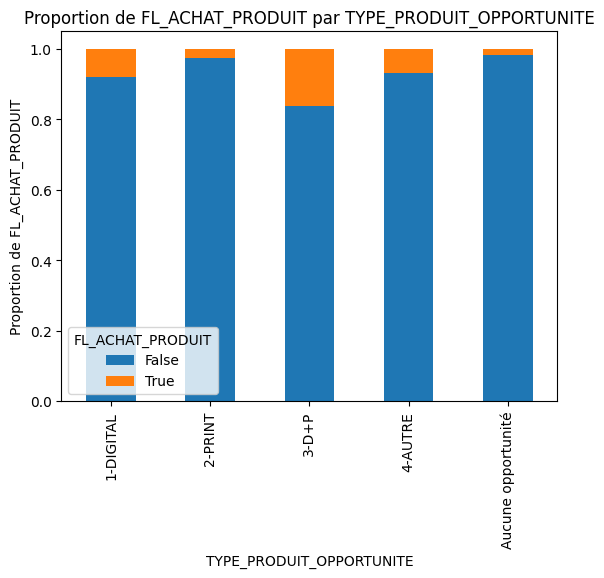


FL_ACHAT_PRODUIT          False  True 
TYPE_PRODUIT_OPPORTUNITE              
1-DIGITAL                  8549    729
2-PRINT                   26781    722
3-D+P                     11431   2198
4-AUTRE                    7584    560
Aucune opportunité         9749    178

Test du Khi-Deux - Chi2 stat: 3191.8115, p-value: 0.0000, df: 4 → Test significatif à 5%
T de Tschuprow : 0.2159
     Relation modérée



------------------------------------------------------------------------------------------
Analyse de la variable 'STATUT_DETAIL_PERE'



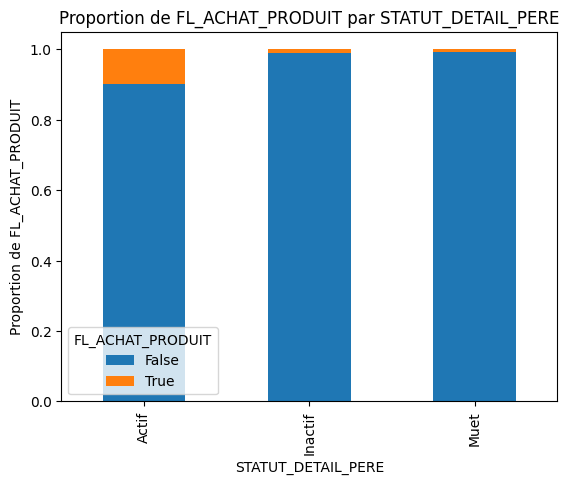


FL_ACHAT_PRODUIT    False  True 
STATUT_DETAIL_PERE              
Actif               38198   4222
Inactif              1391     13
Muet                24505    152

Test du Khi-Deux - Chi2 stat: 2338.7951, p-value: 0.0000, df: 2 → Test significatif à 5%
T de Tschuprow : 0.1848
     Relation modérée



------------------------------------------------------------------------------------------
Analyse de la variable 'DETAIL_TYPE_SUPPORT'



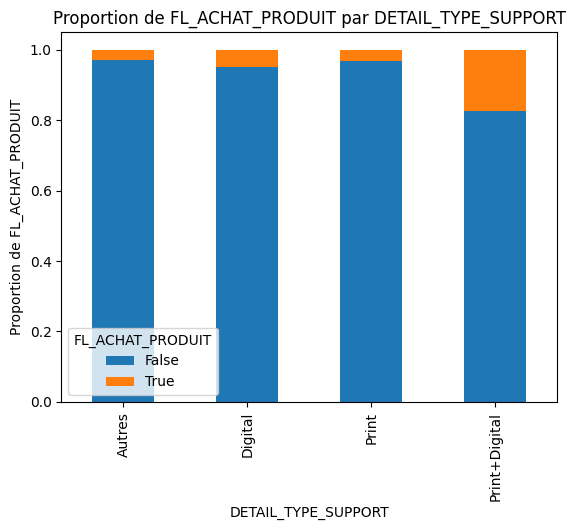


FL_ACHAT_PRODUIT     False  True 
DETAIL_TYPE_SUPPORT              
Autres                1666     51
Digital              14611    752
Print                36271   1165
Print+Digital        11546   2419

Test du Khi-Deux - Chi2 stat: 3545.1166, p-value: 0.0000, df: 3 → Test significatif à 5%
T de Tschuprow : 0.2275
     Relation modérée



------------------------------------------------------------------------------------------
Analyse de la variable 'DETAIL_TYPE_PRODUIT'



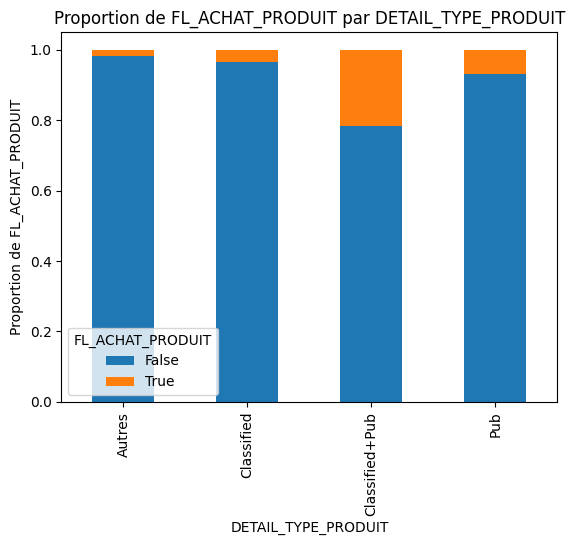


FL_ACHAT_PRODUIT     False  True 
DETAIL_TYPE_PRODUIT              
Autres                 942     18
Classified            8181    287
Classified+Pub         396    110
Pub                  54575   3972

Test du Khi-Deux - Chi2 stat: 373.7914, p-value: 0.0000, df: 3 → Test significatif à 5%
T de Tschuprow : 0.0739
     Relation faible



------------------------------------------------------------------------------------------
Analyse de la variable 'ACHAT_PRODUIT'



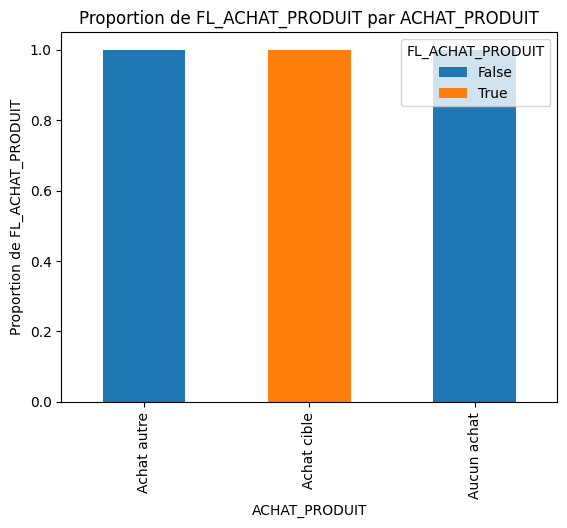


FL_ACHAT_PRODUIT  False  True 
ACHAT_PRODUIT                 
Achat autre       15788      0
Achat cible           0   4387
Aucun achat       48306      0

Test du Khi-Deux - Chi2 stat: 68481.0000, p-value: 0.0000, df: 2 → Test significatif à 5%
T de Tschuprow : 1.0000
     Relation forte



------------------------------------------------------------------------------------------
Analyse de la variable 'FORME_JURIDIQUE_MISSING'



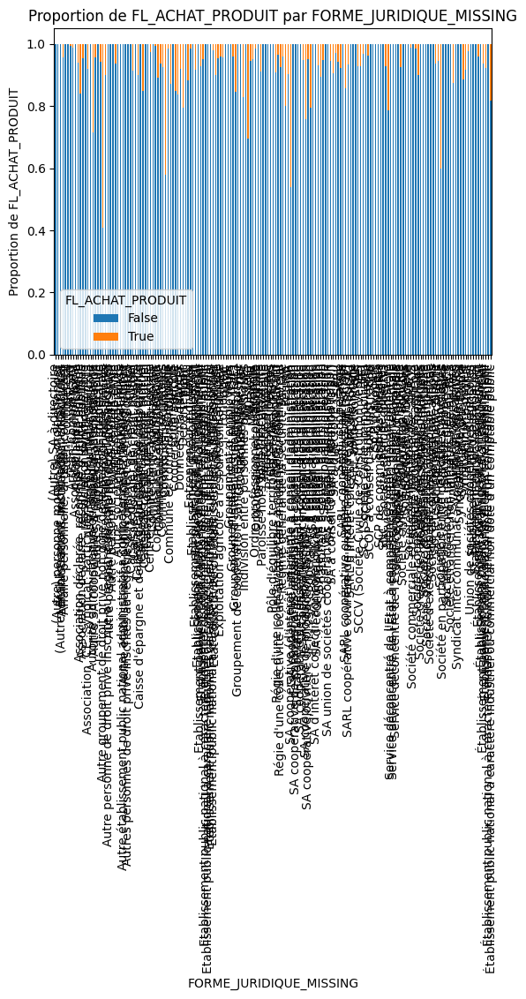


FL_ACHAT_PRODUIT                                    False  True 
FORME_JURIDIQUE_MISSING                                         
(Autre) SA à directoire                                13      0
(Autre) personne morale de droit étranger               2      0
(Autre) Établissement public administratif local        5      0
Administrations, institutions, collectivités           90      4
Affaire personnelle, artisan, commercant               46      0
...                                                   ...    ...
Établissement public local social et médico-social     15      0
Établissement public local à caractère industri...    135      9
Établissement public national à caractère admin...     47      4
Établissement public national à caractère indus...      3      0
Établissement public national à caractère indus...     18      4

[175 rows x 2 columns]

Test du Khi-Deux - Chi2 stat: 794.5152, p-value: 0.0000, df: 174 → Test significatif à 5%
T de Tschuprow : 0.1077
     Relation m

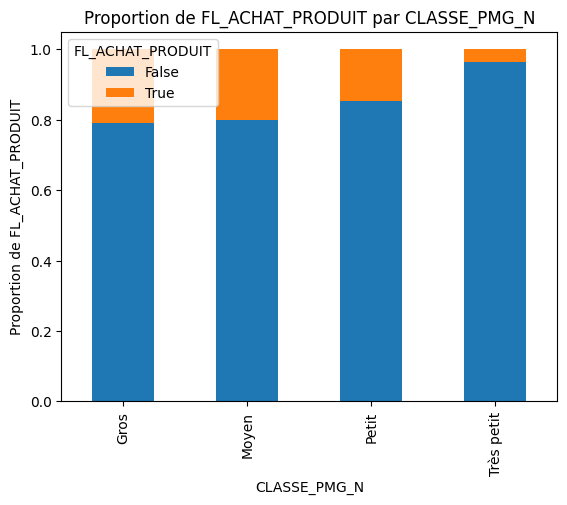


FL_ACHAT_PRODUIT  False  True 
CLASSE_PMG_N                  
Gros                776    204
Moyen              2027    510
Petit             10567   1796
Très petit        50724   1877

Test du Khi-Deux - Chi2 stat: 3199.5416, p-value: 0.0000, df: 3 → Test significatif à 5%
T de Tschuprow : 0.2162
     Relation modérée



------------------------------------------------------------------------------------------
Analyse de la variable 'CLASSE_PMG_N1'



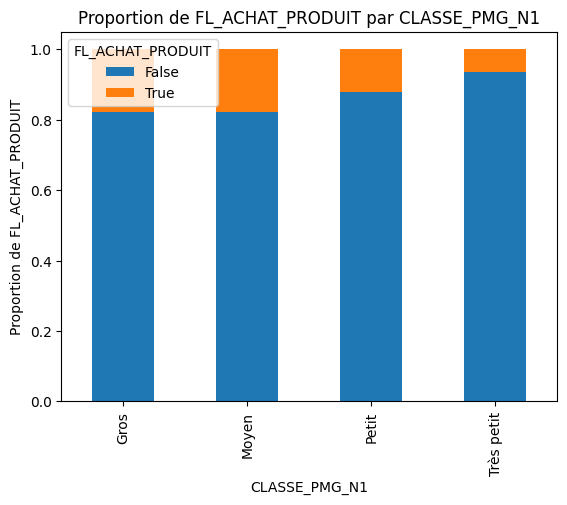


FL_ACHAT_PRODUIT  False  True 
CLASSE_PMG_N1                 
Gros                861    187
Moyen              2150    466
Petit             11915   1632
Très petit        22754   1577

Test du Khi-Deux - Chi2 stat: 666.0227, p-value: 0.0000, df: 3 → Test significatif à 5%
T de Tschuprow : 0.1266
     Relation modérée



------------------------------------------------------------------------------------------
Analyse de la variable 'INDICATEUR_RF'



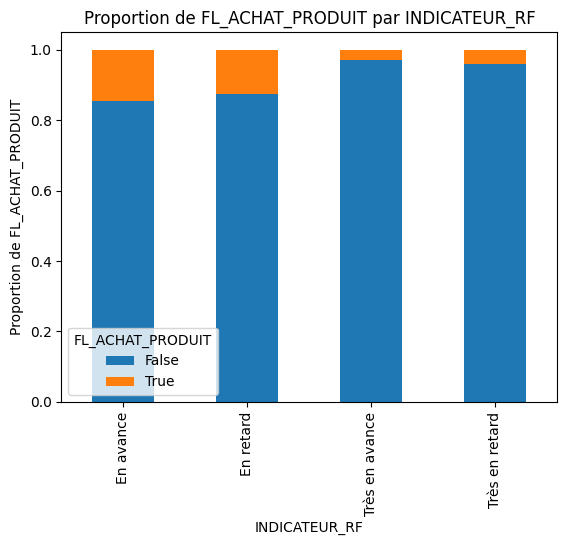


FL_ACHAT_PRODUIT  False  True 
INDICATEUR_RF                 
En avance          2800    480
En retard         18942   2712
Très en avance      102      3
Très en retard    26916   1120

Test du Khi-Deux - Chi2 stat: 1391.3432, p-value: 0.0000, df: 3 → Test significatif à 5%
T de Tschuprow : 0.1619
     Relation modérée



------------------------------------------------------------------------------------------
Analyse de la variable 'INDICATEUR_MONTANT'



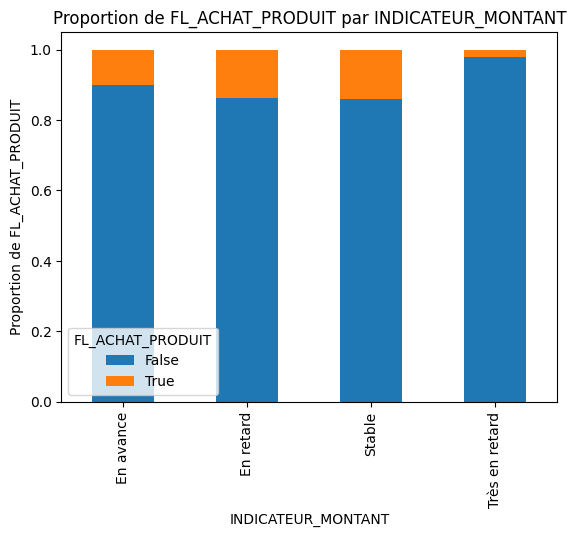


FL_ACHAT_PRODUIT    False  True 
INDICATEUR_MONTANT              
En avance           20691   2342
En retard            3012    479
Stable               5207    844
Très en retard      35184    722

Test du Khi-Deux - Chi2 stat: 2586.1668, p-value: 0.0000, df: 3 → Test significatif à 5%
T de Tschuprow : 0.1943
     Relation modérée



------------------------------------------------------------------------------------------
Analyse de la variable 'INDICATEUR_RFM'



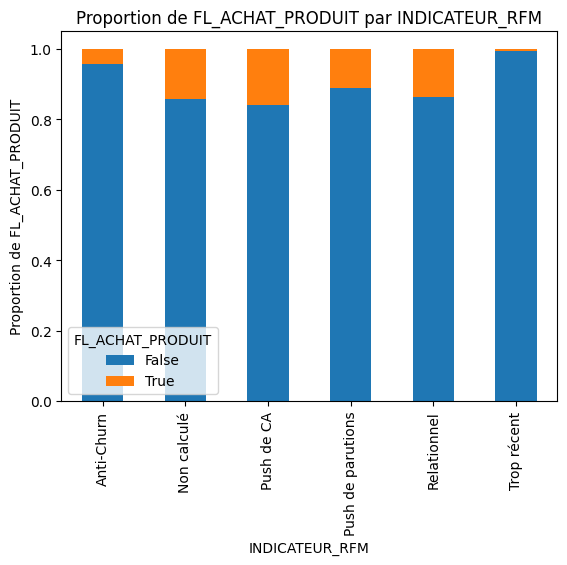


FL_ACHAT_PRODUIT   False  True 
INDICATEUR_RFM                 
Anti-Churn         23446   1026
Non calculé          473     79
Push de CA           578    109
Push de parutions  22412   2806
Relationnel         1851    295
Trop récent        15334     72

Test du Khi-Deux - Chi2 stat: 2396.5099, p-value: 0.0000, df: 5 → Test significatif à 5%
T de Tschuprow : 0.1871
     Relation modérée



------------------------------------------------------------------------------------------
Analyse de la variable 'INDICATEUR_RF_GP_DIVERTO'



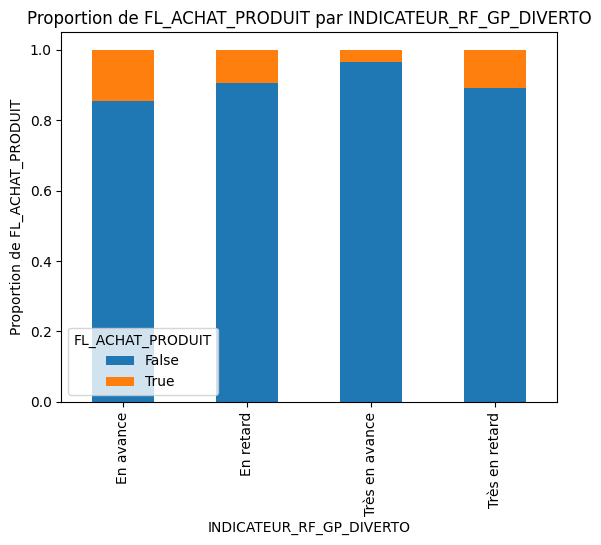


FL_ACHAT_PRODUIT          False  True 
INDICATEUR_RF_GP_DIVERTO              
En avance                 10078   1699
En retard                  1436    151
Très en avance            44918   1594
Très en retard             7662    943

Test du Khi-Deux - Chi2 stat: 2274.9834, p-value: 0.0000, df: 3 → Test significatif à 5%
T de Tschuprow : 0.1823
     Relation modérée



------------------------------------------------------------------------------------------
Analyse de la variable 'INDICATEUR_RF_GP_AUTRE'



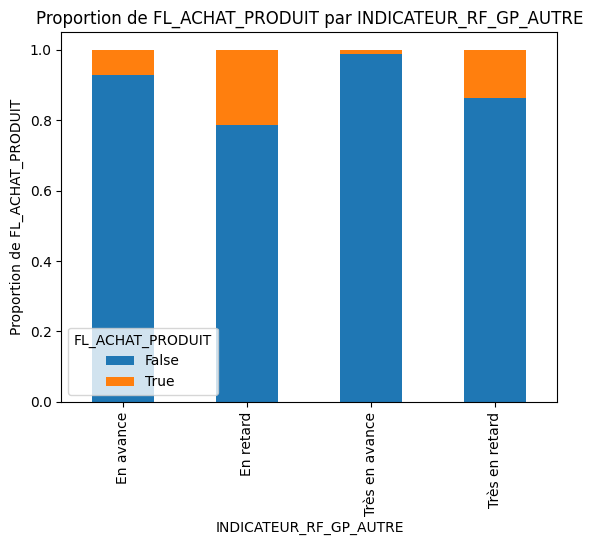


FL_ACHAT_PRODUIT        False  True 
INDICATEUR_RF_GP_AUTRE              
En avance                6856    537
En retard                3366    909
Très en avance          38078    416
Très en retard          15794   2525

Test du Khi-Deux - Chi2 stat: 5066.5540, p-value: 0.0000, df: 3 → Test significatif à 5%
T de Tschuprow : 0.2720
     Relation modérée



------------------------------------------------------------------------------------------
Analyse de la variable 'INDICATEUR_RF_GP_PUB_CO'



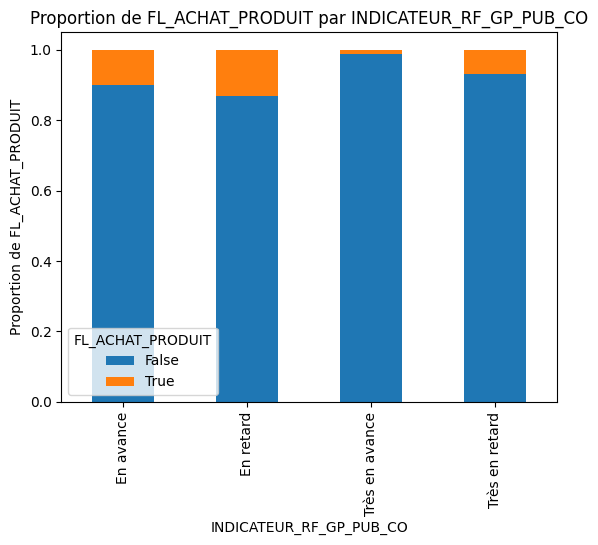


FL_ACHAT_PRODUIT         False  True 
INDICATEUR_RF_GP_PUB_CO              
En avance                 5387    603
En retard                 8348   1270
Très en avance           18960    237
Très en retard           31399   2277

Test du Khi-Deux - Chi2 stat: 1738.6541, p-value: 0.0000, df: 3 → Test significatif à 5%
T de Tschuprow : 0.1593
     Relation modérée



------------------------------------------------------------------------------------------
Analyse de la variable 'INDICATEUR_RF_GP_DISPLAY'



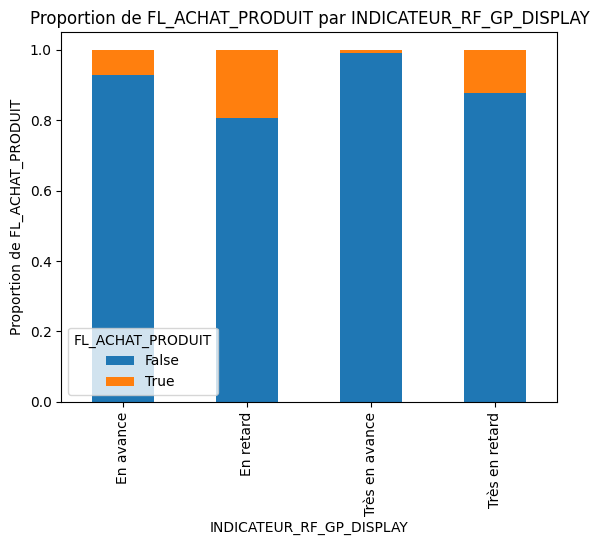


FL_ACHAT_PRODUIT          False  True 
INDICATEUR_RF_GP_DISPLAY              
En avance                  6677    523
En retard                  4086    982
Très en avance            35280    368
Très en retard            18051   2514

Test du Khi-Deux - Chi2 stat: 4308.9692, p-value: 0.0000, df: 3 → Test significatif à 5%
T de Tschuprow : 0.2508
     Relation modérée



------------------------------------------------------------------------------------------
Analyse de la variable 'INDICATEUR_RF_GP_SUPPLEMENT_PUB_CO'



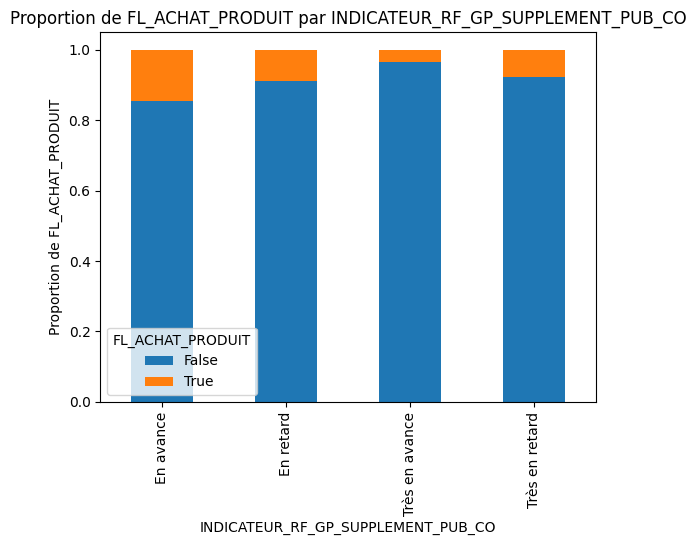


FL_ACHAT_PRODUIT                    False  True 
INDICATEUR_RF_GP_SUPPLEMENT_PUB_CO              
En avance                            8317   1410
En retard                            3099    298
Très en avance                      37426   1379
Très en retard                      15252   1300

Test du Khi-Deux - Chi2 stat: 1677.8695, p-value: 0.0000, df: 3 → Test significatif à 5%
T de Tschuprow : 0.1565
     Relation modérée



------------------------------------------------------------------------------------------
Analyse de la variable 'INDICATEUR_RF_GP_PROG_BU'



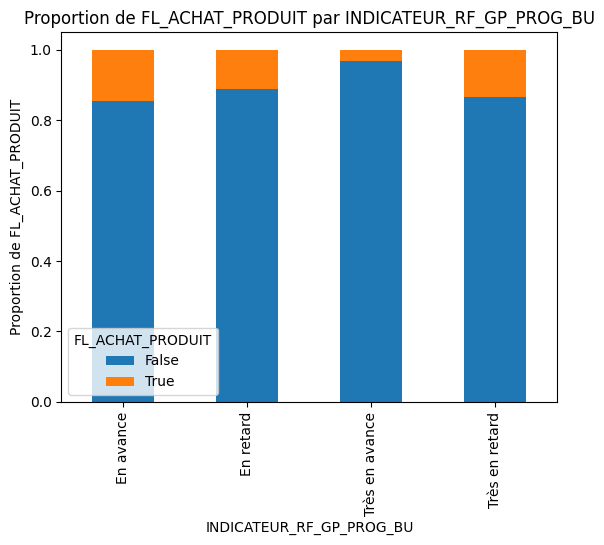


FL_ACHAT_PRODUIT          False  True 
INDICATEUR_RF_GP_PROG_BU              
En avance                 10514   1795
En retard                  1742    216
Très en avance            46512   1557
Très en retard             5326    819

Test du Khi-Deux - Chi2 stat: 2737.6025, p-value: 0.0000, df: 3 → Test significatif à 5%
T de Tschuprow : 0.1999
     Relation modérée



------------------------------------------------------------------------------------------
Analyse de la variable 'INDICATEUR_RF_GP_REF_PAYANT'



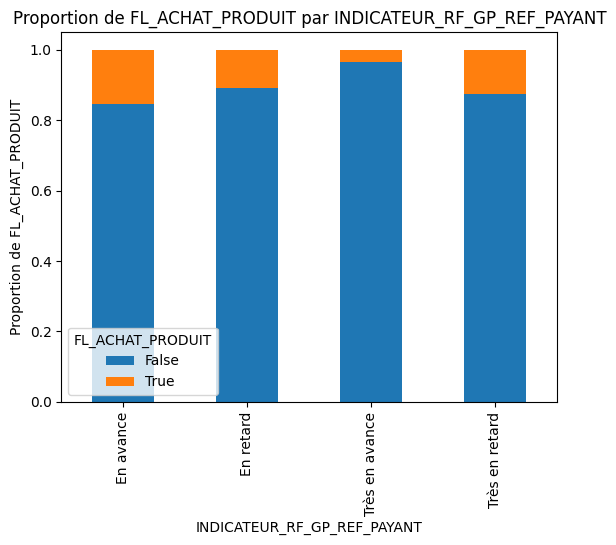


FL_ACHAT_PRODUIT             False  True 
INDICATEUR_RF_GP_REF_PAYANT              
En avance                    12647   2324
En retard                      340     41
Très en avance               49650   1810
Très en retard                1457    212

Test du Khi-Deux - Chi2 stat: 2914.1933, p-value: 0.0000, df: 3 → Test significatif à 5%
T de Tschuprow : 0.2063
     Relation modérée



------------------------------------------------------------------------------------------
Analyse de la variable 'INDICATEUR_RF_GP_EMAILING'



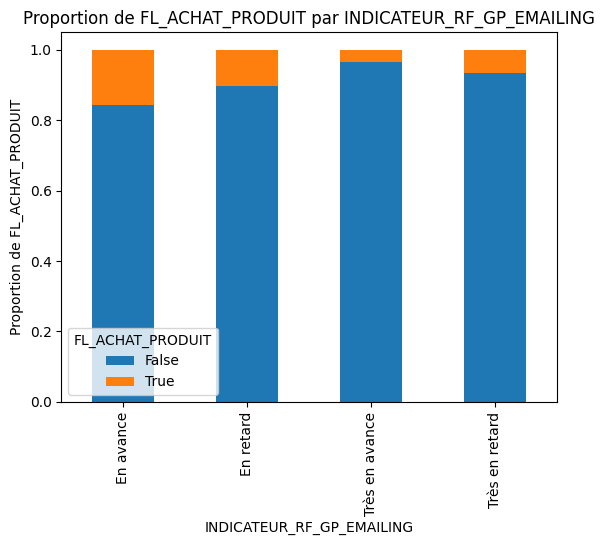


FL_ACHAT_PRODUIT           False  True 
INDICATEUR_RF_GP_EMAILING              
En avance                  13087   2448
En retard                    132     15
Très en avance             50081   1867
Très en retard               794     57

Test du Khi-Deux - Chi2 stat: 2954.8337, p-value: 0.0000, df: 3 → Test significatif à 5%
T de Tschuprow : 0.2077
     Relation modérée



------------------------------------------------------------------------------------------
Analyse de la variable 'INDICATEUR_RF_GP_AD4'



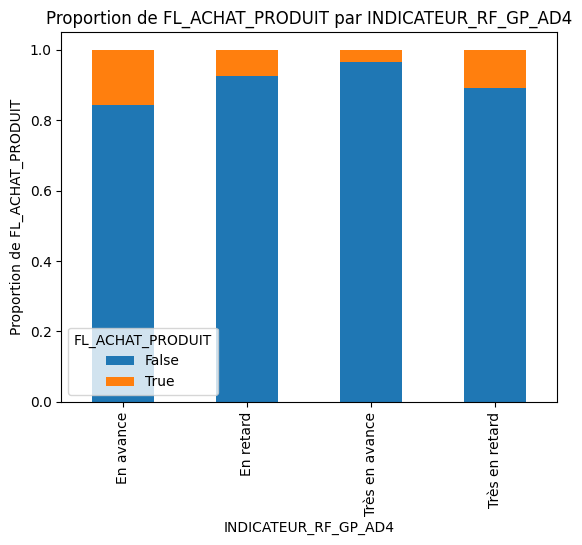


FL_ACHAT_PRODUIT      False  True 
INDICATEUR_RF_GP_AD4              
En avance             12235   2274
En retard              1100     89
Très en avance        48962   1802
Très en retard         1797    222

Test du Khi-Deux - Chi2 stat: 2842.0930, p-value: 0.0000, df: 3 → Test significatif à 5%
T de Tschuprow : 0.2037
     Relation modérée



------------------------------------------------------------------------------------------
Analyse de la variable 'INDICATEUR_RF_GP_SOCIAL'



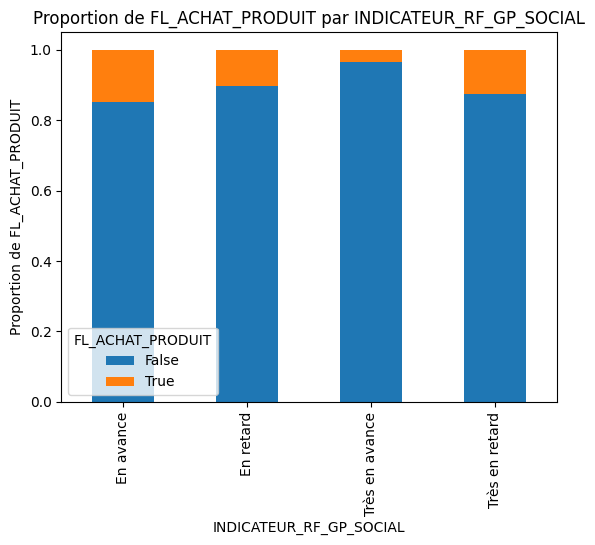


FL_ACHAT_PRODUIT         False  True 
INDICATEUR_RF_GP_SOCIAL              
En avance                11603   2028
En retard                  787     90
Très en avance           48180   1757
Très en retard            3524    512

Test du Khi-Deux - Chi2 stat: 2613.3615, p-value: 0.0000, df: 3 → Test significatif à 5%
T de Tschuprow : 0.1954
     Relation modérée



------------------------------------------------------------------------------------------
Analyse de la variable 'INDICATEUR_RF_GP_CM'



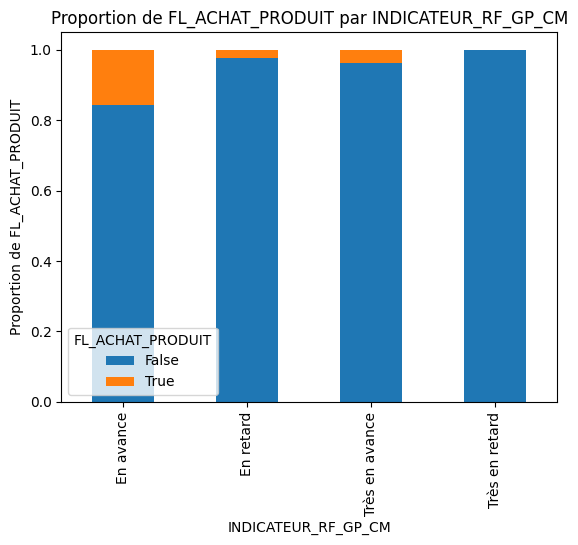


FL_ACHAT_PRODUIT     False  True 
INDICATEUR_RF_GP_CM              
En avance            13335   2506
En retard              123      3
Très en avance       47839   1875
Très en retard        2797      3

Test du Khi-Deux - Chi2 stat: 3105.4479, p-value: 0.0000, df: 3 → Test significatif à 5%
T de Tschuprow : 0.2129
     Relation modérée



------------------------------------------------------------------------------------------
Analyse de la variable 'CD_DEPARTEMENT'



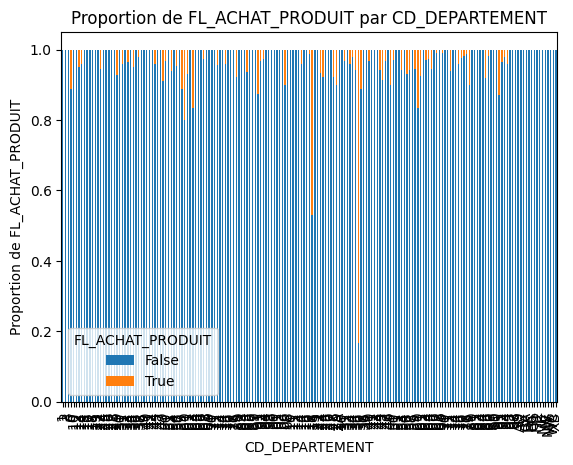


FL_ACHAT_PRODUIT  False  True 
CD_DEPARTEMENT                
1                     2      0
2                     6      0
3                     1      0
6                     8      1
10                    1      0
...                 ...    ...
N/                    3      0
NW                    7      0
W6                    7      0
WC                    8      0
XB                    4      0

[183 rows x 2 columns]

Test exact de Fisher - Stat: 0.0000, p-value: 0.0001 → Test significatif à 5%
Variables non valides pour le calcul de V de Cramer ou T de Tschuprow



------------------------------------------------------------------------------------------
Analyse de la variable 'REGION'



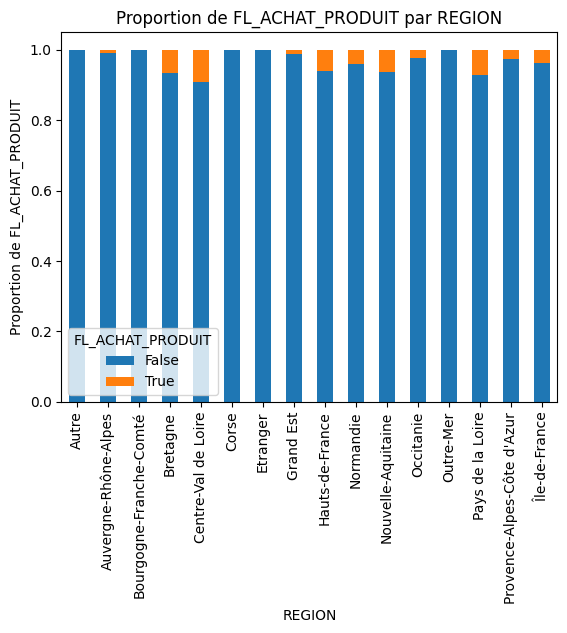


FL_ACHAT_PRODUIT            False  True 
REGION                                  
Autre                          97      0
Auvergne-Rhône-Alpes          403      4
Bourgogne-Franche-Comté       111      0
Bretagne                    25026   1775
Centre-Val de Loire           453     45
Corse                           7      0
Etranger                       18      0
Grand Est                     269      3
Hauts-de-France               337     22
Normandie                    5942    247
Nouvelle-Aquitaine           1262     86
Occitanie                     387      9
Outre-Mer                      20      0
Pays de la Loire            26884   2084
Provence-Alpes-Côte d'Azur    157      4
Île-de-France                2721    108

Test du Khi-Deux - Chi2 stat: 195.1750, p-value: 0.0000, df: 15 → Test significatif à 5%
T de Tschuprow : 0.0534
     Relation faible



------------------------------------------------------------------------------------------
Analyse de la variable 'SAISON'


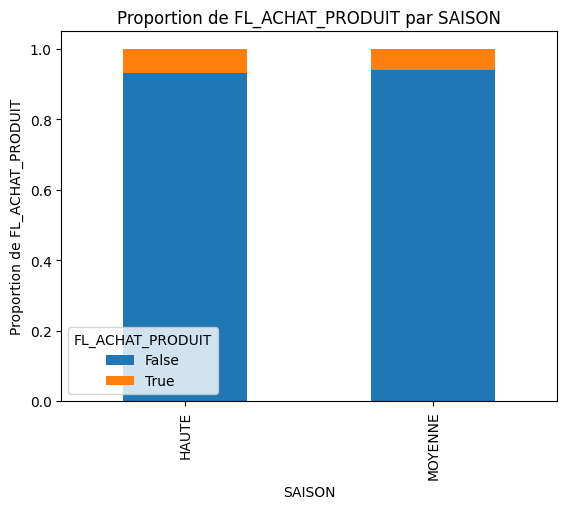


FL_ACHAT_PRODUIT  False  True 
SAISON                        
HAUTE             25339   1879
MOYENNE           38755   2508

Test exact de Fisher - Stat: 0.8727, p-value: 0.0000 → Test significatif à 5%
Variables non valides pour le calcul de V de Cramer ou T de Tschuprow





In [ ]:
# columns_to_exclude = ['ID_COMPTE', '_ID_', '_DATE_ETUDE_'] + [col for col in dt.columns if col.startswith('DT_')]

# columns_quali = dt.drop(columns_to_exclude, axis=1).select_dtypes(include=['category', 'object']).columns
# resultats = {}

# for column in columns_quali:
#     df = dt.copy()
#     print('---'*30)
#     print(f"Analyse de la variable '{column}'")
#     print()
    
#     # Supprimer les lignes avec des NaN dans la colonne
#     df = df.dropna(subset=[column]) # Mais on est pas sensé avoir de NaN
    
#     # Vérification des effectifs
#     nb_modalites = df[column].nunique()
#     nb_modalite_valide = (df[column].value_counts() >= 5).sum()
#     eff_modalites = bool(nb_modalite_valide/nb_modalites >= 0.8)
    
#     # Etude bivariée
#     contingency_table = pd.crosstab(df[column], df['FL_ACHAT_PRODUIT'])
#     ## Diagramme en bâtons
#     contingency_table_percentage = contingency_table.div(contingency_table.sum(axis=1), axis=0)
#     contingency_table_percentage.plot(kind='bar', stacked=True)
#     plt.title(f'Proportion de FL_ACHAT_PRODUIT par {column}')
#     plt.xlabel(f'{column}')
#     plt.ylabel('Proportion de FL_ACHAT_PRODUIT')
#     plt.show()
#     print()
    
#     ## Tableau croisé
#     print(contingency_table)
#     print()

#     if nb_modalites == 2 or eff_modalites == False:
#         ## Test exact de Fisher
#         oddsratio, fisher_p = stats.fisher_exact(contingency_table)
#         significatif_fisher = "significatif" if fisher_p < 0.05 else "non significatif"
#         print(f'Test exact de Fisher - Stat: {oddsratio:.4f}, p-value: {fisher_p:.4f} → Test {significatif_fisher} à 5%')
#     else:
#         ## Test du Khi-Deux
#         chi2_stat, chi2_p, dof, ex = stats.chi2_contingency(contingency_table)
#         significatif_chi2 = "significatif" if chi2_p < 0.05 else "non significatif"
#         print(f'Test du Khi-Deux - Chi2 stat: {chi2_stat:.4f}, p-value: {chi2_p:.4f}, df: {dof} → Test {significatif_chi2} à 5%')
    
#     cramers_v_stat, tschuprow_t = calcul_cramersV_tschuprowT(contingency_table, contingency_table)
#     if nb_modalites == 2 and eff_modalites == False:
#         ## V de Cramer
#         print(f"V de Cramer : {cramers_v_stat:.4f}")
#         if cramers_v_stat < 0.1: print("     Relation faible")
#         elif 0.1 <= cramers_v_stat < 0.3: print("     Relation modérée")
#         else: print("     Relation forte")
#         metric = cramers_v_stat
#     elif nb_modalites > 2 and eff_modalites == True:
#         ## T de Tschuprow
#         print(f"T de Tschuprow : {tschuprow_t:.4f}")
#         if tschuprow_t < 0.1: print("     Relation faible")
#         elif 0.1 <= tschuprow_t < 0.3: print("     Relation modérée")
#         else: print("     Relation forte")
#         metric = tschuprow_t
#     else:
#         print("Variables non valides pour le calcul de V de Cramer ou T de Tschuprow")
#         metric = None


#     # Sauvergarde des résultats
#     resultats[column] = {'stat': metric}
#     print('\n\n')

------------------------------------------------------------------------------------------
Analyse de la variable 'ACHAT_PRODUIT'



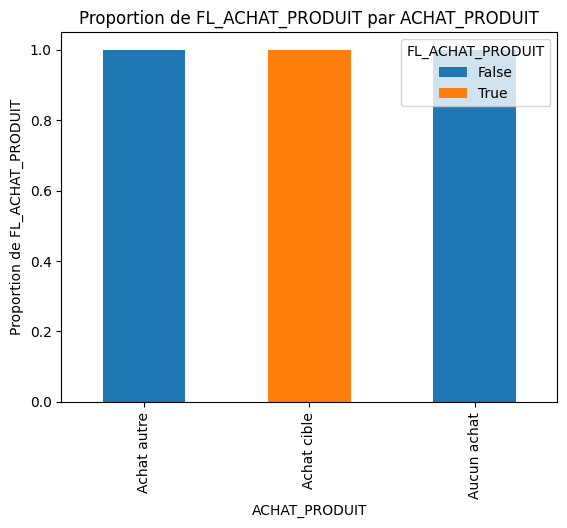


FL_ACHAT_PRODUIT  False  True 
ACHAT_PRODUIT                 
Achat autre         1.0    0.0
Achat cible         0.0    1.0
Aucun achat         1.0    0.0

Test du Khi-Deux - Chi2 stat: 3.0000, p-value: 0.2231, df: 2 → Test non significatif à 5%
T de Tschuprow : 1.0000
     Relation forte



------------------------------------------------------------------------------------------
Analyse de la variable 'LIB_DAF3'



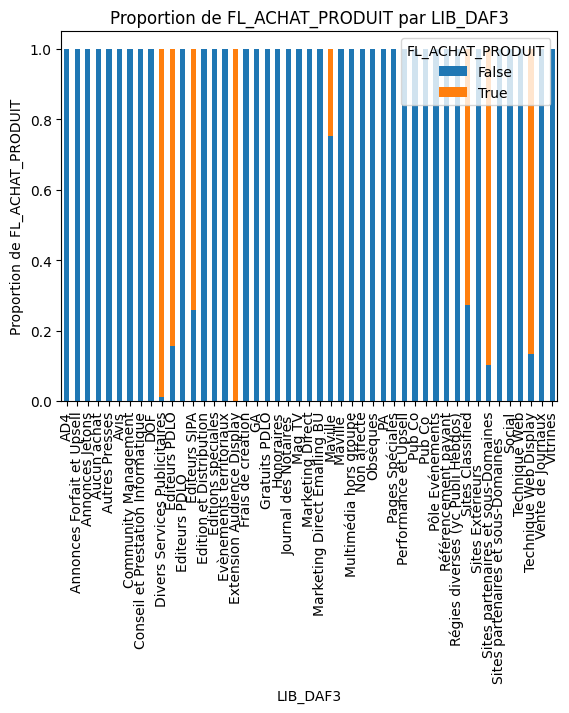


FL_ACHAT_PRODUIT                             False     True 
LIB_DAF3                                                    
AD4                                       1.000000  0.000000
Annonces Forfait et Upsell                1.000000  0.000000
Annonces Jetons                           1.000000  0.000000
Aucun achat                               1.000000  0.000000
Autres Presses                            1.000000  0.000000
Avis                                      1.000000  0.000000
Community Management                      1.000000  0.000000
Conseil et Prestation Informatique        1.000000  0.000000
DOF                                       1.000000  0.000000
Divers Services Publicitaires             0.010711  0.989289
Editeurs PDLO                             0.157588  0.842412
Editeurs PDLO                             1.000000  0.000000
Editeurs SIPA                             0.259259  0.740741
Edition et Distribution                   1.000000  0.000000
Editions spéciales     

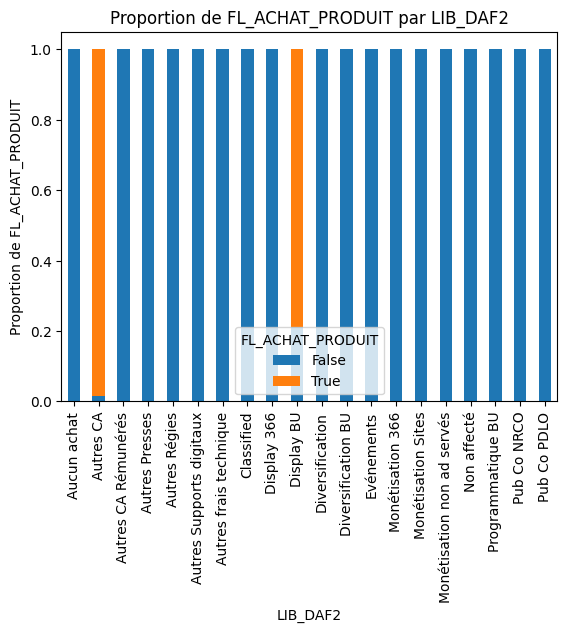


FL_ACHAT_PRODUIT               False     True 
LIB_DAF2                                      
Aucun achat                 1.000000  0.000000
Autres CA                   0.014932  0.985068
Autres CA Rémunérés         1.000000  0.000000
Autres Presses              1.000000  0.000000
Autres Régies               1.000000  0.000000
Autres Supports digitaux    1.000000  0.000000
Autres frais technique      1.000000  0.000000
Classified                  1.000000  0.000000
Display 366                 1.000000  0.000000
Display BU                  0.212225  0.787775
Diversification             1.000000  0.000000
Diversification BU          1.000000  0.000000
Evénements                  1.000000  0.000000
Monétisation 366            1.000000  0.000000
Monétisation Sites          1.000000  0.000000
Monétisation non ad servés  1.000000  0.000000
Non affecté                 1.000000  0.000000
Programmatique BU           1.000000  0.000000
Pub Co NRCO                 1.000000  0.000000
Pub Co PDLO 

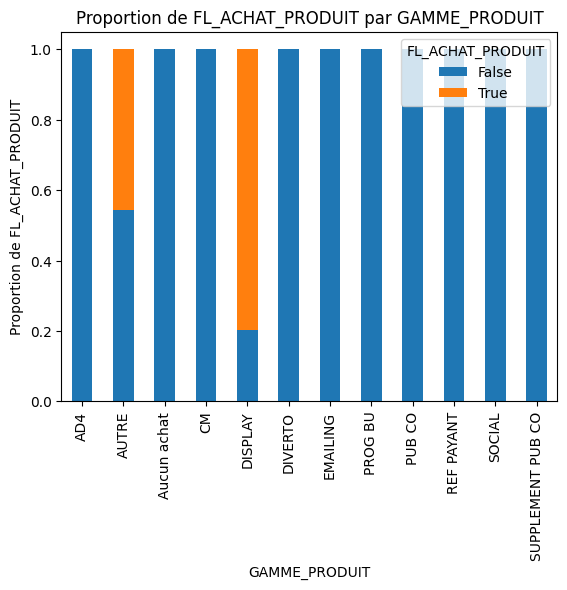


FL_ACHAT_PRODUIT      False     True 
GAMME_PRODUIT                        
AD4                1.000000  0.000000
AUTRE              0.543676  0.456324
Aucun achat        1.000000  0.000000
CM                 1.000000  0.000000
DISPLAY            0.202537  0.797463
DIVERTO            1.000000  0.000000
EMAILING           1.000000  0.000000
PROG BU            1.000000  0.000000
PUB CO             1.000000  0.000000
REF PAYANT         1.000000  0.000000
SOCIAL             1.000000  0.000000
SUPPLEMENT PUB CO  1.000000  0.000000

Test du Khi-Deux - Chi2 stat: 7.6222, p-value: 0.7467, df: 11 → Test non significatif à 5%
T de Tschuprow : 0.7692
     Relation forte



------------------------------------------------------------------------------------------
Analyse de la variable 'INDICATEUR_RF_GP_AUTRE'



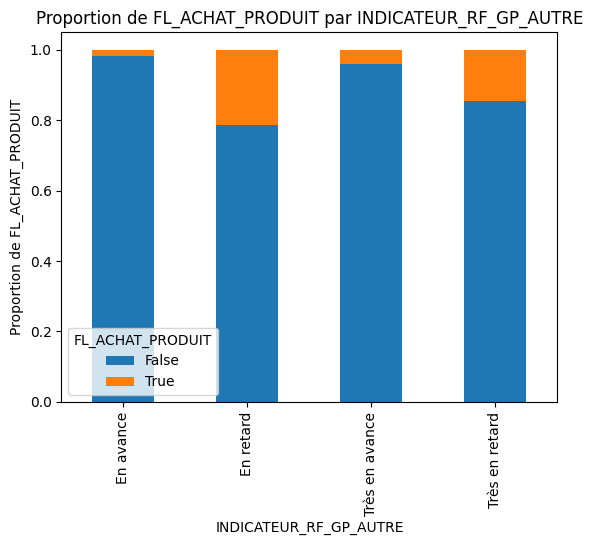


FL_ACHAT_PRODUIT           False     True 
INDICATEUR_RF_GP_AUTRE                    
En avance               0.983471  0.016529
En retard               0.785537  0.214463
Très en avance          0.960325  0.039675
Très en retard          0.854035  0.145965

Test du Khi-Deux - Chi2 stat: 0.2760, p-value: 0.9645, df: 3 → Test non significatif à 5%
T de Tschuprow : 0.2605
     Relation modérée



------------------------------------------------------------------------------------------
Analyse de la variable 'INDICATEUR_RF_GP_DISPLAY'



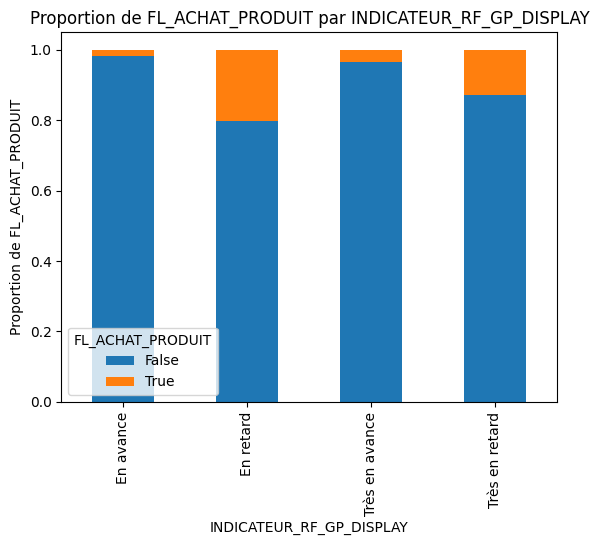


FL_ACHAT_PRODUIT             False     True 
INDICATEUR_RF_GP_DISPLAY                    
En avance                 0.983342  0.016658
En retard                 0.797061  0.202939
Très en avance            0.965289  0.034711
Très en retard            0.870208  0.129792

Test du Khi-Deux - Chi2 stat: 0.2607, p-value: 0.9672, df: 3 → Test non significatif à 5%
T de Tschuprow : 0.2407
     Relation modérée



------------------------------------------------------------------------------------------
Analyse de la variable 'DETAIL_TYPE_SUPPORT'



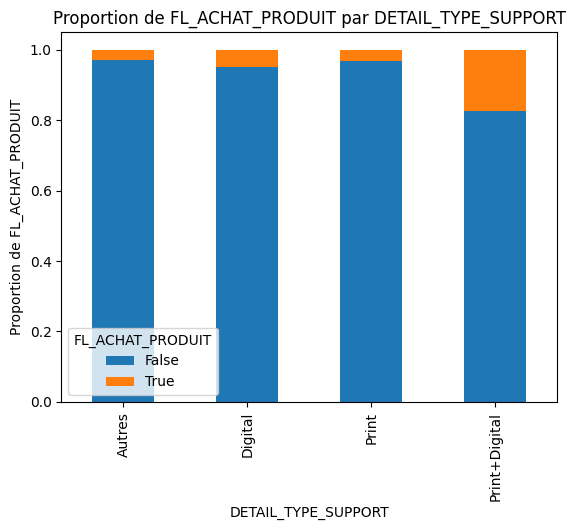


FL_ACHAT_PRODUIT        False     True 
DETAIL_TYPE_SUPPORT                    
Autres               0.970297  0.029703
Digital              0.951054  0.048946
Print                0.968930  0.031070
Print+Digital        0.826828  0.173172

Test du Khi-Deux - Chi2 stat: 0.2164, p-value: 0.9749, df: 3 → Test non significatif à 5%
T de Tschuprow : 0.2276
     Relation modérée



------------------------------------------------------------------------------------------
Analyse de la variable 'STATUT_BENEFICIAIRE'



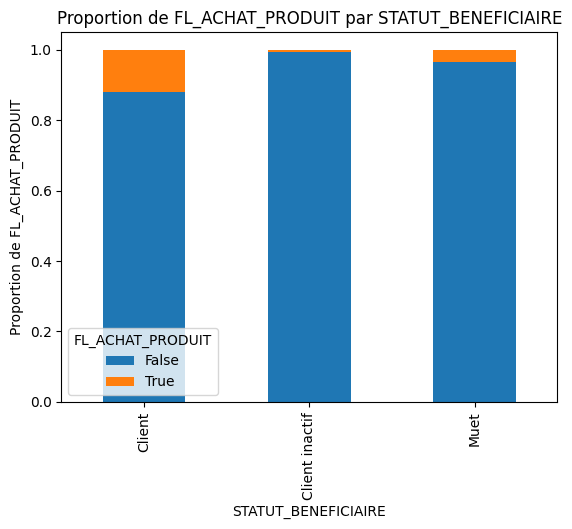


FL_ACHAT_PRODUIT        False     True 
STATUT_BENEFICIAIRE                    
Client               0.880200  0.119800
Client inactif       0.993397  0.006603
Muet                 0.964689  0.035311

Test du Khi-Deux - Chi2 stat: 0.1358, p-value: 0.9344, df: 2 → Test non significatif à 5%
T de Tschuprow : 0.2190
     Relation modérée



------------------------------------------------------------------------------------------
Analyse de la variable 'CLASSE_PMG_N'



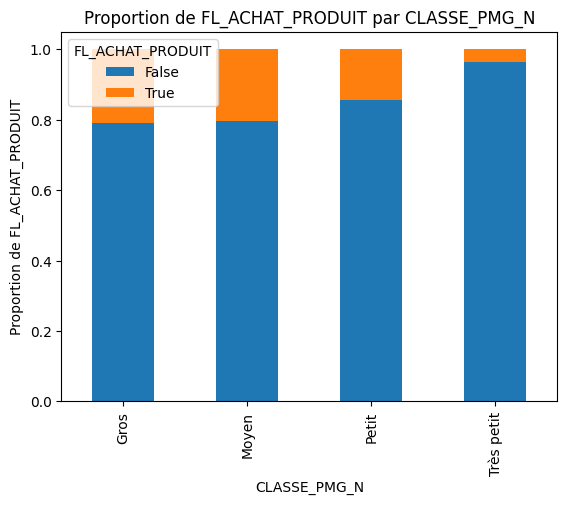


FL_ACHAT_PRODUIT     False     True 
CLASSE_PMG_N                        
Gros              0.792434  0.207566
Moyen             0.798107  0.201893
Petit             0.855143  0.144857
Très petit        0.964281  0.035719

Test du Khi-Deux - Chi2 stat: 0.1516, p-value: 0.9850, df: 3 → Test non significatif à 5%
T de Tschuprow : 0.2159
     Relation modérée



------------------------------------------------------------------------------------------
Analyse de la variable 'TYPE_PRODUIT_OPPORTUNITE'



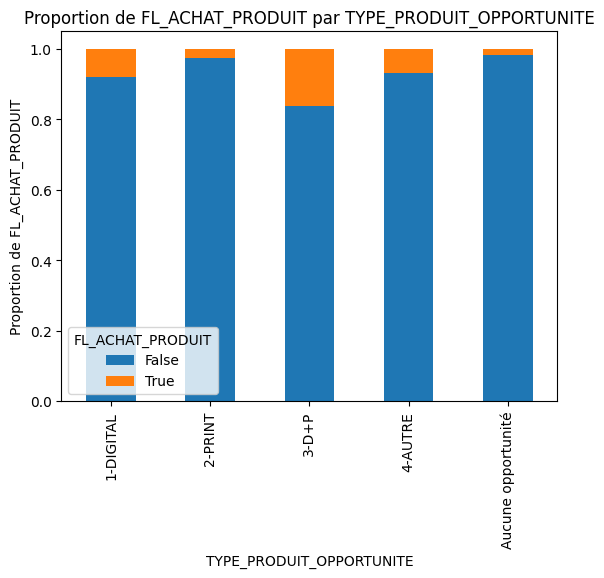


FL_ACHAT_PRODUIT             False     True 
TYPE_PRODUIT_OPPORTUNITE                    
1-DIGITAL                 0.921613  0.078387
2-PRINT                   0.973745  0.026255
3-D+P                     0.838953  0.161047
4-AUTRE                   0.930962  0.069038
Aucune opportunité        0.982071  0.017929

Test du Khi-Deux - Chi2 stat: 0.1981, p-value: 0.9954, df: 4 → Test non significatif à 5%
T de Tschuprow : 0.2157
     Relation modérée



------------------------------------------------------------------------------------------
Analyse de la variable 'INDICATEUR_RF_GP_CM'



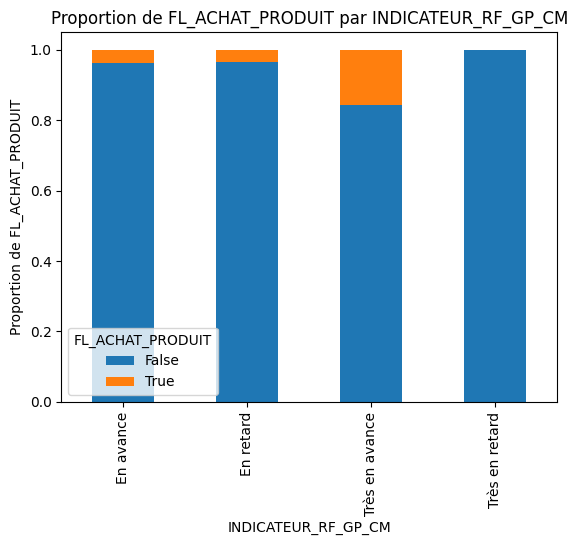


FL_ACHAT_PRODUIT        False     True 
INDICATEUR_RF_GP_CM                    
En avance            0.962224  0.037776
En retard            0.963855  0.036145
Très en avance       0.841748  0.158252
Très en retard       0.998605  0.001395

Test du Khi-Deux - Chi2 stat: 0.2572, p-value: 0.9679, df: 3 → Test non significatif à 5%
T de Tschuprow : 0.2128
     Relation modérée



------------------------------------------------------------------------------------------
Analyse de la variable 'SOUS_SEGMENT'



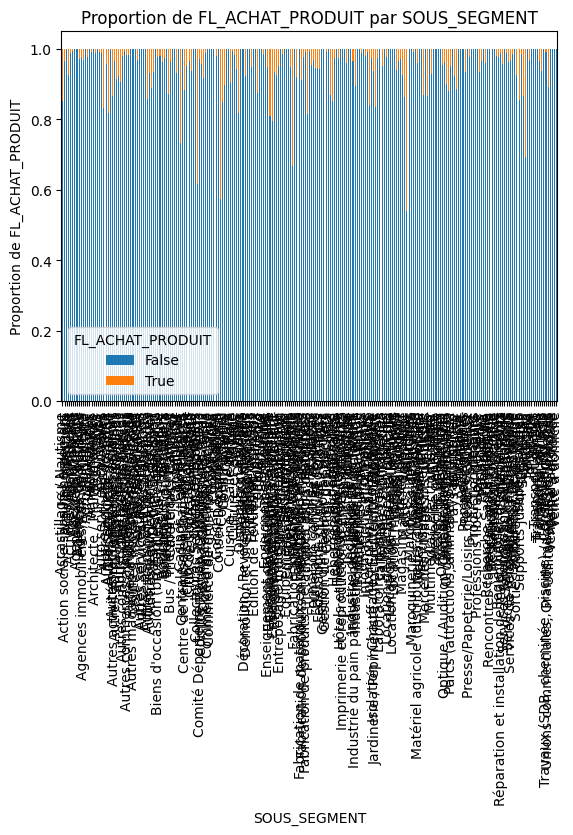


FL_ACHAT_PRODUIT                                     False     True 
SOUS_SEGMENT                                                        
Accastillage / Nautisme                           0.850877  0.149123
Action sociale sans hébergement                   0.966292  0.033708
Activité forestière                               1.000000  0.000000
Activité maritime                                 0.925000  0.075000
Activités hospitalières                           0.989691  0.010309
...                                                    ...       ...
Unions commerciales, Grands magasins et Galeries  0.891975  0.108025
Utilitaires et poids lourds                       1.000000  0.000000
Vente par automate                                1.000000  0.000000
Vente à distance                                  1.000000  0.000000
Vente à domicile                                  1.000000  0.000000

[239 rows x 2 columns]

Test du Khi-Deux - Chi2 stat: 28.9988, p-value: 1.0000, df: 238 → Test non si

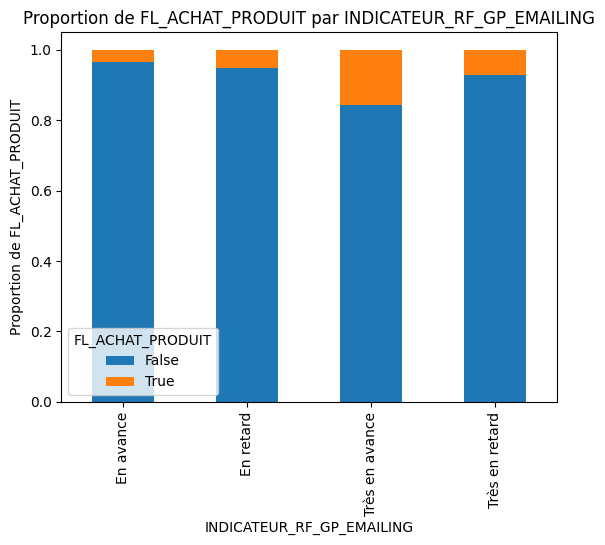


FL_ACHAT_PRODUIT              False     True 
INDICATEUR_RF_GP_EMAILING                    
En avance                  0.963982  0.036018
En retard                  0.948276  0.051724
Très en avance             0.842421  0.157579
Très en retard             0.929250  0.070750

Test du Khi-Deux - Chi2 stat: 0.1214, p-value: 0.9892, df: 3 → Test non significatif à 5%
T de Tschuprow : 0.2074
     Relation modérée



------------------------------------------------------------------------------------------
Analyse de la variable 'INDICATEUR_RF_GP_REF_PAYANT'



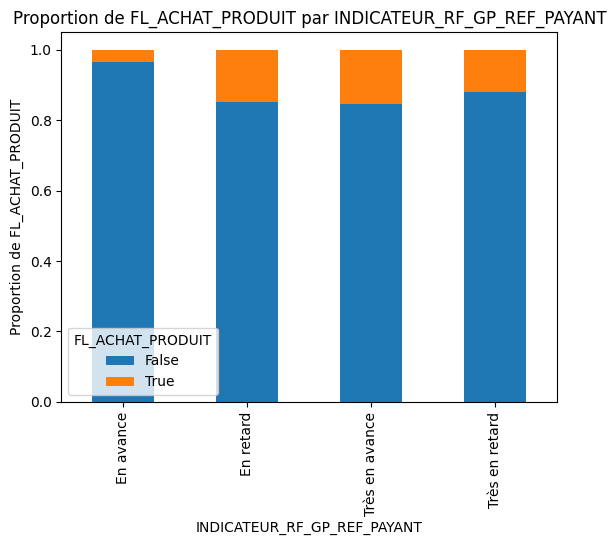


FL_ACHAT_PRODUIT                False     True 
INDICATEUR_RF_GP_REF_PAYANT                    
En avance                    0.964704  0.035296
En retard                    0.850679  0.149321
Très en avance               0.844651  0.155349
Très en retard               0.879467  0.120533

Test du Khi-Deux - Chi2 stat: 0.0902, p-value: 0.9930, df: 3 → Test non significatif à 5%
T de Tschuprow : 0.2059
     Relation modérée



------------------------------------------------------------------------------------------
Analyse de la variable 'INDICATEUR_RF_GP_AD4'



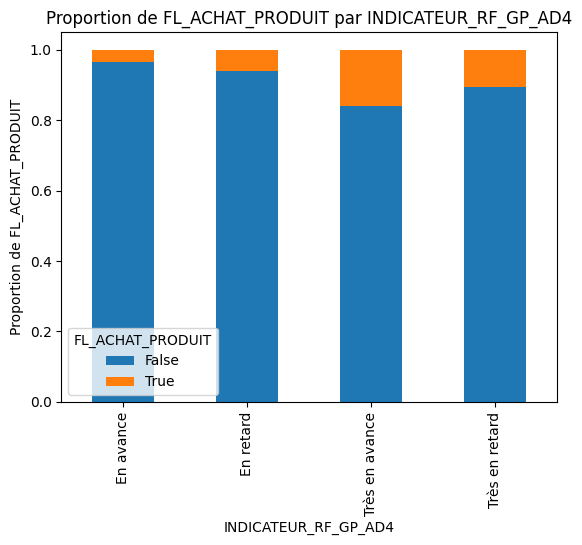


FL_ACHAT_PRODUIT         False     True 
INDICATEUR_RF_GP_AD4                    
En avance             0.964103  0.035897
En retard             0.940204  0.059796
Très en avance        0.840728  0.159272
Très en retard        0.895349  0.104651

Test du Khi-Deux - Chi2 stat: 0.1082, p-value: 0.9908, df: 3 → Test non significatif à 5%
T de Tschuprow : 0.2047
     Relation modérée



------------------------------------------------------------------------------------------
Analyse de la variable 'INDICATEUR_RF_GP_PROG_BU'



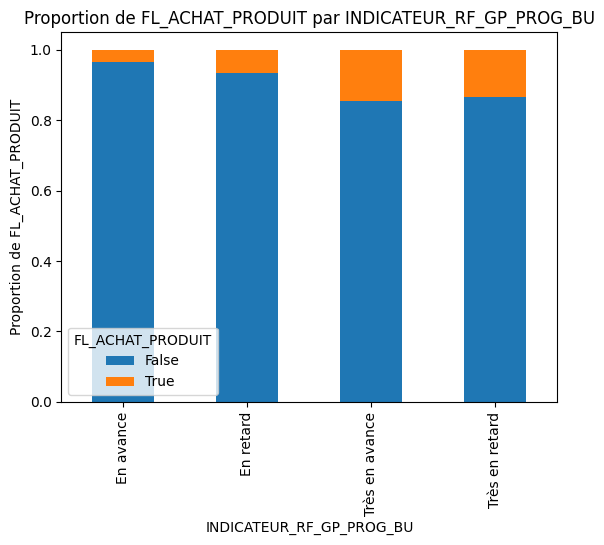


FL_ACHAT_PRODUIT             False     True 
INDICATEUR_RF_GP_PROG_BU                    
En avance                 0.966085  0.033915
En retard                 0.933218  0.066782
Très en avance            0.853170  0.146830
Très en retard            0.865930  0.134070

Test du Khi-Deux - Chi2 stat: 0.1013, p-value: 0.9917, df: 3 → Test non significatif à 5%
T de Tschuprow : 0.1966
     Relation modérée



------------------------------------------------------------------------------------------
Analyse de la variable 'INDICATEUR_MONTANT'



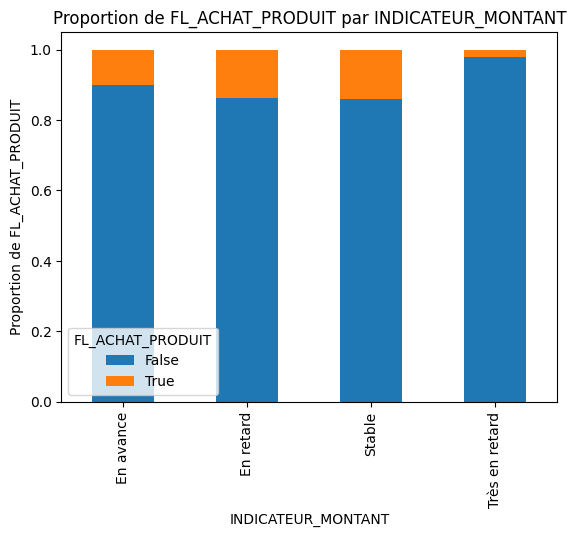


FL_ACHAT_PRODUIT       False     True 
INDICATEUR_MONTANT                    
En avance           0.898558  0.101442
En retard           0.861803  0.138197
Stable              0.860354  0.139646
Très en retard      0.979923  0.020077

Test du Khi-Deux - Chi2 stat: 0.1048, p-value: 0.9913, df: 3 → Test non significatif à 5%
T de Tschuprow : 0.1946
     Relation modérée



------------------------------------------------------------------------------------------
Analyse de la variable 'INDICATEUR_RF_GP_SOCIAL'



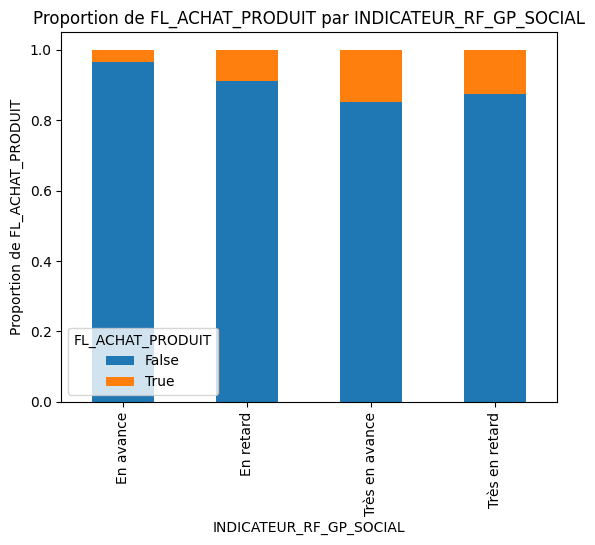


FL_ACHAT_PRODUIT            False     True 
INDICATEUR_RF_GP_SOCIAL                    
En avance                0.964372  0.035628
En retard                0.909962  0.090038
Très en avance           0.850721  0.149279
Très en retard           0.874581  0.125419

Test du Khi-Deux - Chi2 stat: 0.0812, p-value: 0.9940, df: 3 → Test non significatif à 5%
T de Tschuprow : 0.1940
     Relation modérée



------------------------------------------------------------------------------------------
Analyse de la variable 'CLASSE_PMG_N1'



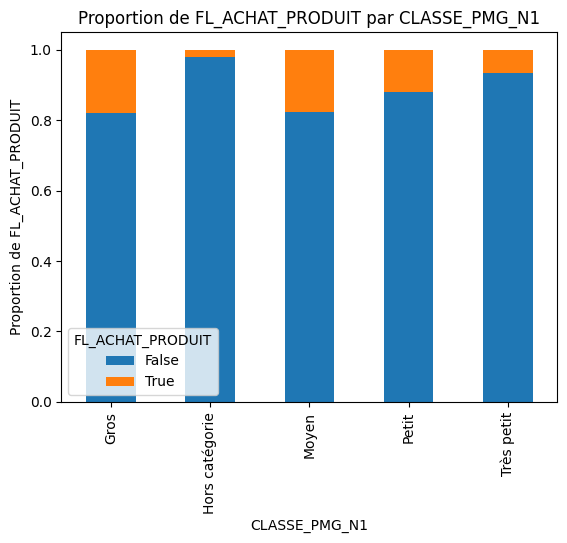


FL_ACHAT_PRODUIT     False     True 
CLASSE_PMG_N1                       
Gros              0.821565  0.178435
Hors catégorie    0.980512  0.019488
Moyen             0.822180  0.177820
Petit             0.879595  0.120405
Très petit        0.935219  0.064781

Test du Khi-Deux - Chi2 stat: 0.1968, p-value: 0.9955, df: 4 → Test non significatif à 5%
T de Tschuprow : 0.1874
     Relation modérée



------------------------------------------------------------------------------------------
Analyse de la variable 'STATUT_DETAIL_PERE'



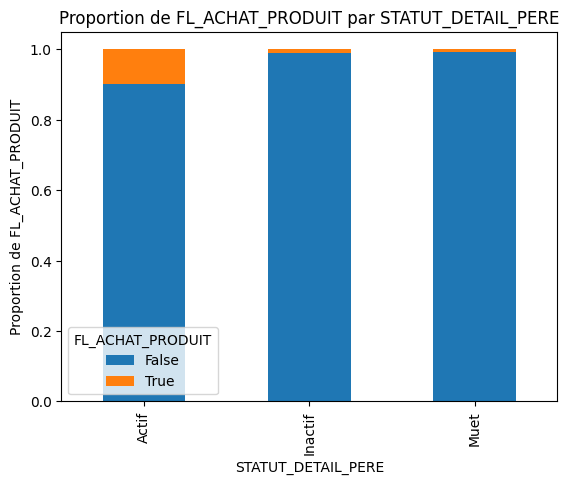


FL_ACHAT_PRODUIT       False     True 
STATUT_DETAIL_PERE                    
Actif               0.900533  0.099467
Inactif             0.990734  0.009266
Muet                0.993835  0.006165

Test du Khi-Deux - Chi2 stat: 0.1525, p-value: 0.9266, df: 2 → Test non significatif à 5%
T de Tschuprow : 0.1847
     Relation modérée



------------------------------------------------------------------------------------------
Analyse de la variable 'INDICATEUR_RFM'



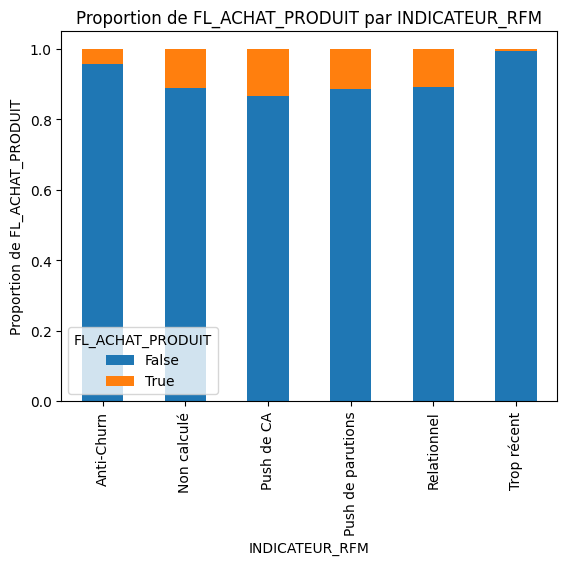


FL_ACHAT_PRODUIT      False     True 
INDICATEUR_RFM                       
Anti-Churn         0.957924  0.042076
Non calculé        0.890244  0.109756
Push de CA         0.866744  0.133256
Push de parutions  0.885474  0.114526
Relationnel        0.891457  0.108543
Trop récent        0.995324  0.004676

Test du Khi-Deux - Chi2 stat: 0.1620, p-value: 0.9995, df: 5 → Test non significatif à 5%
T de Tschuprow : 0.1842
     Relation modérée



------------------------------------------------------------------------------------------
Analyse de la variable 'INDICATEUR_RF_GP_DIVERTO'



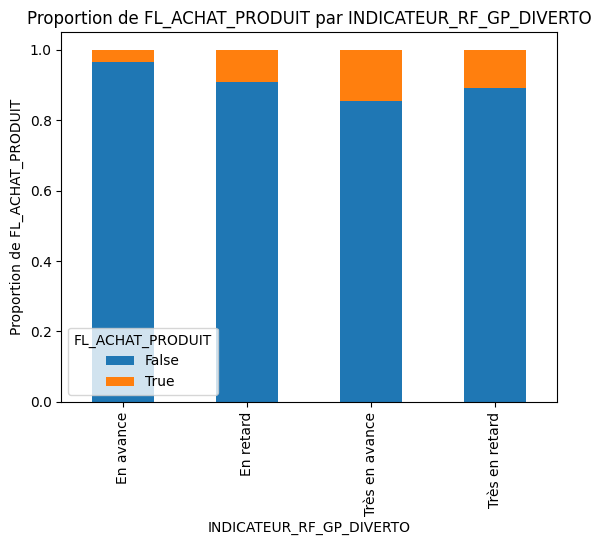


FL_ACHAT_PRODUIT             False     True 
INDICATEUR_RF_GP_DIVERTO                    
En avance                 0.965048  0.034952
En retard                 0.909454  0.090546
Très en avance            0.855396  0.144604
Très en retard            0.892483  0.107517

Test du Khi-Deux - Chi2 stat: 0.0730, p-value: 0.9949, df: 3 → Test non significatif à 5%
T de Tschuprow : 0.1797
     Relation modérée



------------------------------------------------------------------------------------------
Analyse de la variable 'INDICATEUR_RF_GP_SUPPLEMENT_PUB_CO'



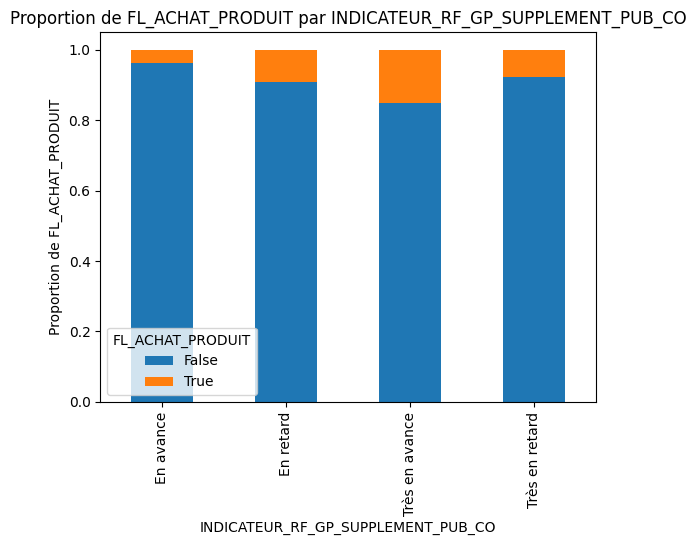


FL_ACHAT_PRODUIT                       False     True 
INDICATEUR_RF_GP_SUPPLEMENT_PUB_CO                    
En avance                           0.963354  0.036646
En retard                           0.907574  0.092426
Très en avance                      0.849983  0.150017
Très en retard                      0.922111  0.077889

Test du Khi-Deux - Chi2 stat: 0.0812, p-value: 0.9940, df: 3 → Test non significatif à 5%
T de Tschuprow : 0.1565
     Relation modérée



------------------------------------------------------------------------------------------
Analyse de la variable 'INDICATEUR_RF'



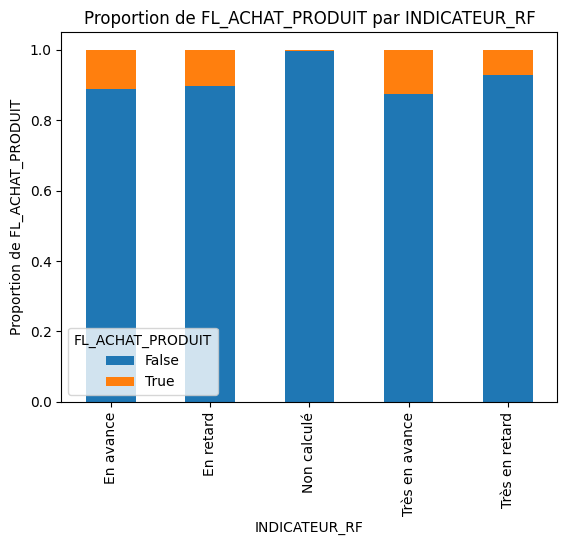


FL_ACHAT_PRODUIT     False     True 
INDICATEUR_RF                       
En avance         0.889666  0.110334
En retard         0.896452  0.103548
Non calculé       0.995324  0.004676
Très en avance    0.873563  0.126437
Très en retard    0.928159  0.071841

Test du Khi-Deux - Chi2 stat: 0.1219, p-value: 0.9982, df: 4 → Test non significatif à 5%
T de Tschuprow : 0.1424
     Relation modérée



------------------------------------------------------------------------------------------
Analyse de la variable 'SOURCE_CREATION'



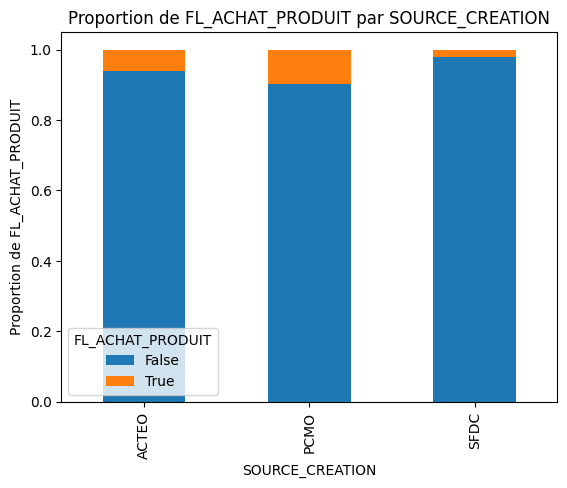


FL_ACHAT_PRODUIT     False     True 
SOURCE_CREATION                     
ACTEO             0.938564  0.061436
PCMO              0.901973  0.098027
SFDC              0.979750  0.020250

Test du Khi-Deux - Chi2 stat: 0.0538, p-value: 0.9735, df: 2 → Test non significatif à 5%
T de Tschuprow : 0.1370
     Relation modérée



------------------------------------------------------------------------------------------
Analyse de la variable 'DELAI_PAIEMENT'



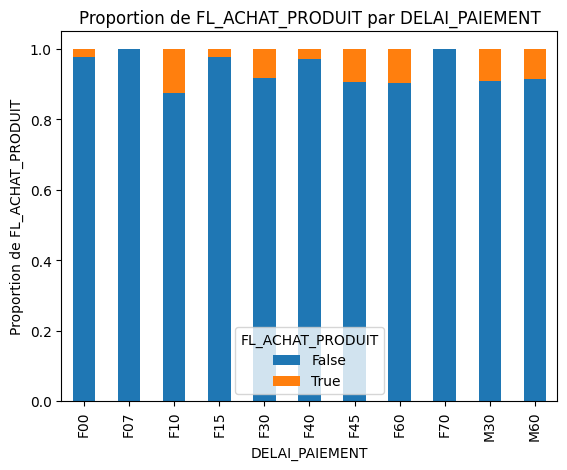


FL_ACHAT_PRODUIT     False     True 
DELAI_PAIEMENT                      
F00               0.978335  0.021665
F07               1.000000  0.000000
F10               0.875969  0.124031
F15               0.977525  0.022475
F30               0.917021  0.082979
F40               0.972973  0.027027
F45               0.906204  0.093796
F60               0.902778  0.097222
F70               1.000000  0.000000
M30               0.910526  0.089474
M60               0.915493  0.084507

Test du Khi-Deux - Chi2 stat: 0.3590, p-value: 1.0000, df: 10 → Test non significatif à 5%
T de Tschuprow : 0.1201
     Relation modérée



------------------------------------------------------------------------------------------
Analyse de la variable 'SEGMENT'



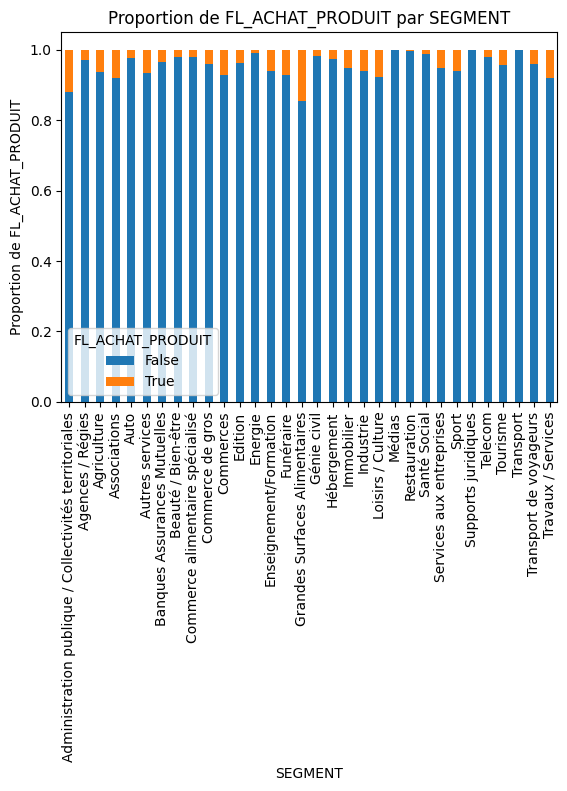


FL_ACHAT_PRODUIT                                       False     True 
SEGMENT                                                               
Administration publique / Collectivités territo...  0.881316  0.118684
Agences / Régies                                    0.971049  0.028951
Agriculture                                         0.936600  0.063400
Associations                                        0.920538  0.079462
Auto                                                0.978166  0.021834
Autres services                                     0.935637  0.064363
Banques Assurances Mutuelles                        0.966184  0.033816
Beauté / Bien-être                                  0.980747  0.019253
Commerce alimentaire spécialisé                     0.979018  0.020982
Commerce de gros                                    0.958491  0.041509
Commerces                                           0.928846  0.071154
Edition                                             0.963265  0.036735
Energ

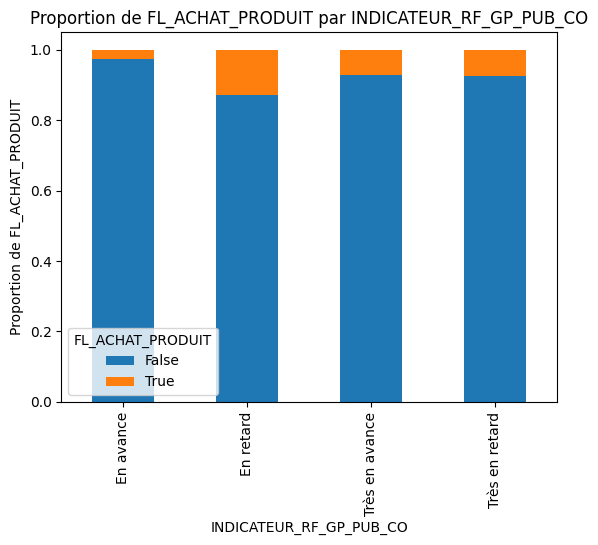


FL_ACHAT_PRODUIT            False     True 
INDICATEUR_RF_GP_PUB_CO                    
En avance                0.973444  0.026556
En retard                0.870219  0.129781
Très en avance           0.927183  0.072817
Très en retard           0.925393  0.074607

Test du Khi-Deux - Chi2 stat: 0.0762, p-value: 0.9945, df: 3 → Test non significatif à 5%
T de Tschuprow : 0.1185
     Relation modérée



------------------------------------------------------------------------------------------
Analyse de la variable 'SEGMENT_BUMP'



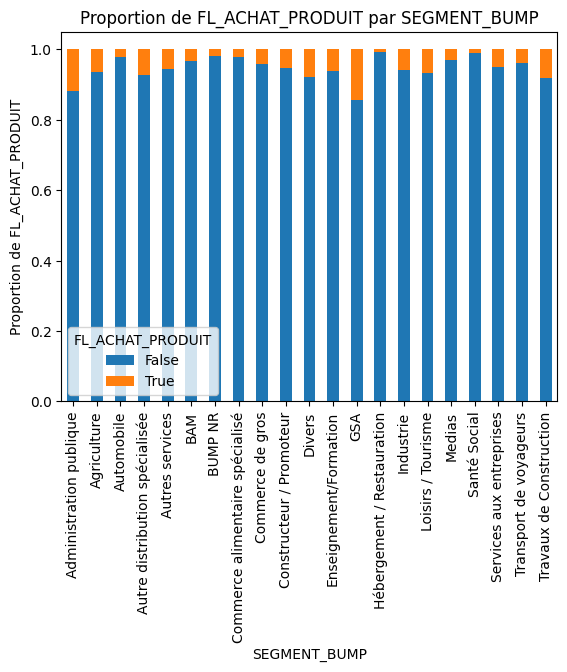


FL_ACHAT_PRODUIT                    False     True 
SEGMENT_BUMP                                       
Administration publique          0.881316  0.118684
Agriculture                      0.936600  0.063400
Automobile                       0.978166  0.021834
Autre distribution spécialisée   0.927904  0.072096
Autres services                  0.944020  0.055980
BAM                              0.966184  0.033816
BUMP NR                          0.982690  0.017310
Commerce alimentaire spécialisé  0.979018  0.020982
Commerce de gros                 0.958491  0.041509
Constructeur / Promoteur         0.947195  0.052805
Divers                           0.920538  0.079462
Enseignement/Formation           0.939130  0.060870
GSA                              0.855826  0.144174
Hébergement / Restauration       0.992575  0.007425
Industrie                        0.940579  0.059421
Loisirs / Tourisme               0.932443  0.067557
Medias                           0.971049  0.028951
Santé Socia

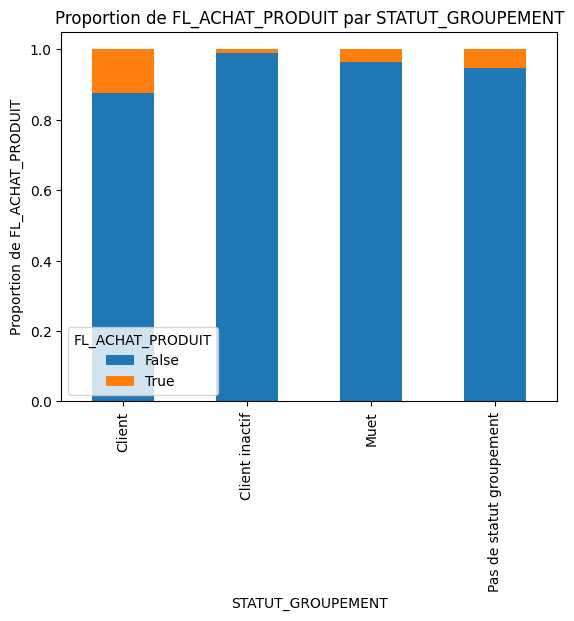


FL_ACHAT_PRODUIT             False     True 
STATUT_GROUPEMENT                           
Client                    0.876307  0.123693
Client inactif            0.989724  0.010276
Muet                      0.964996  0.035004
Pas de statut groupement  0.946792  0.053208

Test du Khi-Deux - Chi2 stat: 0.1357, p-value: 0.9872, df: 3 → Test non significatif à 5%
T de Tschuprow : 0.1160
     Relation modérée



------------------------------------------------------------------------------------------
Analyse de la variable 'FORME_JURIDIQUE_MISSING'



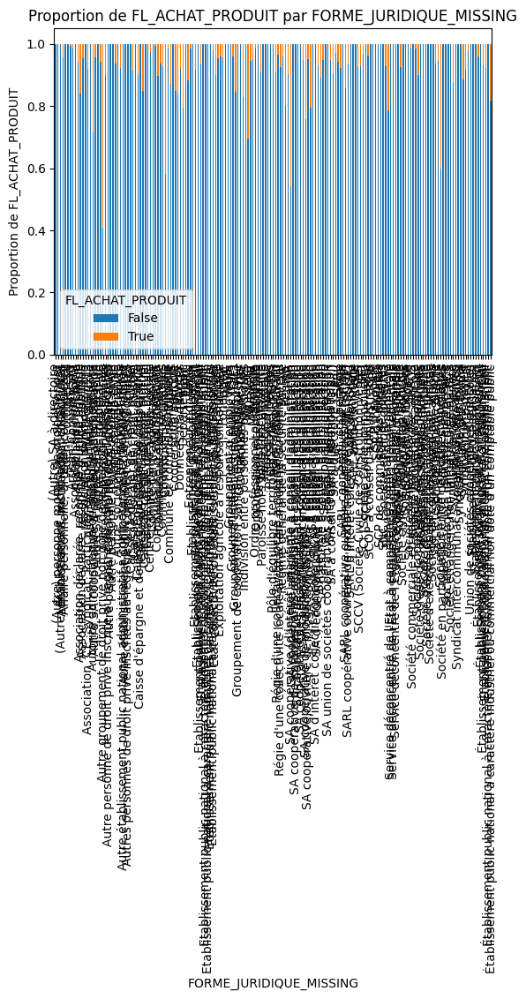


FL_ACHAT_PRODUIT                                       False     True 
FORME_JURIDIQUE_MISSING                                               
(Autre) SA à directoire                             1.000000  0.000000
(Autre) personne morale de droit étranger           1.000000  0.000000
(Autre) Établissement public administratif local    1.000000  0.000000
Administrations, institutions, collectivités        0.957447  0.042553
Affaire personnelle, artisan, commercant            1.000000  0.000000
...                                                      ...       ...
Établissement public local social et médico-social  1.000000  0.000000
Établissement public local à caractère industri...  0.931818  0.068182
Établissement public national à caractère admin...  0.921569  0.078431
Établissement public national à caractère indus...  1.000000  0.000000
Établissement public national à caractère indus...  0.818182  0.181818

[175 rows x 2 columns]

Test du Khi-Deux - Chi2 stat: 27.9399, p-value: 1.0

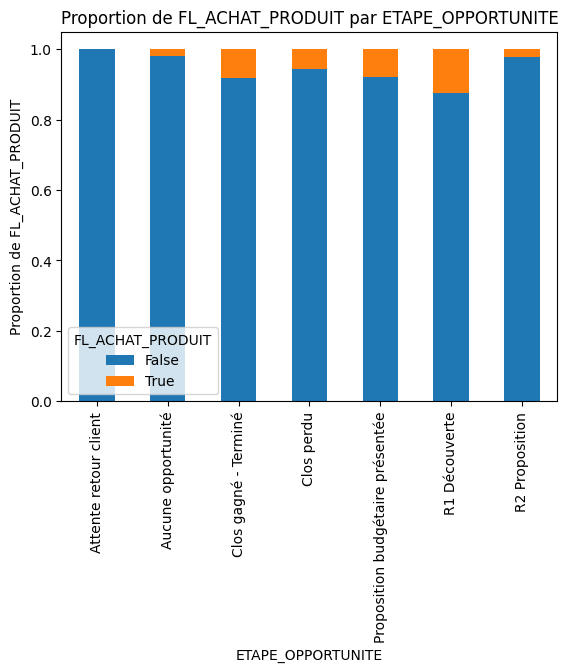


FL_ACHAT_PRODUIT                     False     True 
ETAPE_OPPORTUNITE                                   
Attente retour client             1.000000  0.000000
Aucune opportunité                0.982071  0.017929
Clos gagné - Terminé              0.918308  0.081692
Clos perdu                        0.944259  0.055741
Proposition budgétaire présentée  0.921429  0.078571
R1 Découverte                     0.875352  0.124648
R2 Proposition                    0.977528  0.022472

Test du Khi-Deux - Chi2 stat: 0.2249, p-value: 0.9998, df: 6 → Test non significatif à 5%
T de Tschuprow : 0.0969
     Relation faible



------------------------------------------------------------------------------------------
Analyse de la variable 'DETAIL_TYPE_PRODUIT'



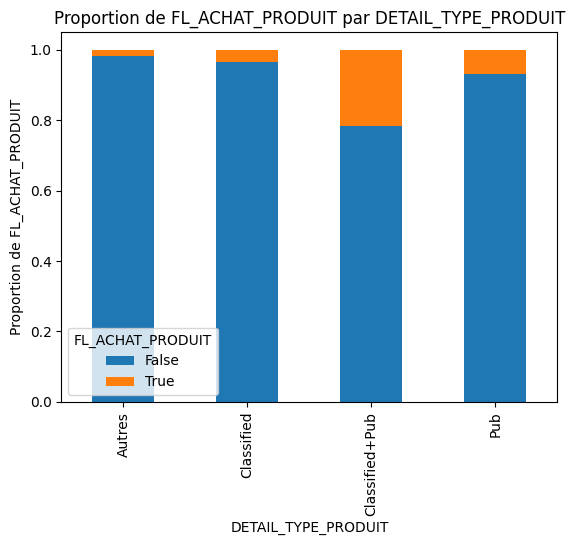


FL_ACHAT_PRODUIT        False     True 
DETAIL_TYPE_PRODUIT                    
Autres               0.981250  0.018750
Classified           0.966108  0.033892
Classified+Pub       0.782609  0.217391
Pub                  0.932203  0.067797

Test du Khi-Deux - Chi2 stat: 0.3210, p-value: 0.9560, df: 3 → Test non significatif à 5%
T de Tschuprow : 0.0739
     Relation faible



------------------------------------------------------------------------------------------
Analyse de la variable 'RECORD_TYPE_NAME'



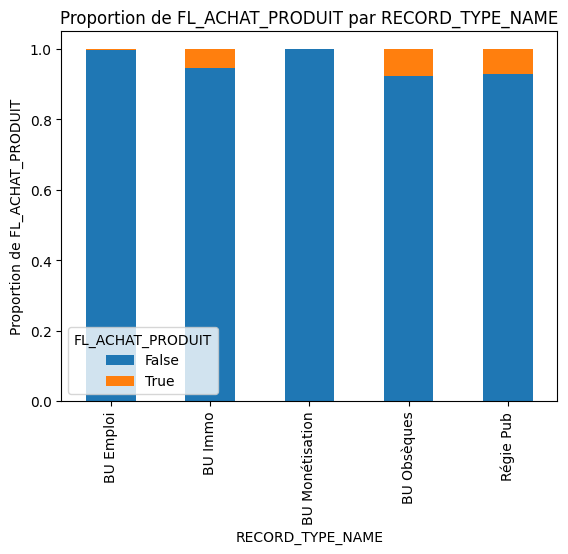


FL_ACHAT_PRODUIT     False     True 
RECORD_TYPE_NAME                    
BU Emploi         0.996896  0.003104
BU Immo           0.945166  0.054834
BU Monétisation   1.000000  0.000000
BU Obsèques       0.923697  0.076303
Régie Pub         0.930562  0.069438

Test du Khi-Deux - Chi2 stat: 0.1372, p-value: 0.9978, df: 4 → Test non significatif à 5%
T de Tschuprow : 0.0658
     Relation faible



------------------------------------------------------------------------------------------
Analyse de la variable 'MODE_PAIEMENT'



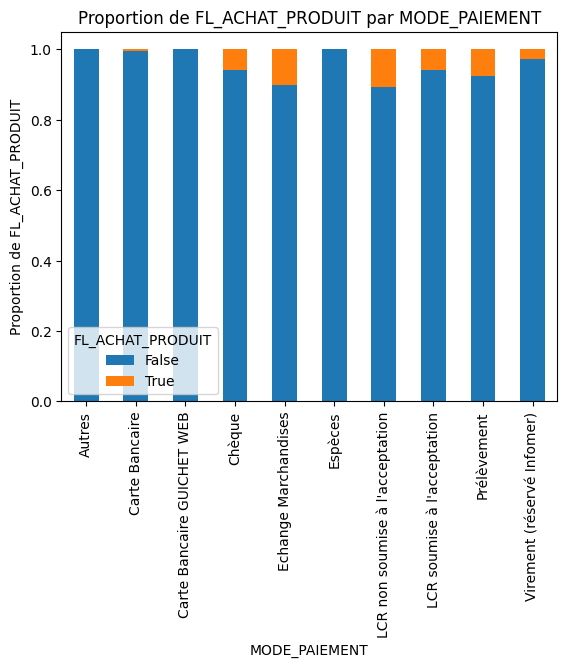


FL_ACHAT_PRODUIT                    False     True 
MODE_PAIEMENT                                      
Autres                           1.000000  0.000000
Carte Bancaire                   0.995968  0.004032
Carte Bancaire GUICHET WEB       1.000000  0.000000
Chèque                           0.941810  0.058190
Echange Marchandises             0.900000  0.100000
Espèces                          1.000000  0.000000
LCR non soumise à l'acceptation  0.894443  0.105557
LCR soumise à l'acceptation      0.942029  0.057971
Prélèvement                      0.925582  0.074418
Virement (réservé Infomer)       0.972410  0.027590

Test du Khi-Deux - Chi2 stat: 0.3885, p-value: 1.0000, df: 9 → Test non significatif à 5%
T de Tschuprow : 0.0633
     Relation faible



------------------------------------------------------------------------------------------
Analyse de la variable 'REGION'



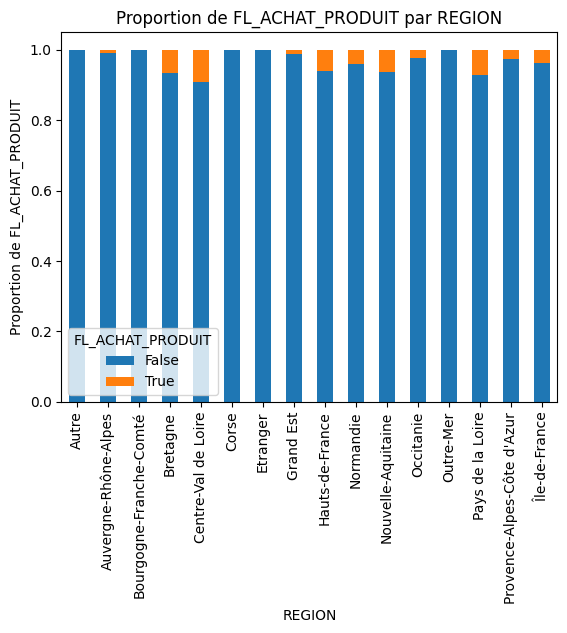


FL_ACHAT_PRODUIT               False     True 
REGION                                        
Autre                       1.000000  0.000000
Auvergne-Rhône-Alpes        0.990148  0.009852
Bourgogne-Franche-Comté     1.000000  0.000000
Bretagne                    0.933811  0.066189
Centre-Val de Loire         0.909639  0.090361
Corse                       1.000000  0.000000
Etranger                    1.000000  0.000000
Grand Est                   0.988971  0.011029
Hauts-de-France             0.938889  0.061111
Normandie                   0.960090  0.039910
Nouvelle-Aquitaine          0.936202  0.063798
Occitanie                   0.977273  0.022727
Outre-Mer                   1.000000  0.000000
Pays de la Loire            0.928113  0.071887
Provence-Alpes-Côte d'Azur  0.975155  0.024845
Île-de-France               0.961824  0.038176

Test du Khi-Deux - Chi2 stat: 0.4726, p-value: 1.0000, df: 15 → Test non significatif à 5%
T de Tschuprow : 0.0533
     Relation faible



-------------

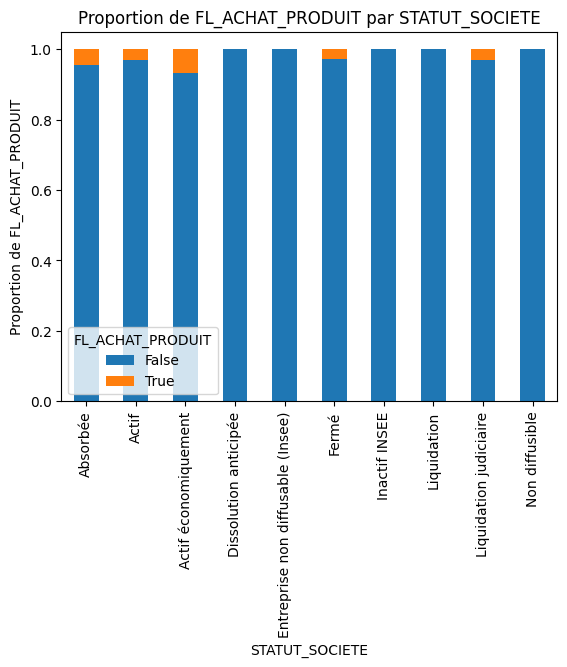


FL_ACHAT_PRODUIT                      False     True 
STATUT_SOCIETE                                       
Absorbée                           0.955882  0.044118
Actif                              0.968504  0.031496
Actif économiquement               0.931760  0.068240
Dissolution anticipée              1.000000  0.000000
Entreprise non diffusable (Insee)  1.000000  0.000000
Fermé                              0.972952  0.027048
Inactif INSEE                      1.000000  0.000000
Liquidation                        1.000000  0.000000
Liquidation judiciaire             0.970639  0.029361
Non diffusible                     1.000000  0.000000

Test du Khi-Deux - Chi2 stat: 0.2639, p-value: 1.0000, df: 9 → Test non significatif à 5%
T de Tschuprow : 0.0520
     Relation faible



------------------------------------------------------------------------------------------
Analyse de la variable 'PROFIL_CLIENT'



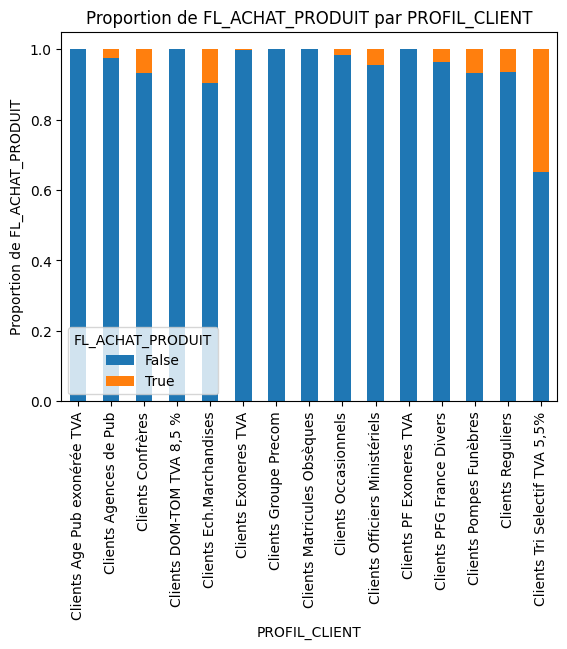


FL_ACHAT_PRODUIT                   False     True 
PROFIL_CLIENT                                     
Clients Age Pub exonérée TVA    1.000000  0.000000
Clients Agences de Pub          0.975655  0.024345
Clients Confrères               0.933333  0.066667
Clients DOM-TOM TVA 8,5 %       1.000000  0.000000
Clients Ech.Marchandises        0.903226  0.096774
Clients Exoneres TVA            0.997024  0.002976
Clients Groupe Precom           1.000000  0.000000
Clients Matricules Obsèques     1.000000  0.000000
Clients Occasionnels            0.984427  0.015573
Clients Officiers Ministériels  0.954357  0.045643
Clients PF Exoneres TVA         1.000000  0.000000
Clients PFG France Divers       0.964286  0.035714
Clients Pompes Funèbres         0.932021  0.067979
Clients Reguliers               0.933980  0.066020
Clients Tri Selectif TVA 5,5%   0.652174  0.347826

Test du Khi-Deux - Chi2 stat: 2.2293, p-value: 0.9998, df: 14 → Test non significatif à 5%
T de Tschuprow : 0.0468
     Relation fa

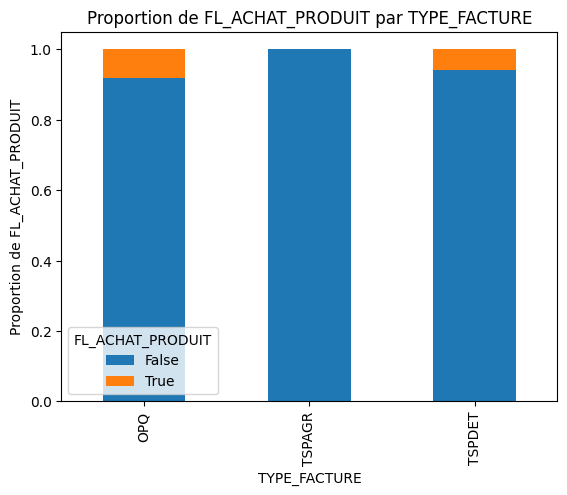


FL_ACHAT_PRODUIT     False     True 
TYPE_FACTURE                        
OPQ               0.919292  0.080708
TSPAGR            1.000000  0.000000
TSPDET            0.940888  0.059112

Test du Khi-Deux - Chi2 stat: 0.0786, p-value: 0.9615, df: 2 → Test non significatif à 5%
T de Tschuprow : 0.0374
     Relation faible



------------------------------------------------------------------------------------------
Analyse de la variable 'PROCEDURE_COLLECTIVE'



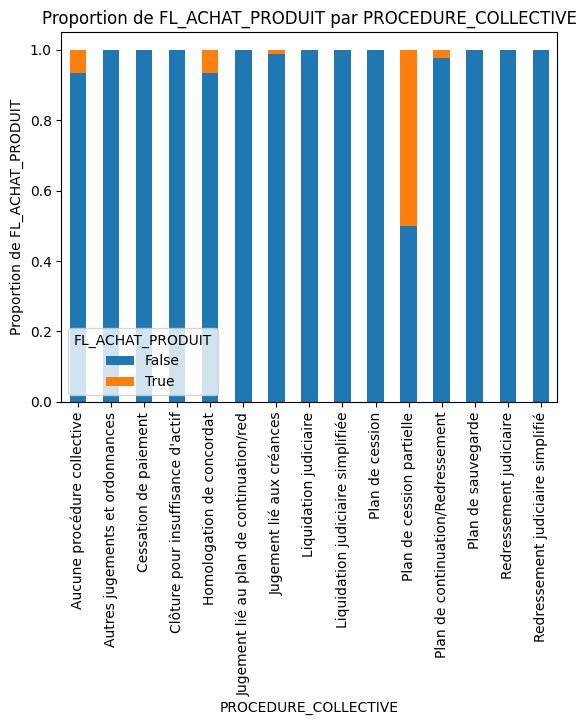


FL_ACHAT_PRODUIT                             False     True 
PROCEDURE_COLLECTIVE                                        
Aucune procédure collective               0.935433  0.064567
Autres jugements et ordonnances           1.000000  0.000000
Cessation de paiement                     1.000000  0.000000
Clôture pour insuffisance d'actif         1.000000  0.000000
Homologation de concordat                 0.934426  0.065574
Jugement lié au plan de continuation/red  1.000000  0.000000
Jugement lié aux créances                 0.988372  0.011628
Liquidation judiciaire                    1.000000  0.000000
Liquidation judiciaire simplifiée         1.000000  0.000000
Plan de cession                           1.000000  0.000000
Plan de cession partielle                 0.500000  0.500000
Plan de continuation/Redressement         0.976190  0.023810
Plan de sauvegarde                        1.000000  0.000000
Redressement judiciaire                   1.000000  0.000000
Redressement judiciaire

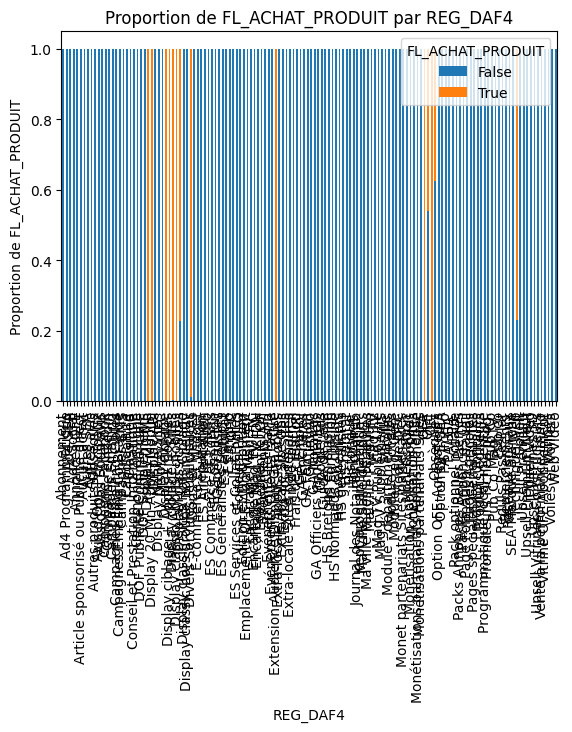


FL_ACHAT_PRODUIT             False  True 
REG_DAF4                                 
Abonnement                     1.0    0.0
Ad4 Programmatique             1.0    0.0
Ad4 SEA                        1.0    0.0
Ad4 Social                     1.0    0.0
Annonces OFE                   1.0    0.0
...                            ...    ...
Vente à la performance Immo    1.0    0.0
Vitrine OFE Abonnement         1.0    0.0
Vitrines                       1.0    0.0
Voiles et Voiliers             1.0    0.0
Web Vidéo                      1.0    0.0

[140 rows x 2 columns]



TypeError: unsupported format string passed to numpy.ndarray.__format__

In [11]:
# Liste des colonnes à exclure
columns_to_exclude = ['ID_COMPTE', '_ID_', '_DATE_ETUDE_'] + [col for col in dt.columns if col.startswith('DT_')]

# Colonnes qualitatives
columns_quali = dt.drop(columns_to_exclude, axis=1).select_dtypes(include=['category', 'object']).columns

# Dictionnaire pour stocker les résultats
resultats = {}

for column in columns_quali:
    df = dt.copy()
    df = df.dropna(subset=[column])

    nb_modalites = df[column].nunique()
    nb_modalite_valide = (df[column].value_counts() >= 5).sum()
    eff_modalites = bool(nb_modalite_valide / nb_modalites >= 0.8)

    contingency_table = pd.crosstab(df[column], df['FL_ACHAT_PRODUIT'])

    if nb_modalites == 2 or eff_modalites == False:
        try:
            oddsratio, fisher_p = stats.fisher_exact(contingency_table)
        except Exception:
            fisher_p = 1  # sécurité en cas d'erreur (peu de cas)
    else:
        chi2_stat, chi2_p, dof, ex = stats.chi2_contingency(contingency_table)

    cramers_v_stat, tschuprow_t = calcul_cramersV_tschuprowT(contingency_table, contingency_table)

    if nb_modalites == 2 and eff_modalites == False:
        metric = cramers_v_stat
    elif nb_modalites > 2 and eff_modalites == True:
        metric = tschuprow_t
    else:
        metric = 0  # valeur neutre si non calculable

    resultats[column] = {
        'nb_modalites': nb_modalites,
        'eff_modalites': eff_modalites,
        'contingency_table': pd.crosstab(df[column], df['FL_ACHAT_PRODUIT'], normalize='index'),
        'metric': metric
    }

# Tri des résultats par force de liaison décroissante
resultats_tries = dict(sorted(resultats.items(), key=lambda item: item[1]['metric'], reverse=True))

# Affichage final trié
for variable, infos in resultats_tries.items():
    print('---' * 30)
    print(f"Analyse de la variable '{variable}'")
    print()

    contingency_table = infos['contingency_table']

    # Diagramme en bâtons
    contingency_table_percentage = contingency_table.div(contingency_table.sum(axis=1), axis=0)
    contingency_table_percentage.plot(kind='bar', stacked=True)
    plt.title(f'Proportion de FL_ACHAT_PRODUIT par {variable}')
    plt.xlabel(f'{variable}')
    plt.ylabel('Proportion de FL_ACHAT_PRODUIT')
    plt.show()
    print()

    # Tableau croisé
    print(contingency_table)
    print()

    nb_modalites = infos['nb_modalites']
    eff_modalites = infos['eff_modalites']

    if nb_modalites == 2 or eff_modalites == False:
        try:
            oddsratio, fisher_p = stats.fisher_exact(contingency_table)
        except Exception:
            fisher_p = 1
        significatif_fisher = "significatif" if fisher_p < 0.05 else "non significatif"
        print(f'Test exact de Fisher - p-value: {fisher_p:.4f} → Test {significatif_fisher} à 5%')
    else:
        chi2_stat, chi2_p, dof, ex = stats.chi2_contingency(contingency_table)
        significatif_chi2 = "significatif" if chi2_p < 0.05 else "non significatif"
        print(f'Test du Khi-Deux - Chi2 stat: {chi2_stat:.4f}, p-value: {chi2_p:.4f}, df: {dof} → Test {significatif_chi2} à 5%')

    metric = infos['metric']

    if nb_modalites == 2 and eff_modalites == False:
        print(f"V de Cramer : {metric:.4f}")
        if metric < 0.1:
            print("     Relation faible")
        elif 0.1 <= metric < 0.3:
            print("     Relation modérée")
        else:
            print("     Relation forte")
    elif nb_modalites > 2 and eff_modalites == True:
        print(f"T de Tschuprow : {metric:.4f}")
        if metric < 0.1:
            print("     Relation faible")
        elif 0.1 <= metric < 0.3:
            print("     Relation modérée")
        else:
            print("     Relation forte")
    else:
        print("Variables non valides pour le calcul de V de Cramer ou T de Tschuprow")

    print('\n\n')

# Affichage résumé global trié
print('\n\n======================== Résumé Trié ========================\n')
for variable, infos in resultats_tries.items():
    print(f"Variable : {variable} → Statistique de liaison : {infos['metric']:.4f}")
print('\n============================================================\n')


## Analyse comparative complète

### Discrétisation des quantitatives

In [ ]:
dt = data.copy()
dt.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9101 entries, 0 to 9100
Columns: 101 entries, ID_COMPTE to REGION
dtypes: Int64(16), bool(15), category(39), datetime64[ns](10), float64(11), int64(10)
memory usage: 4.4 MB


In [ ]:
def extract_seuils(tree):
    """
    Extrait les seuils de split d'un arbre entraîné
    """
    tree_ = tree.tree_
    thresholds = []

    def recurse(node):
        if tree_.feature[node] != _tree.TREE_UNDEFINED:
            thresholds.append(tree_.threshold[node])
            recurse(tree_.children_left[node])
            recurse(tree_.children_right[node])
    
    recurse(0)
    return sorted(set(thresholds))


def calcul_entropy(df, col_bin, target):
    """
    Calcule l'entropie pondérée moyenne entre les bins et la variable cible
    """
    entropies = []
    for b in df[col_bin].unique():
        sub = df[df[col_bin] == b]
        probs = sub[target].value_counts(normalize=True)
        ent = entropy(probs, base=2)
        weight = len(sub) / len(df)
        entropies.append(ent * weight)
    return sum(entropies)


def discretize(df, column, target):
    """
    Discrétise une variable quantitative avec arbre de décision optimisé
    Affiche les détails utiles et renvoie la nouvelle DataFrame
    """
    print(f"Discrétisation de la variable '{column}'")
    
    # Remplacer les infinies ou NaN par la médiane de la colonne
    df[column] = df[column].replace([np.inf, -np.inf], np.nan)
    df[column] = df[column].fillna(df[column].median())

    X = df[[column]].copy()
    y = df[target]

    base_tree = DecisionTreeClassifier(criterion='entropy', random_state=42)
    param_grid = {
        'max_depth': [2, 3, 4],
        'min_samples_leaf': [0.01, 0.03, 0.05, 0.1],
        'max_leaf_nodes': [3, 4, 5, 6]
    }

    grid = GridSearchCV(base_tree, param_grid, cv=5, scoring='accuracy', verbose=0)
    grid.fit(X, y)

    best_tree = grid.best_estimator_
    best_params = grid.best_params_

    thresholds = extract_seuils(best_tree)
    bins = [-np.inf] + thresholds + [np.inf]
    labels = [f'bin_{i+1}' for i in range(len(bins)-1)]

    col_discretized = f'CLASS_{column}'
    df[col_discretized] = pd.cut(df[column], bins=bins, labels=labels)

    print("Seuils utilisés pour discretiser :", bins)
    entropy_score = calcul_entropy(df, col_discretized, target)
    print(f"Entropie pondérée moyenne des classes : {entropy_score:.4f}")
    print("Distribution des classes par rapport à la cible :")
    crosstab = pd.crosstab(df[col_discretized], df[target], normalize='index') * 100
    print(crosstab.round(1))


    return df

In [ ]:
for column in columns_quanti:
    dt = discretize(dt, column, 'FL_ACHAT_PRODUIT')
    print('---'*30)
    print()

Discrétisation de la variable 'NB_CONTACT_AVEC_EMAIL'
Seuils utilisés pour discretiser : [-inf, np.float64(1.5), np.float64(3.5), inf]
Entropie pondérée moyenne des classes : 0.3388
Distribution des classes par rapport à la cible :
FL_ACHAT_PRODUIT             False  True 
CLASS_NB_CONTACT_AVEC_EMAIL              
bin_1                         96.9    3.1
bin_2                         92.7    7.3
bin_3                         89.0   11.0
------------------------------------------------------------------------------------------

Discrétisation de la variable 'NB_CONTACT_AVEC_TEL'
Seuils utilisés pour discretiser : [-inf, np.float64(1.5), np.float64(3.5), inf]
Entropie pondérée moyenne des classes : 0.3401
Distribution des classes par rapport à la cible :
FL_ACHAT_PRODUIT           False  True 
CLASS_NB_CONTACT_AVEC_TEL              
bin_1                       96.7    3.3
bin_2                       92.9    7.1
bin_3                       89.1   10.9
------------------------------------

In [ ]:
data_discretise = dt.copy()
data_discretise.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9101 entries, 0 to 9100
Columns: 138 entries, ID_COMPTE to CLASS_RECENCE_DERNIERE_RELATION_CLIENT
dtypes: Int64(16), bool(15), category(76), datetime64[ns](10), float64(11), int64(10)
memory usage: 4.7 MB


### Analyse des variables discrétisées et qualitatives

In [ ]:
dt = data_discretise.copy()
dt.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9101 entries, 0 to 9100
Columns: 138 entries, ID_COMPTE to CLASS_RECENCE_DERNIERE_RELATION_CLIENT
dtypes: Int64(16), bool(15), category(76), datetime64[ns](10), float64(11), int64(10)
memory usage: 4.7 MB


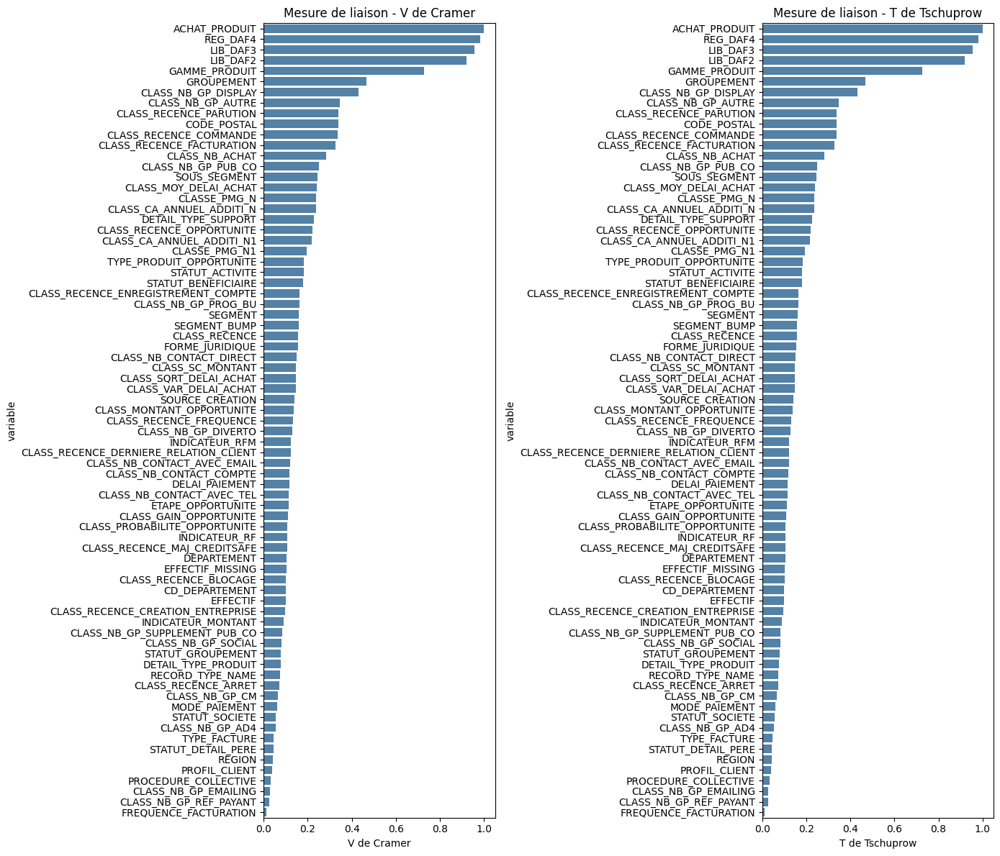

In [ ]:
columns_quali = dt.drop(['ID_COMPTE'], axis=1).select_dtypes(include=['category']).columns
cramer_vals = []
tschuprow_vals = []

for column in columns_quali:
    df = dt.copy()
    
    # Tableau de contingence
    contingency_table = pd.crosstab(df[column], df['FL_ACHAT_PRODUIT'])
    
    # Calcul des valeurs de Cramer et Tschuprow
    cramers_v_stat, tschuprow_t = calcul_cramersV_tschuprowT(contingency_table, contingency_table)
    cramer_vals.append(cramers_v_stat)
    tschuprow_vals.append(tschuprow_t)

resultats = pd.DataFrame({
    "variable": columns_quali,
    "cramer": cramer_vals,
    "tschuprow": tschuprow_vals
}).sort_values(by="tschuprow", ascending=False)

# Visualisation
plt.figure(figsize=(14, 12))  # Largeur doublée pour accueillir les deux graphiques

plt.subplot(1, 2, 1)  # 1 ligne, 2 colonnes, position 1
sns.barplot(data=resultats, x="cramer", y="variable", color="steelblue")
plt.xlabel("V de Cramer")
plt.title("Mesure de liaison - V de Cramer")

plt.subplot(1, 2, 2)  # 1 ligne, 2 colonnes, position 2
sns.barplot(data=resultats, x="tschuprow", y="variable", color="steelblue")
plt.xlabel("T de Tschuprow")
plt.title("Mesure de liaison - T de Tschuprow")

plt.tight_layout()
plt.show()


In [ ]:
def calcul_V_test(val_pos, val_neg):
    """
    Calcule le V-test entre deux groupes
    """
    return (val_pos - val_neg) / np.sqrt((val_pos + val_neg)/2 + 1e-9)

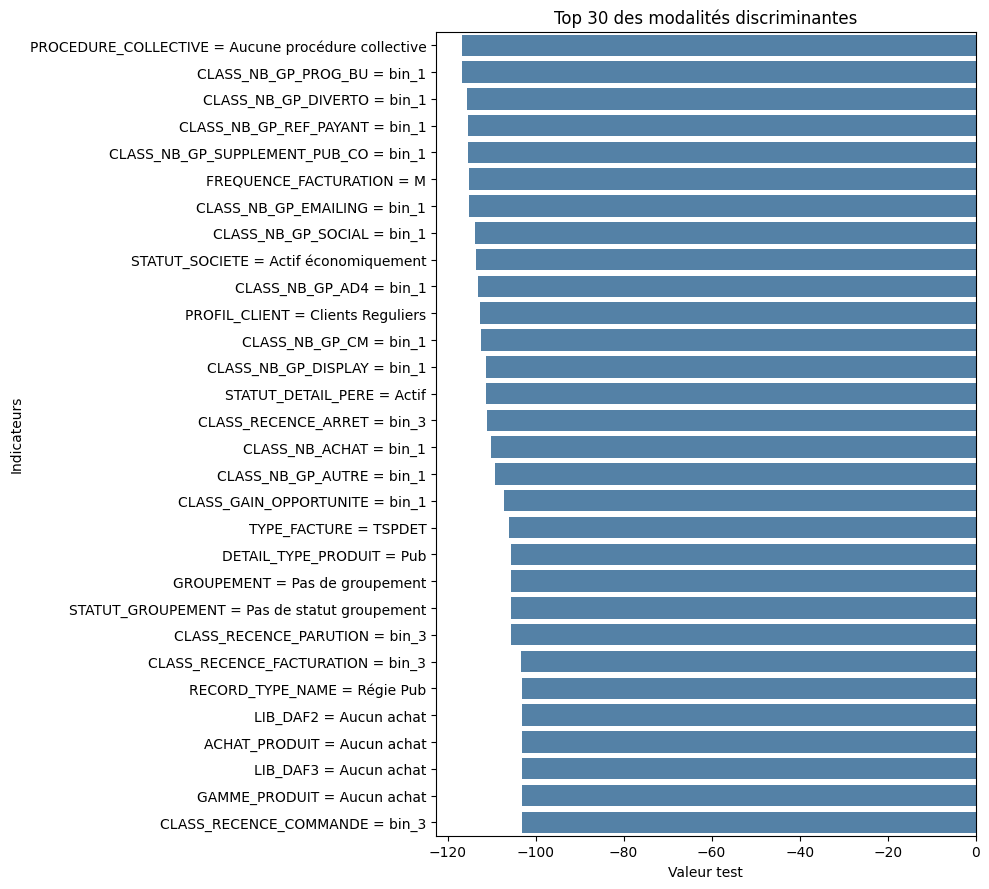

In [ ]:
resultats = []

for column in columns_quali:
    df = dt.copy()
    
    # Tableau de contingence
    contingency_table = pd.crosstab(df[column], df['FL_ACHAT_PRODUIT'])
    
    # Calcul des valeurs de V-test
    for modality in contingency_table.index:
        val_achat = contingency_table.loc[modality, True] if True in contingency_table.columns else 0
        val_nonachat = contingency_table.loc[modality, False] if False in contingency_table.columns else 0
        v_test = calcul_V_test(val_achat, val_nonachat) # (val_achat - val_nonachat) / np.sqrt((val_achat + val_nonachat)/2 + 1e-9)
        resultats.append({
            "indicateur": f"{column} = {modality}",
            "v.test": v_test
        })
    
df_profil = pd.DataFrame(resultats).sort_values(by="v.test", key=lambda x: x.abs(), ascending=False)

# Affichage top 30
plt.figure(figsize=(10, 9))
sns.barplot(data=df_profil.head(30), x="v.test", y="indicateur", color="steelblue")
plt.xlabel("Valeur test")
plt.ylabel("Indicateurs")
plt.title("Top 30 des modalités discriminantes")
plt.tight_layout()
plt.show()
    
    

## Statistiques multivariée

### Principes de modélisation, Statistiques multivariées

- PRINCIPES DE MODÉLISATION, STATISTIQUES MULTIVARIÉES : afc, acp, acm, afm, clustering



| **Méthode** | **Nom complet**                         | **Type de données**                                    | **Objectif principal**                                   |
| ----------- | --------------------------------------- | ------------------------------------------------------ | -------------------------------------------------------- |
| **ACP**     | Analyse en Composantes Principales      | **Quantitatives uniquement**                           | Réduction de dimension et synthèse de l'information      |
| **AFC**     | Analyse Factorielle des Correspondances | **Deux variables qualitatives (table de contingence)** | Étudier l'association entre deux variables               |
| **ACM**     | Analyse des Correspondances Multiples   | **Plusieurs variables qualitatives**                   | Réduction de dimension des données catégorielles         |
| **AFM**     | Analyse Factorielle Mixte               | **Variables mixtes (quantitatives et qualitatives)**   | Synthèse de données mixtes dans un même espace factoriel |


In [ ]:
dt = data.copy()
dt.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9101 entries, 0 to 9100
Columns: 101 entries, ID_COMPTE to REGION
dtypes: Int64(16), bool(15), category(39), datetime64[ns](10), float64(11), int64(10)
memory usage: 4.4 MB


In [ ]:
df = dt.copy()

# Définir les blocs thématiques
bloc_localisation = [
    'DEPARTEMENT', 'CODE_POSTAL', 'CD_DEPARTEMENT', 'REGION'
]

bloc_info_clients = [
    'STATUT_SOCIETE', 'TYPE_FACTURE', 'MODE_PAIEMENT', 'DETAIL_TYPE_SUPPORT', 
    'DETAIL_TYPE_PRODUIT', 'STATUT_DETAIL_PERE', 'NB_CONTACT_AVEC_EMAIL', 
    'NB_CONTACT_AVEC_TEL', 'NB_CONTACT_COMPTE', 'FL_BLOGAGE', 'FL_HISTO_BLOGAGE', 
    'FL_PROCEDURE_COLLECTIVE', 'FL_ARRET', 'FL_CREDITSAFE', 'FL_NOMBRE_EMPLOYES', 'FL_CA_ENTREPRISE', 
    'MOTIF_ARRET', 'MOTIF_BLOCAGE', 'FL_GROUPEMENT', 'SOUS_SEGMENT', 'SEGMENT_BUMP', 
    'STATUT_GROUPEMENT', 'GROUPEMENT', 'EFFECTIF_MISSING', 'RECORD_TYPE_NAME', 'FREQUENCE_FACTURATION', 
    'DELAI_PAIEMENT', 'SOURCE_CREATION', 'PROCEDURE_COLLECTIVE', 'STATUT_ACTIVITE',
    'STATUT_BENEFICIAIRE', 'PROFIL_CLIENT', 'SEGMENT', 'RECENCE_ARRET',
    'RECENCE_BLOCAGE', 'RECENCE_OPPORTUNITE', 'RECENCE_ENREGISTREMENT_COMPTE', 
    'RECENCE_CREATION_ENTREPRISE', 'RECENCE_MAJ_CREDITSAFE'
]

bloc_achat_clients = [
    'NB_ACHAT', 'NB_GP_AD4', 'NB_GP_AUTRE', 'NB_GP_CM', 'NB_GP_DISPLAY', 'NB_GP_DIVERTO', 
    'NB_GP_EMAILING', 'NB_GP_PROG_BU', 'NB_GP_PUB_CO', 'NB_GP_REF_PAYANT', 'NB_GP_SOCIAL', 
    'NB_GP_SUPPLEMENT_PUB_CO', 'RECENCE_COMMANDE', 'CLASSE_PMG_N', 'CLASSE_PMG_N1', 
    'INDICATEUR_RF', 'INDICATEUR_MONTANT', 'INDICATEUR_RFM', 'CA_ANNUEL_ADDITI_N', 
    'CA_ANNUEL_ADDITI_N1', 'MOY_DELAI_ACHAT', 'VAR_DELAI_ACHAT', 'RECENCE', 
    'SQRT_DELAI_ACHAT', 'RECENCE_FREQUENCE', 'SC_MONTANT'
]

bloc_relation_clients = [
    'FL_RELATION_CLIENT_3M', 'FL_RELATION_CLIENT_6M', 'FL_RELATION_CLIENT_9M', 
    'RECENCE_DERNIERE_RELATION_CLIENT', 'MONTANT_OPPORTUNITE', 'GAIN_OPPORTUNITE', 
    'FL_OPPORTUNITE', 'PROBABILITE_OPPORTUNITE', 'ETAPE_OPPORTUNITE', 'TYPE_PRODUIT_OPPORTUNITE'
]

group_dict = {
    'Localisation': bloc_localisation,
    'Infos': bloc_info_clients,
    'Achats': bloc_achat_clients,
    'Relation': bloc_relation_clients
}


# Concaténation des colonnes retenues
colonnes_afm = (
    bloc_localisation + bloc_info_clients + bloc_achat_clients + bloc_relation_clients + ['FL_ACHAT_PRODUIT']
)

# Filtrage des données
df_afm = df[colonnes_afm].copy()

# Transformation : s'assurer que les colonnes booléennes et catégorielles sont bien typées
for col in df_afm.columns:
    if df_afm[col].dtype == bool or df_afm[col].dtype == object:
        df_afm[col] = df_afm[col].astype('category')



In [ ]:
# Transformation : passer tout en quanti
# Séparation variables qualitatives et quantitatives
qual_cols = df_afm.drop(columns=['FL_ACHAT_PRODUIT']).select_dtypes(include=['category']).columns.tolist()
quant_cols = df_afm.select_dtypes(exclude=['category']).columns.tolist()


# Encodage OneHot
encoder = OneHotEncoder(sparse_output=False, handle_unknown='ignore')
encoded_qual = pd.DataFrame(
    encoder.fit_transform(df_afm[qual_cols]),
    columns=encoder.get_feature_names_out(qual_cols),
    index=df_afm.index
)

# Fusion avec les variables quantitatives
df_afm_encoded = pd.concat([encoded_qual, df_afm[quant_cols], df_afm['FL_ACHAT_PRODUIT']], axis=1)

df_afm_encoded = df_afm_encoded.replace([np.inf, -np.inf], np.nan)
df_afm_encoded = df_afm_encoded.dropna() 

In [ ]:
group_dict_encoded = {}
all_encoded_cols = df_afm_encoded.columns.tolist()

# Fusion des blocs d'origine pour retrouver le bloc de chaque variable
original_col_to_bloc = {}
for bloc_name, col_list in group_dict.items():
    for col in col_list:
        original_col_to_bloc[col] = bloc_name

# Initialisation des blocs encodés
for bloc_name in group_dict.keys():
    group_dict_encoded[bloc_name] = []

# Remplissage des blocs encodés selon le préfixe des colonnes encodées
for col in all_encoded_cols:
    for original_col, bloc_name in original_col_to_bloc.items():
        if col.startswith(original_col + '_'):
            group_dict_encoded[bloc_name].append(col)
            break
        elif col == original_col:
            # Pour les variables quantitatives qui n'ont pas été encodées
            group_dict_encoded[bloc_name].append(col)
            break


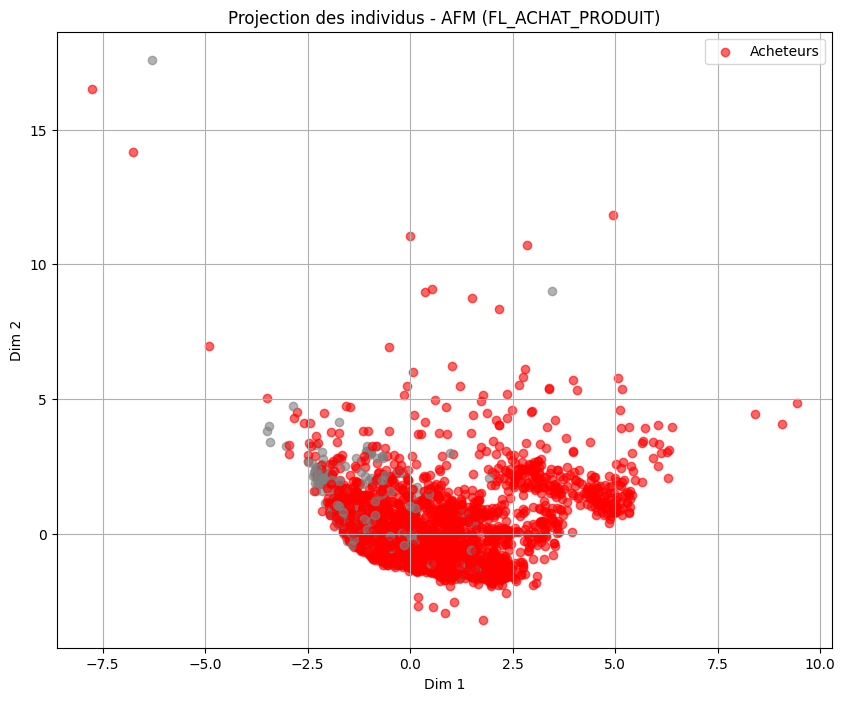

In [ ]:
# On retire la variable cible du X pour ne pas l’inclure dans l’analyse
X = df_afm_encoded.drop(columns=['FL_ACHAT_PRODUIT'])
y = df_afm_encoded['FL_ACHAT_PRODUIT']

# AFM 
afm = prince.MFA(n_components=2, n_iter=3, copy=True, check_input=True, random_state=241, engine='sklearn')
afm = afm.fit(X, y=y, groups=group_dict_encoded)

# Projection des individus
X_projected = afm.row_coordinates(X)

# Visualisation avec couleurs selon FL_ACHAT_PRODUIT
plt.figure(figsize=(10, 8))
for i in range(len(X_projected)):
    if y.iloc[i]:
        plt.scatter(X_projected.iloc[i, 0], X_projected.iloc[i, 1], color='grey', label='Non acheteurs' if i == 0 else "", alpha=0.6)
    else:
        plt.scatter(X_projected.iloc[i, 0], X_projected.iloc[i, 1], color='red', label='Acheteurs' if i == 0 else "", alpha=0.6)

plt.xlabel('Dim 1')
plt.ylabel('Dim 2')
plt.title('Projection des individus - AFM (FL_ACHAT_PRODUIT)')
plt.legend()
plt.grid(True)
plt.show()

### Statistiques et économétrie spatiale
> STATISTIQUE ET ÉCONOMÉTRIE SPATIALE : tester l'auto corrélation spatiale


In [ ]:
# from esda.moran import Moran
# from libpysal.weights import Queen, KNN
# import geopandas as gpd

c:\Users\prince.mezuirotimi\OneDrive - Gedeon - SIPAOF\Documents\INTRASIPA\PROJETS\ADDITI - SCORING APPETENCE PRODUIT\venv-ScAppetence\Lib\site-packages\geopandas\_compat.py:7: DeprecationWarning: The 'shapely.geos' module is deprecated, and will be removed in a future version. All attributes of 'shapely.geos' are available directly from the top-level 'shapely' namespace (since shapely 2.0.0).
  import shapely.geos


In [ ]:
# # Chemin vers le shapefile décompressé
# shapefile_path = "./regions_2016_shp_L93_UTF8/régions_2016.shp"

# # Charger les régions en GeoDataFrame
# gdf_regions = gpd.read_file(shapefile_path)

# # Vérifier les noms de colonnes disponibles
# gdf_regions

,id_newregi,nomnewregi,geometry
0,11,Pays de la Loire,"MULTIPOLYGON (((295044.4 6636866, 295114 66368..."
1,10,Nord-Pas-de-Calais et Picardie,"POLYGON ((598632.6 7042442.2, 598691.7 7042942..."
2,12,Provence-Alpes-CÃ´te d'Azur,"MULTIPOLYGON (((910437.3 6342569.7, 910587 634..."
3,1,"Aquitaine, Limousin et Poitou-Charentes","MULTIPOLYGON (((409608.5 6476609.1, 409643.2 6..."
4,0,"Alsace, Champagne-Ardenne et Lorraine","POLYGON ((909643.2 6936903.3, 909663.2 6936903..."
5,3,Basse-Normandie et Haute-Normandie,"MULTIPOLYGON (((511688.8 6966776.9, 511693.9 6..."
6,2,Auvergne et RhÃ´ne-Alpes,"POLYGON ((769267.4 6575508.3, 769307.4 6575523..."
7,5,Bretagne,"MULTIPOLYGON (((330478.6 6843657.9, 330488.6 6..."
8,4,Bourgogne et Franche-ComtÃ©,"POLYGON ((996902.4 6711078.8, 996892 6711019.9..."
9,7,Corse,"MULTIPOLYGON (((1225700.3 6050115, 1225690.3 6..."


In [ ]:
# achat_par_region = dt.groupby(by="REGION", observed=True)["FL_ACHAT_PRODUIT"].mean()

In [ ]:
# import geopandas as gpd
# map_dep = gpd.read_file("departements.geojson")  # par exemple
# map_dep = map_dep.merge(tx_region, left_on="code_dep", right_index=True)


In [ ]:
# import geopandas as gpd
# from shapely.geometry import Point

# # Exemple avec lat/lon
# gdf = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df.longitude, df.latitude), crs='EPSG:4326')


# KPI

In [ ]:
# KPI
# Taux de conversion
taux_conversion = data['FL_ACHAT_PRODUIT'].sum() / len(data)

# Fréquence d'achat moyenne
frequence_achat_moyenne = data['NB_ACHAT'].mean()

# Délai moyen entre achats
delai_moyen_entre_achats = data['MOY_DELAI_ACHAT'].mean()

# Panier moyen (pour les clients acheteurs)
panier_moyen = data.loc[data['FL_ACHAT_PRODUIT'] == True, 'MONTANT_OPPORTUNITE'].mean()

# Taux de clients actifs vs muets
taux_clients_actifs = data['STATUT_ACTIVITE'].value_counts(normalize=True)

# Affichage des résultats
print(f"Taux de conversion : {taux_conversion:.2%}")
print(f"Fréquence d'achat moyenne : {frequence_achat_moyenne:.2f}")
print(f"Délai moyen entre achats : {delai_moyen_entre_achats:.2f} jours")
print(f"Panier moyen : {panier_moyen:.2f} €")
print("Répartition des clients actifs vs muets :")
print(taux_clients_actifs)

Taux de conversion : 6.57%
Fréquence d'achat moyenne : 4.36
Délai moyen entre achats : 142.71 jours
Panier moyen : 5323.32 €
Répartition des clients actifs vs muets :
STATUT_ACTIVITE
Client    0.679596
Muet      0.320404
Name: proportion, dtype: float64
